[12.218126889898366, 15.294725964172729, 16.78580699724392, 17.764754895702154, 17.826398123723035, 17.90710669070176, 18.49664986931651, 18.76168833838681, 19.172211692277546, 19.609888798093756, 19.650815817893353, 21.704546993043813, 21.979043846509125, 22.396051051299168, 23.145777540562932, 23.321863636228755, 23.520494704153098, 23.583321354941003, 23.813057823292336, 23.96728987773185, 23.997325826247693, 24.237532082035102, 24.930845775496604, 25.294088995342964, 25.306174528731077, 26.182893186417193, 26.739085015488573, 27.239738643596162, 27.53565171851773, 27.571712220717565, 27.642901640144647, 27.797254230023782, 28.565668701890637, 28.902197896676075, 29.826257560697705, 30.037589303067218, 30.197313783288447, 30.435333064471113, 30.56639050315713, 30.842483697166543, 32.309249452544414, 32.34672899947832, 32.74681986316407, 34.293811061984, 34.55733177620823, 35.31987135086812, 37.2171794618819, 38.01704217585577, 44.36149913382475]


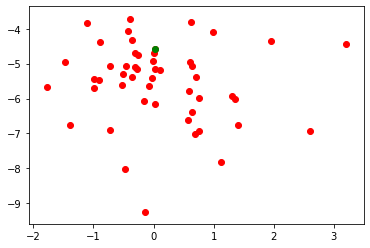

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import syft as sy
import numpy as np
from Dataset import load_dataset, getImage
from utils import averageModels
import random
import math
import matplotlib.pyplot as plt
from no_cluster import get_cluster
import copy

In [2]:
#random.seed(15)
P=2 #signal power threshold
#stream = BitStream()
key=[]
for i in range (10000): #generating a random password to activate training (Pilot signal)
    temp=random.randint(0,1)
    key.append(temp)

key1=[0]*len(key)
for i in range (len(key)):   #bpsk modulation
    if(key[i]==1):
        #print("yay")
        key1[i]=-math.sqrt(P)
    else:
        key1[i]=math.sqrt(P)

#print(key)
        
key_np=np.array(key1)

In [3]:
class Arguments():
    def __init__(self):
        self.images = 60000
        self.clients = 50
        self.rounds = 200
        self.epochs = 3
        self.local_batches = 64
        self.lr = 0.001
        self.C = 0.9 #fraction of clients used in the round
        self.drop_rate = 0.1 #fraction of devices in the selected set to be dropped for various reasons
        self.torch_seed = 0 #same weights and parameters whenever the program is run
        self.log_interval = 64
        self.iid = 'noniid'
        self.split_size = int(self.images / self.clients)
        self.samples = self.split_size / self.images 
        self.use_cuda = False
        self.save_model = True
        self.csi_low=0
        self.csi_high=1
 
args = Arguments()

In [4]:
#checking if gpu is available
use_cuda = False
#print(use_cuda)
device = torch.device("cuda:0" if use_cuda else "cpu")
kwargs = {'num_workers': 1, 'pin_memory': True} if use_cuda else {}

hook = sy.TorchHook(torch)
clients = []

#generating virtual clients
for i in range(int(args.clients)):
    clients.append({'hook': sy.VirtualWorker(hook, id="client{}".format(i+1))})
    
global_train, global_test, train_group, test_group = load_dataset(args.clients, args.iid) #load data

/home/test/anaconda3/lib/python3.7/site-packages/torchvision/datasets/mnist.py:45: UserWarning: train_labels has been renamed targets
  warnings.warn("train_labels has been renamed targets")


In [5]:
for inx, client in enumerate(clients):  #return actual image set for each client
    trainset_ind_list = list(train_group[inx]) 
    client['trainset'] = getImage(global_train, trainset_ind_list, args.local_batches)
    client['testset'] = getImage(global_test, list(test_group[inx]), args.local_batches)
    client['samples'] = len(trainset_ind_list) / args.images #useful while taking weighted average

#load dataset for global model (to compare accuracies)
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
global_test_dataset = datasets.MNIST('./', train=False, download=True, transform=transform)
# global_test_dataset = torch.utils.data.random_split(global_test_dataset, [10000, len(global_test_dataset)-10000])[0]
global_test_loader = DataLoader(global_test_dataset, batch_size=args.local_batches, shuffle=True)
trainloader = torch.utils.data.DataLoader(global_train, batch_size=4,
                                          shuffle=True, num_workers=2)

In [6]:
# def imshow(img):
#     img = img / 2 + 0.5     # unnormalize
#     npimg = img.numpy()
#     plt.imshow(np.transpose(npimg, (1, 2, 0)))


# # get some random training images
# dataiter = iter(trainloader)
# images, labels = dataiter.next()

# # show images
# imshow(images[0])
# print(np.shape(images[0]))

In [7]:
# class Net(nn.Module):
#     def __init__(self):
#         super(Net, self).__init__()
#         #self.quant = torch.quantization.QuantStub()
#         self.conv1 = nn.Conv2d(1, 5, 5, 1)
#         self.conv2 = nn.Conv2d(5, 10, 5, 1)
#         self.fc1 = nn.Linear(4*4*10, 10) #..,50
#         self.fc2 = nn.Linear(10, 10) #50,5  50 non iid 5 iid

#     def forward(self, x):
#         #x=self.quant(x)
#         x = F.relu(self.conv1(x))
#         x = F.max_pool2d(x, 2, 2)
#         x = F.relu(self.conv2(x))
#         x = F.max_pool2d(x, 2, 2)
#         x = x.view(-1, 4*4*10
#                    )
#         x = F.relu(self.fc1(x))
#         x = self.fc2(x)
#         return F.log_softmax(x, dim=1)
    
    
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(320, 50)
        self.fc2 = nn.Linear(50, 10)#50

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(-1, 320)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = self.fc2(x)
        return F.log_softmax(x)
        

In [8]:
def fedprox(params,global_params):
    global_param=[]
    ind=0
    for gp in global_params:
        global_param.append(gp)
    for p in params:
    #                 print(p.grad)
        lr=0.001
        mu=0.6
        if(p.grad is None):
            continue
        grad=p.grad.data #batch gradients
        p.data.sub_(lr,(grad+mu*(p.data.clone()-global_param[ind].data.clone())))
        ind+=1
    return(p)

In [9]:
def ClientUpdate(args, device, client,key_np,key,snr,csi,mu):
    gc=False
    client['model'].train()
    #simulating a wireless channel
    poptim=max((1/mu-1/csi),0)
    #print(mu,csi)
    print("Power Allocated=",poptim)
    print("CSI=",csi)
    
    snr__=10**(snr/10)
    
    absh=csi*poptim/snr__
    x=random.uniform(0,absh)
    #print(x)
    y=math.sqrt(absh*absh-x*x)
    #x=x*100
    #y=y*100
    #x=random.random()
    #y=random.random()
    #snr=10*math.log(poptim/(std*std),10)
    std=math.sqrt(poptim/snr__*absh*absh) #channel noise
    
    #print(x,y)
    h=complex(x,y)
    #std=math.sqrt(abs(h)/csi)
    #snr=poptim/(std*std)
    #print(std)
    print("SNR=",snr)
    #print("csi",abs(h)/(std*std))
    
    
    if(poptim!=0):
        data=client['model'].conv1.weight
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        data=data*math.sqrt(poptim) #transmitted signal
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data

    
    #print(client['model'].conv1.weight.size)
    client['model'].send(client['hook'])
    head['model'].send(client['hook'])
    
    print("Client:",client['hook'].id)
    
    key_np_received=h*key_np+(np.random.randn(len(key_np))*std*2)
    #print(key_np_received)
    key_np_received=(key_np_received/(h)).real
    
    for o in range (len(key_np_received)):  #demodulation bpsk
        if(key_np_received[o]>=0):
            key_np_received[o]=0
        else:
            key_np_received[o]=1
    
    key_np_received=key_np_received.tolist()
    key_np_received = [int(item) for item in key_np_received]
    #key_np=key_np.tolist()
    
    
    if(sum(np.bitwise_xor(key,key_np_received))/len(key)==0 and poptim>0): #...............................................checking if channel is good enough for transmission by checking BER..................................#
        gc=True #considering the client model for training
        for epoch in range(1, args.epochs + 1):
            for batch_idx, (data, target) in enumerate(client['trainset']): 
                data,target=data,target
                data = data.send(client['hook'])
                target = target.send(client['hook'])
                
                #train model on client
                data, target = data.to(device), target.to(device) #send data to cpu/gpu (data is stored locally)
                output = client['model'](data)
                loss = F.nll_loss(output, target)
                loss.backward()
                #client['optim'].step()
                params=client['model'].parameters()
                gp=head['model'].parameters()
                params=fedprox(params,gp)
                
                if batch_idx % args.log_interval == 0:
                    loss = loss.get() 
                    print('Model {} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                        client['hook'].id,
                        epoch, batch_idx * args.local_batches, len(client['trainset']) * args.local_batches, 
                        100. * batch_idx / len(client['trainset']), loss))
    else:
        print("Poor Channel, client not taken for averaging in this round")
            
                    
    client['model'].get() 
    head['model'].get()
    #CHANGE
    if(poptim!=0):
        data=client['model'].conv1.weight
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        data=data*math.sqrt(poptim) #transmitted signal
        data=h*data+(torch.randn(data.size())*std) #channel affecting data
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
    #CHANGE ENDS
    print()
    return gc

In [10]:
def test(args, model, device, test_loader, name):
    model.eval()    #no need to train the model while testing
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            if(use_cuda):
                data,target=data.cuda(),target.cuda()
                #model.cuda()
            else:
                data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item() # sum up batch loss
            pred = output.argmax(1, keepdim=True) # get the index of the max log-probability 
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss for {} model: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        name, test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    return(100. * correct / len(test_loader.dataset))


In [11]:
torch.manual_seed(args.torch_seed)
#global_model = Net() #redundant code as we don't use it for training: assigns a CNN to the global model

for client in clients: #give the model and optimizer to every client
    torch.manual_seed(args.torch_seed)
    client['model'] = Net().to(device)
    #client['model'] = torch.quantization.quantize_dynamic(
    #client['model'],  # the original model
    #{torch.nn.Linear},  # a set of layers to dynamically quantize
    #dtype=torch.fp)  # the target dtype for quantized weights
    client['optim'] = optim.SGD(client['model'].parameters(), lr=args.lr)
    

accuracy=[]
rc=1

[15.303890775815747, 16.751553780503095, 17.795767825462743, 18.343831307574284, 18.429004777441218, 18.596146162761706, 18.920581377071752, 19.240894052140593, 19.62336625054567, 19.996251205202647, 20.095472826104007, 20.18554291572515, 20.19679116644772, 20.466394740873444, 20.54304442884906, 20.559061872099633, 20.627161125173572, 20.8358788807459, 20.95447603565735, 21.401971926297648, 21.468728856918247, 21.659324222483548, 21.68289591724812, 21.776509657760826, 21.779623597231996, 21.815775973165703, 21.892401194648528, 22.279074206291572, 22.413286386353956, 22.759505313015037, 23.441494264008885, 24.359142194115776, 24.393242136878467, 24.416519102991984, 24.58631675863117, 24.606635953768066, 25.19975584949478, 25.946314383474565, 26.020553590505827, 26.308249827051657, 26.381393720848937, 26.890570619364794, 27.702644606592642, 28.295305647997363, 28.581022590341604, 29.294468017458385, 29.34150986996422, 33.410428743297544, 48.319060607329455]


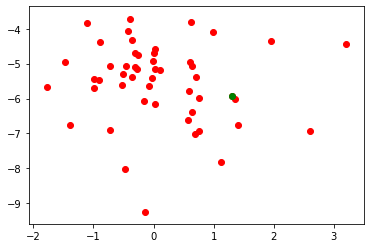

Power Allocated= 2.6502028383404825
CSI= 0.5214645665164089
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.375404


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/generic/frameworks/hook/hook.py:165: UserWarning: This overload of sub_ is deprecated:
	sub_(Number alpha, Tensor other)
Consider using one of the following signatures instead:
	sub_(Tensor other, *, Number alpha) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  response = method(*a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.164964
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.599412

Power Allocated= 0
CSI= 0.10943110441530846
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0043253910868923
CSI= 0.6395688646611906
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.525832


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.533552
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.807214

Power Allocated= 2.748208636948009
CSI= 0.5495501810278726
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12026026260490053
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.33262029280736805
CSI= 0.2361131032049021
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.290633
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.577107
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.166089

Power Allocated= 0.6182415388397353
CSI= 0.2531878157368308
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.261599
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.504273
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.396247

Power Allocated= 1.5489220869

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 2.2741, Accuracy: 2039/10000 (20%)

Power in training Round= 98.00559951981364



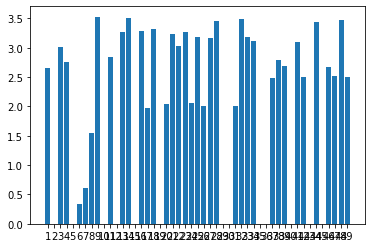

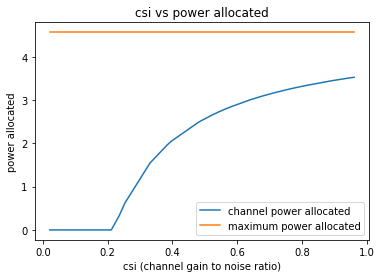

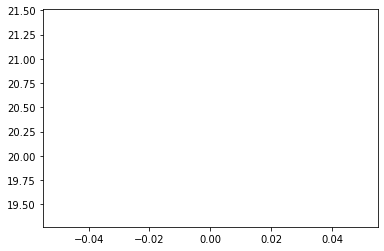

1
Power Allocated= 1.8302193904062625
CSI= 0.37797814034648036
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.312762672450516
CSI= 0.8597621635092648
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.365379


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.340013
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.281457

Power Allocated= 0
CSI= 0.1838729872032555
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6753054332014434
CSI= 0.5553798085870196
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.214224


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.097395
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.465018

Power Allocated= 3.4094360371999404
CSI= 0.9377001435659178
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.324365
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.029827
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.405198

Power Allocated= 0
CSI= 0.01563003812196062
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.021940729939177728
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13454992202627414
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04864501251290665
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.1549359126206

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 2.2402, Accuracy: 2842/10000 (28%)

Power in training Round= 97.99324590273652



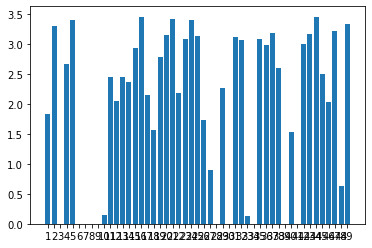

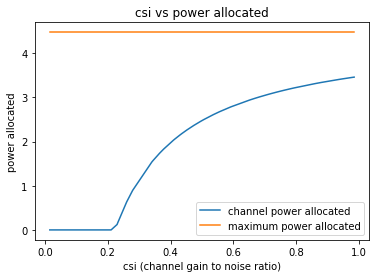

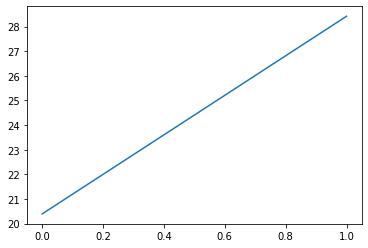

2
Power Allocated= 3.14031160346017
CSI= 0.8836013069274397
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.249642


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.400109
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.322436

Power Allocated= 1.671857113161058
CSI= 0.3845877782290694
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.429101
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.553954
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.109207

Power Allocated= 3.2664664433618404
CSI= 0.9944536314081129
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.126596
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.952831
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.353539

Power Allocated= 0
CSI= 0.19625413805322245
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2127643774851803
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.270885133901168
CSI= 0.99884

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.750745
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.427144

Power Allocated= 3.1727734406381316
CSI= 0.9096943630419293
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.289250
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.505710
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.896178

Power Allocated= 0
CSI= 0.029600311006447666
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17544533455124844
SNR= 19.996251205202647
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5381168993564147
CSI= 0.5767255995213226
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.164764
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.552974
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.861702

Power Allocated= 2.834014898137023
CSI= 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 2.2341, Accuracy: 3161/10000 (32%)

Power in training Round= 98.00284534216992



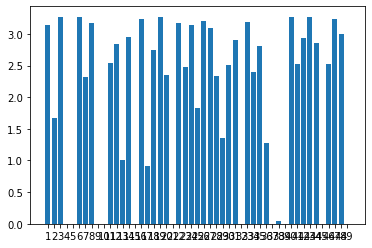

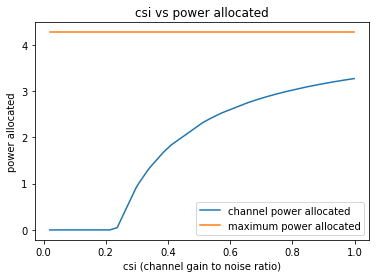

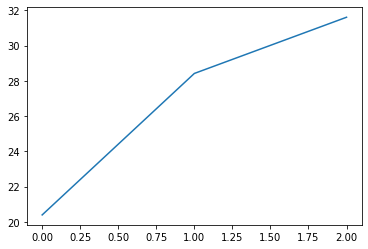

3
Power Allocated= 2.4663278845228342
CSI= 0.49554577485682627
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.348049132486173
CSI= 0.46810873486364957
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.229030


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.676087
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.550359

Power Allocated= 3.4392950971805223
CSI= 0.9569287924152505
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.160339
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.695494
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.926728

Power Allocated= 0
CSI= 0.02009728871125016
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3635217412124
CSI= 0.8922332236627721
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.276080


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.744010
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.543870

Power Allocated= 0
CSI= 0.020390239206315885
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10574048248916579
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0121402107042874
CSI= 0.6792718131569072
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.241421
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.404711
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.700489

Power Allocated= 0.5266385709798898
CSI= 0.2526741540578775
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.359446
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.524121
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.358852

Power Allocated= 2.9712860945339767
CSI= 0.66

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 2.1069, Accuracy: 4226/10000 (42%)

Power in training Round= 97.99554359345638



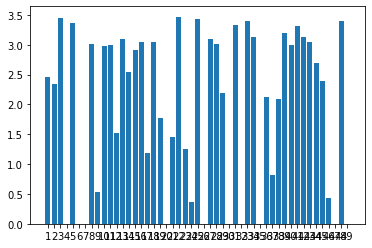

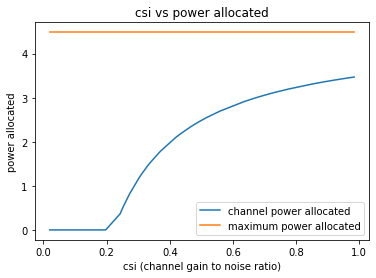

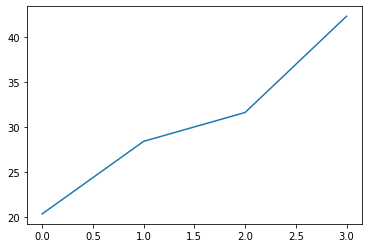

4
Power Allocated= 2.129905271434935
CSI= 0.3889370514982896
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1694235006156719
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.574805084958872
CSI= 0.3198761097438645
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.789721


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.544167
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.307594

Power Allocated= 0
CSI= 0.006320921608206964
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.22172931489624
CSI= 0.6760017531443994
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.220330
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.629123
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.176727

Power Allocated= 2.9000777928415076
CSI= 0.5552663153300345
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.936112
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.073510
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.573199

Power Allocated= 0.7493435453160888
CSI= 0.25305744805780506
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.329815
Model client7 Train Epoch: 2 [0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 1.7213, Accuracy: 4293/10000 (43%)

Power in training Round= 98.00247208930364



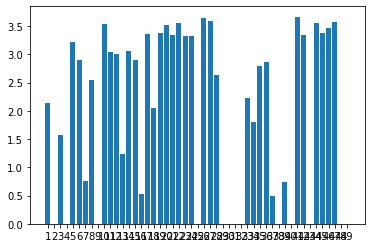

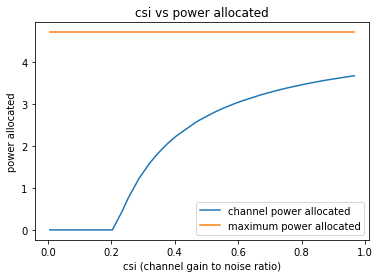

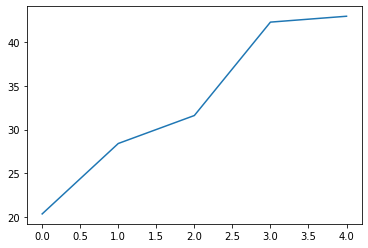

5
Power Allocated= 2.5806091448623496
CSI= 0.5482753502772136
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.832724


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.045015
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.517291

Power Allocated= 0
CSI= 0.01996263095959072
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.49824993266552786
CSI= 0.25599932591167807
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.740532


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.286250
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.174301

Power Allocated= 0.09077196605497573
CSI= 0.2318174959830993
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.657225
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.459814
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.460711

Power Allocated= 3.2701977037751
CSI= 0.8815912608300475
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.008256
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.892530
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.602501

Power Allocated= 0.36730550758685965
CSI= 0.24769613423509174
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.479746
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.391765
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.300611

Power Allocated= 2.5628057940853486
CSI= 0.542975293300556

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 1.0387, Accuracy: 7148/10000 (71%)

Power in training Round= 98.00740743497606



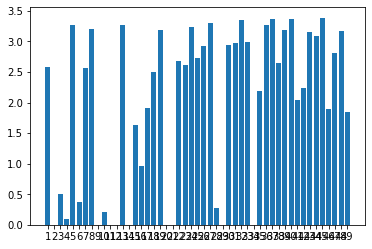

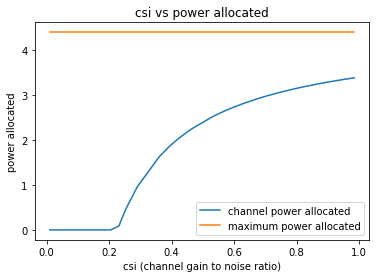

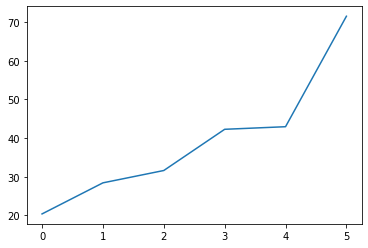

6
Power Allocated= 2.7624799282677843
CSI= 0.7098715692740971
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.332246


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.704789
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.146345

Power Allocated= 2.878519363335286
CSI= 0.7735949829701078
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.277776
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.482967
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.192169

Power Allocated= 2.5874495349328663
CSI= 0.6314184012085072
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.607667
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.191308
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.144567

Power Allocated= 3.0383634634298176
CSI= 0.882751227514791
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.807281
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.538405
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.142854

Power Allocated= 1.4382417986608727
CSI= 0.3659058243585219


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.302632
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.211920

Power Allocated= 2.3645107262374743
CSI= 0.553503066349527
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.825937
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011215
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.337199

Power Allocated= 0
CSI= 0.10745776748617164
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1228297637562656
CSI= 0.9538747318852911
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.092216
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.122844
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.122796

Power Allocated= 2.0471324349860716
CSI= 0.47079804152961946
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.778783
Model client11 Train Epoch

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5969, Accuracy: 8593/10000 (86%)

Power in training Round= 98.00413296166549



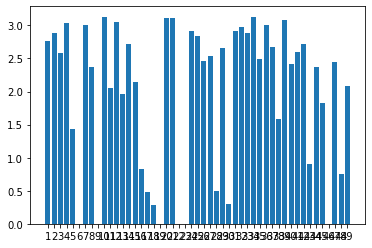

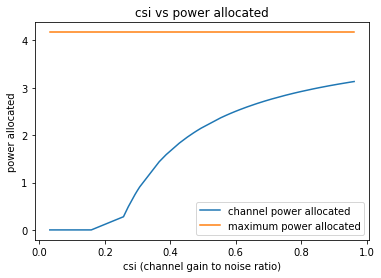

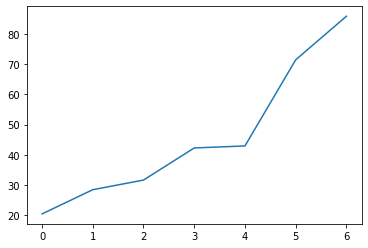

7
Power Allocated= 2.535536459072816
CSI= 0.5297517698060208
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3320715525914011
CSI= 0.24443055990418527
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.711344


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.130568
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.338949

Power Allocated= 0
CSI= 0.09389330427610398
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.516656197096481
CSI= 0.5245057409093011
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.667851


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.127694
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.515918

Power Allocated= 3.095120656034384
CSI= 0.7529596778597882
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2073637870349687
CSI= 0.45129424161525167
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.489202
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052047
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.109854

Power Allocated= 3.2481066968458743
CSI= 0.8509868244648253
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.941764
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.174397
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.077079

Power Allocated= 0.5116284470376198
CSI= 0.2556508700889002
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.742307
Model client8 T

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6846, Accuracy: 8427/10000 (84%)

Power in training Round= 98.00194755261299



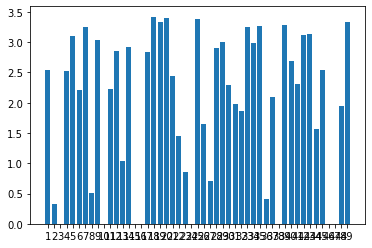

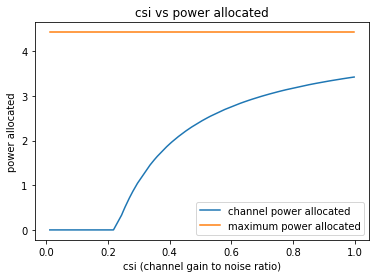

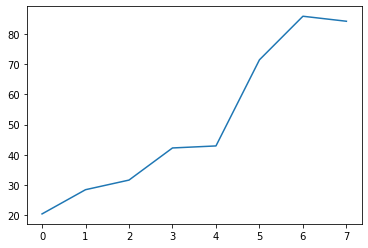

8
Power Allocated= 2.43349428927238
CSI= 0.5352399073215252
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8107394926974267
CSI= 0.6706566834376778
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.206037


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.173813
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.179383

Power Allocated= 1.1042871491113377
CSI= 0.3127415716588998
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.877407
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.105933
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.498295

Power Allocated= 0.5182133826332147
CSI= 0.26429841309252033
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.803861
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074474
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.233639

Power Allocated= 0.07517106070020318
CSI= 0.2365943116448207
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.356322
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.400812
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.931696

Power Allocated= 3.2234898488276595
CSI= 0.9273637542618

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.256429
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.053199

Power Allocated= 3.2549603890645393
CSI= 0.9552421509675114
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.992367
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.137197
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.194730

Power Allocated= 0
CSI= 0.22865482304272633
SNR= 20.466394740873444
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.865056233263722
CSI= 0.6960108880856114
SNR= 20.54304442884906
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.314992
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.124062
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.057582

Power Allocated= 3.177662291808417
CSI= 0.8895585689196169
SNR= 20.559061872099633
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.056919
Model client17 Train E

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6052, Accuracy: 8887/10000 (89%)

Power in training Round= 97.99555143115059



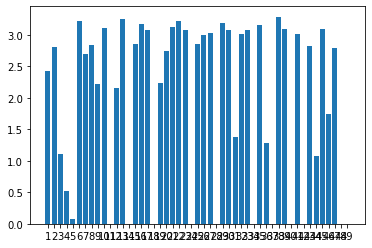

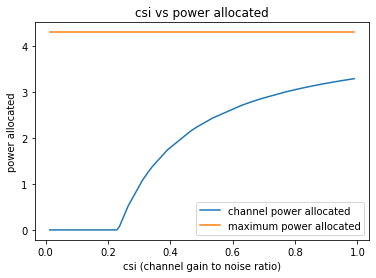

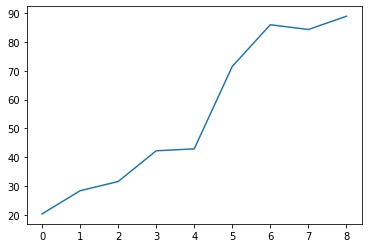

9
Power Allocated= 3.0274599397511137
CSI= 0.7358948783926421
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.694800367257515
CSI= 0.5911740157895745
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.896044


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.093149
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.013900

Power Allocated= 3.234180581047367
CSI= 0.8679281548909087
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.454003
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.063680
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.130532

Power Allocated= 2.912830428035325
CSI= 0.6786473938528557
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.691167
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.335179
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.093390

Power Allocated= 2.80816046339814
CSI= 0.6336375826226233
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.077812
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.152427
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.236056

Power Allocated= 2.8297243325205574
CSI= 0.6424153388930237
SN

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.247438
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.390622

Power Allocated= 3.0284527466067175
CSI= 0.736432917372195
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.868578
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.283308
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.160400

Power Allocated= 2.3760756558704816
CSI= 0.49744462103073206
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.105326
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107842
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.286417

Power Allocated= 3.264776539795002
CSI= 0.8916048043004232
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.993789
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.161753
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.126359

Power Allocated= 3.1449755800834356
CSI= 0.80555

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6439, Accuracy: 8296/10000 (83%)

Power in training Round= 98.00500381388413



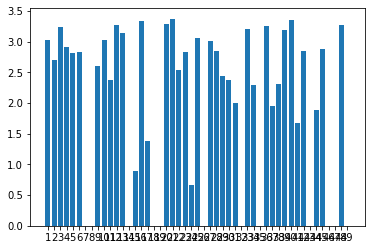

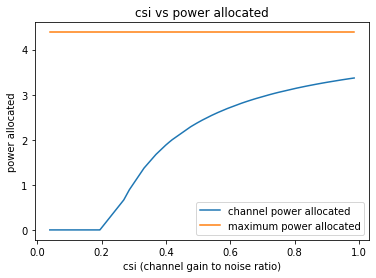

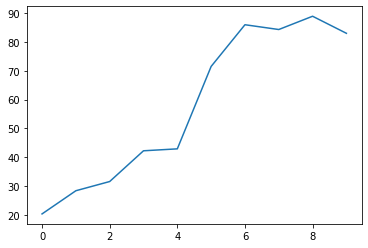

10
Power Allocated= 1.1955521716597133
CSI= 0.3126458629480019
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.131619717418476
CSI= 0.4420007666904754
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.112930


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.156237
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.178801

Power Allocated= 2.7386672123415616
CSI= 0.6040865173769193
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.556066
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.262267
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.039481

Power Allocated= 1.9455176063169124
CSI= 0.4084063711819307
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.736933
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.101174
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.094991

Power Allocated= 3.205940423214357
CSI= 0.8416666689170336
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.753861
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.424467
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.235510

Power Allocated= 2.8974877167102204
CSI= 0.6681939284809809

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.329499
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.092347

Power Allocated= 2.6203353261224143
CSI= 0.5637856019936603
SNR= 20.627161125173572
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.546928
Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.115787
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.058415

Power Allocated= 3.0365441460048452
CSI= 0.7366400641704063
SNR= 20.8358788807459
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.193131
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.272694
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.302900

Power Allocated= 2.642339689777168
CSI= 0.5708676394495051
SNR= 20.95447603565735
Client: client20
Model client20 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.428814
Model client20 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.540888
Model client20 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.483103

Power Allocated= 3.3042967617909587
CSI= 0.91763

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5325, Accuracy: 9044/10000 (90%)

Power in training Round= 97.9981495258283



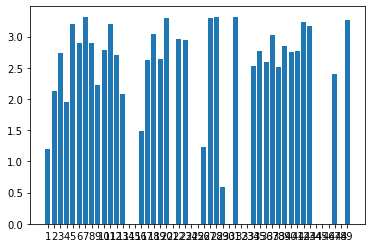

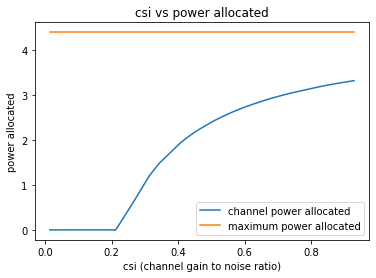

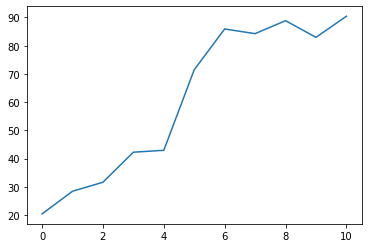

11
Power Allocated= 2.94695834671245
CSI= 0.7292861705206278
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.967488


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.275387
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.338192

Power Allocated= 2.0501023837622423
CSI= 0.44090548105202987
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.847413
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.304340
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.396463

Power Allocated= 2.9308047305606
CSI= 0.7207947692730071
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.804964
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020273
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.021848

Power Allocated= 2.7526937377022307
CSI= 0.6387864274250648
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.874602
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.162678
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.072212

Power Allocated= 1.4807857933142072
CSI= 0.3524382599035252


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031938
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029477

Power Allocated= 1.9902856592343898
CSI= 0.42957604783149583
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.893894
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.124416
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.226569

Power Allocated= 3.3113884120545007
CSI= 0.9932717972348641
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.819415
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006487
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.193506

Power Allocated= 2.2301450442476276
CSI= 0.4789232703149826
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.934582
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000191
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 3.0838510456845087
CSI= 0.81

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5345, Accuracy: 8054/10000 (81%)

Power in training Round= 98.0036912012738



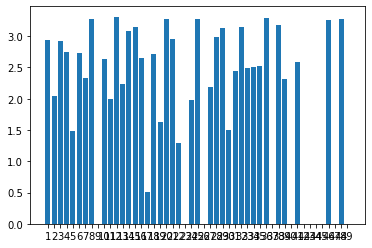

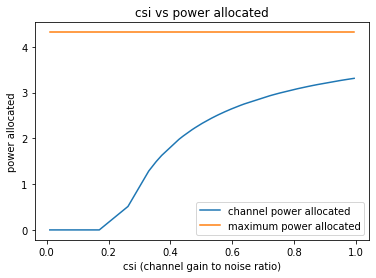

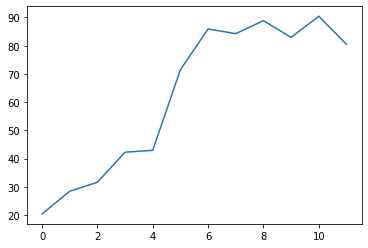

12
Power Allocated= 2.6687377982078533
CSI= 0.6387003027385086
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.818371


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.189089
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.165266

Power Allocated= 1.795770994937401
CSI= 0.41006355854471765
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.628010
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.095298
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.016987

Power Allocated= 3.233888661903956
CSI= 0.9994715970873148
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.653055
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.200631
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004676

Power Allocated= 2.1506810927158106
CSI= 0.479907185614425
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.086169
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.097895
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.267612

Power Allocated= 0
CSI= 0.07099774674099191
SNR= 18.42900477

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.189404
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.032161

Power Allocated= 2.875368907331535
CSI= 0.735808947562915
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.452830
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.078540
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000309

Power Allocated= 0
CSI= 0.07342883973622272
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5770937918366705
CSI= 0.6033824829133461
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.346070
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.129736
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023668

Power Allocated= 3.0084318891011126
CSI= 0.8156703620440875
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.623507
Model client11 Train Epoch: 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3107, Accuracy: 9083/10000 (91%)

Power in training Round= 98.0036680887721



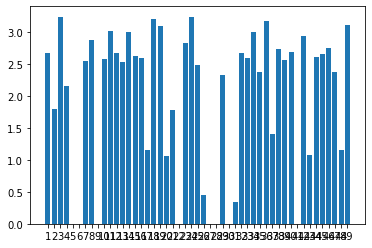

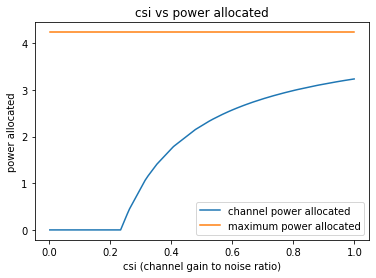

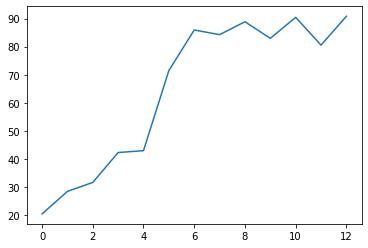

13
Power Allocated= 0
CSI= 0.20953453662201837
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06132672349479695
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13619317017117438
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.106251431505789
CSI= 0.40976164991012565
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.617039


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.157378
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.224495

Power Allocated= 3.5270138995969886
CSI= 0.9806991989144035
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.945003
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.156168
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.446048

Power Allocated= 0.4193931316088193
CSI= 0.24228906442416276
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.537856
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032119
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.144513

Power Allocated= 3.468282371715278
CSI= 0.9272892288297052
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.703893
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.088029
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.071607

Power Allocated= 3.3947392699218444
CSI= 0.868089251933049

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4615, Accuracy: 8841/10000 (88%)

Power in training Round= 98.00492200721851



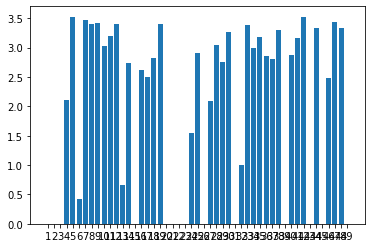

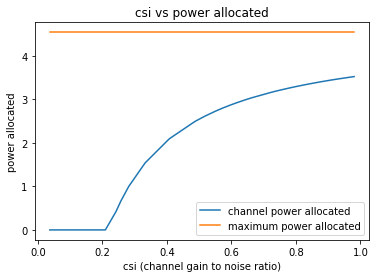

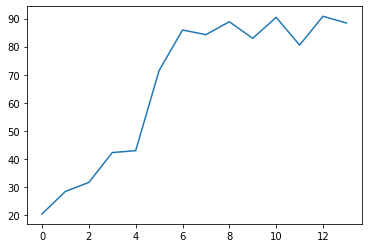

14
Power Allocated= 2.620379505794286
CSI= 0.48991017478133414
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.894249


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.145325
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.146805

Power Allocated= 0.8247408568157271
CSI= 0.2606318807295517
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.205525
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.068061
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.062256

Power Allocated= 3.2587654681724727
CSI= 0.712857682840562
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.945811
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.444922
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.040143

Power Allocated= 0
CSI= 0.17861223405900317
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.4703464759097482
CSI= 0.2385938116275903
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.792773


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.231783
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.212958

Power Allocated= 2.953044565391579
CSI= 0.5853000311971804
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.406345
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031537
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011357

Power Allocated= 0
CSI= 0.1990282721595864
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.523752711696201
CSI= 0.46776681881142235
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.480776
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031678
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.376094

Power Allocated= 0
CSI= 0.004579851946118874
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5334379403484517
CSI= 0.8864

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3934, Accuracy: 9146/10000 (91%)

Power in training Round= 98.00616038334641



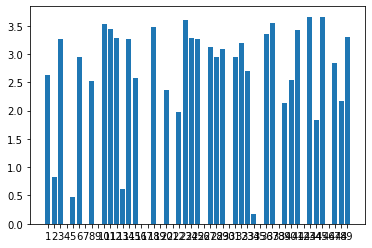

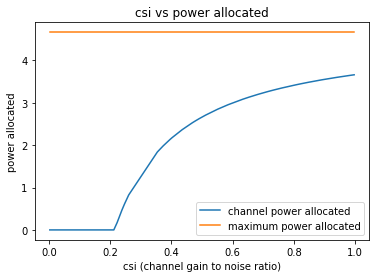

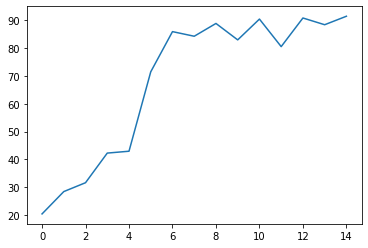

15
Power Allocated= 2.1935785212436447
CSI= 0.44497580294191086
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.867458


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.170004
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.175696

Power Allocated= 1.7806202438847163
CSI= 0.37590148404808543
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.483190
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008133
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.114708

Power Allocated= 3.3903830711282295
CSI= 0.9519198062250529
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1999001642538064
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.56193977638662
CSI= 0.3473486239937782
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.004882


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.316160
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.219553

Power Allocated= 2.440536265892367
CSI= 0.4999111494997184
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.397644
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.050889
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.088604

Power Allocated= 3.2956454373829427
CSI= 0.8731746223681535
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.836260
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.114875
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.087274

Power Allocated= 0.06384760265648648
CSI= 0.2284646831661573
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.486246
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009319
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.056459

Power Allocated= 2.941856244493006
CSI= 0.6670956151212515

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5368, Accuracy: 8518/10000 (85%)

Power in training Round= 98.00469296255858



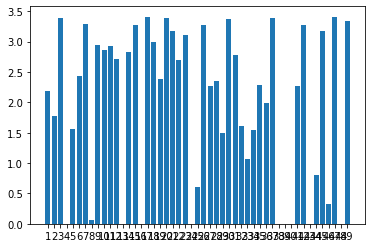

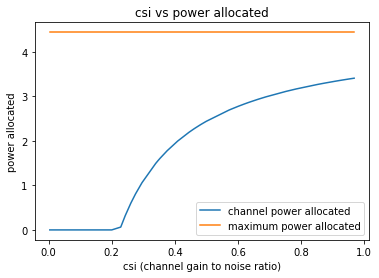

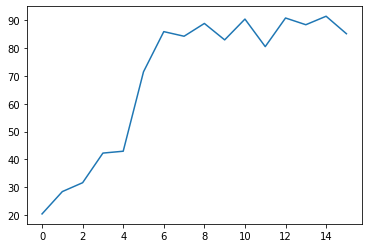

16
Power Allocated= 3.594974476410102
CSI= 0.8211473192259855
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.614953


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.097967
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.611437

Power Allocated= 3.5648368168249798
CSI= 0.801316765915447
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.704500
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.085453
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.202996

Power Allocated= 2.90486402235462
CSI= 0.5241313400790606
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.576858
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073151
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.056179

Power Allocated= 1.4842334254769054
CSI= 0.30043117953397525
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.307846
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.088536
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.087064

Power Allocated= 0
CSI= 0.10118200898183316
SNR= 18.42900477

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004337
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.052627

Power Allocated= 2.193867688445562
CSI= 0.3818375075629995
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.279844
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.108707
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.020684

Power Allocated= 0
CSI= 0.057817303884733384
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.39172075550321406
CSI= 0.22618999711416266
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.422642
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.291861
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.344822

Power Allocated= 3.272765470839672
CSI= 0.6493433631500335
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.390217
Model client10 Train Epoch: 2

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5908, Accuracy: 8391/10000 (84%)

Power in training Round= 98.00156650832996



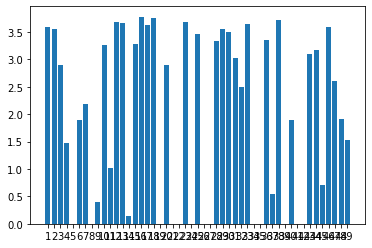

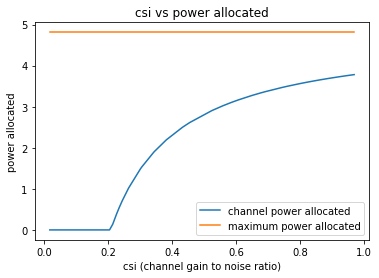

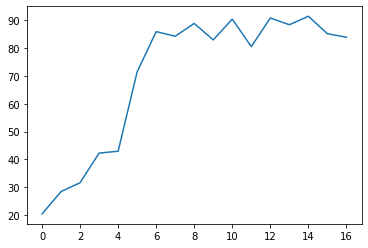

17
Power Allocated= 0
CSI= 0.05947616843677295
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.403338496964643
CSI= 0.48955132099323917
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.047423084371821
CSI= 0.714999606126593
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02216885923728551
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3317663657888845
CSI= 0.47297897426299174
SNR= 18.429004777441218
Client: client5


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.829152
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.281677
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.332474

Power Allocated= 3.0112561866298755
CSI= 0.6969762752374662
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.259548
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007567
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.146860

Power Allocated= 1.1960954467150002
CSI= 0.307698953354529
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.601252
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007511
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.141405

Power Allocated= 2.627965752845432
CSI= 0.5500370035644313
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.467424
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011101
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.043169

Po

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5029, Accuracy: 8504/10000 (85%)

Power in training Round= 98.00375377980409



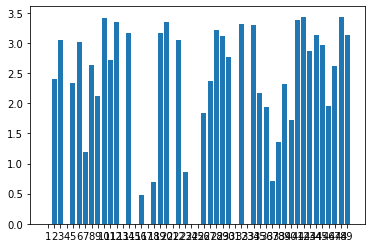

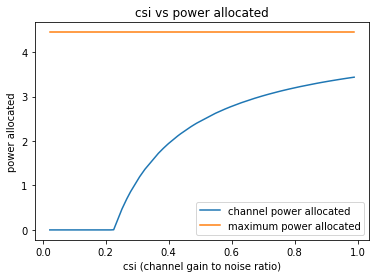

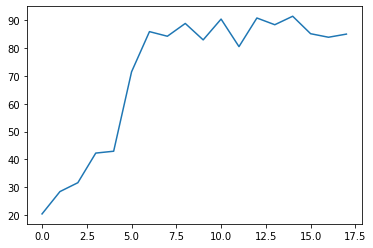

18
Power Allocated= 2.8372937612090565
CSI= 0.7128249013175727
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.803774


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.223474
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.104492

Power Allocated= 2.666292427152018
CSI= 0.6353763328370822
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.928362
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.065818
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.134888

Power Allocated= 1.7887229191434066
CSI= 0.40792352230686757
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.957378
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054487
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.177486

Power Allocated= 1.7148359331639278
CSI= 0.3959883389040324
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.959830
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.228540
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.114698

Power Allocated= 1.804076962797006
CSI= 0.4104945628736515

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.104941
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001569

Power Allocated= 0.7724118046735331
CSI= 0.2883713377721284
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.723829
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.235165
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.146874

Power Allocated= 3.090651180013734
CSI= 0.8699346428994295
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.161638
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016809
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000012

Power Allocated= 2.6357746094396544
CSI= 0.623290542783643
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.075618
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008065
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000396

Power Allocated= 2.4236073371907914
CSI= 0.55049

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3375, Accuracy: 8908/10000 (89%)

Power in training Round= 98.00261557195432



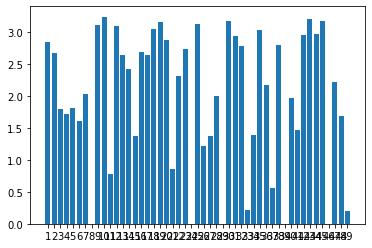

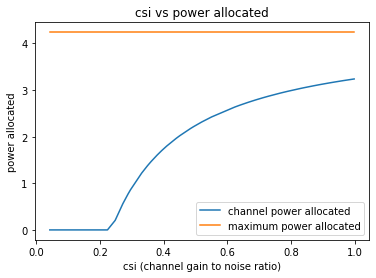

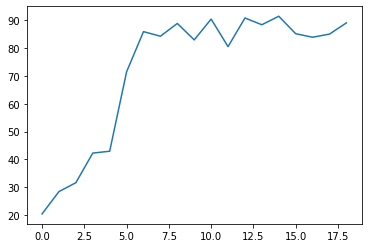

19
Power Allocated= 2.714596607109235
CSI= 0.5006271308565597
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.365651


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.276084
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.040040

Power Allocated= 1.6178085176043244
CSI= 0.3231766758928529
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.702891
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.153413
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.571320

Power Allocated= 3.170460631539116
CSI= 0.6486638261701092
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.735999
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.101709
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.054010

Power Allocated= 3.390749343933718
CSI= 0.7568064052966885
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.486334
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.105246
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.062412

Power Allocated= 0
CSI= 0.20075786928379324
SNR= 18.42900477

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044457
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.073233

Power Allocated= 2.672808083315019
CSI= 0.49036839418039724
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.441852
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.306065
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.031456

Power Allocated= 3.305891755673313
CSI= 0.7111366637808324
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.212546
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.017506
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.778469

Power Allocated= 1.3537635973491216
CSI= 0.29776725517872427
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.978271
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.080194
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.320030

Power Allocated= 3.536302990799782
CSI= 0.850493286111301
S

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3962, Accuracy: 8717/10000 (87%)

Power in training Round= 98.00327611764438



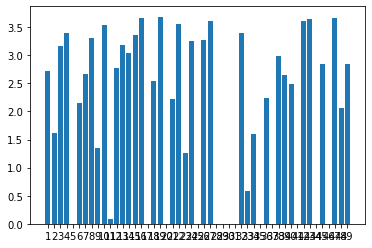

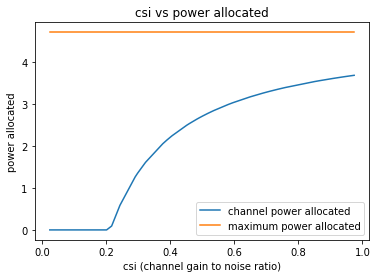

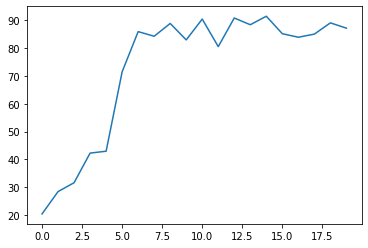

20
Power Allocated= 0
CSI= 0.17929222997229677
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.608845811618698
CSI= 0.7950339777983636
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8217544624733808
CSI= 0.24722494777145343
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.405713


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052296
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.211303

Power Allocated= 0
CSI= 0.018865054842500117
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6991821362500703
CSI= 0.8565519200102154
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.598717
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.432456
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.295343

Power Allocated= 2.97116917134589
CSI= 0.5275695953865217
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.774683
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019572
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.018523

Power Allocated= 3.6957863422019743
CSI= 0.8540677155271034
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.56945285316

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3500, Accuracy: 9107/10000 (91%)

Power in training Round= 97.99400647049934



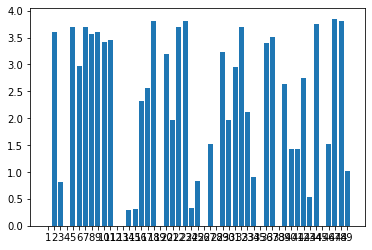

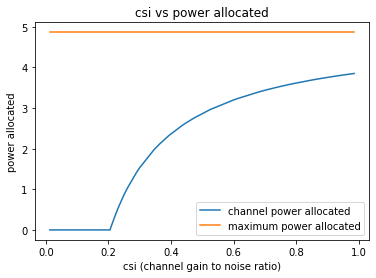

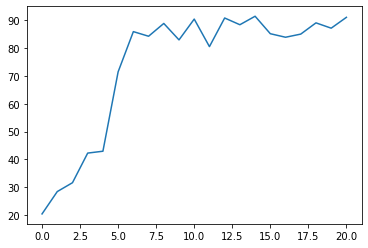

21
Power Allocated= 0
CSI= 0.1983432558670163
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.531633656734087
CSI= 0.8203713514737865
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.340774


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.122367
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.033855

Power Allocated= 1.1145080720877285
CSI= 0.2750210166004138
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.318619
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054900
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.043587

Power Allocated= 0
CSI= 0.2054511824313795
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7027101714740986
CSI= 0.9543044185979851
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.878283
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.191311
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.450864

Power Allocated= 3.4133356460309985
CSI= 0.7477987544245208
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.370607
Model client6 Train Epoch: 2 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3751, Accuracy: 9163/10000 (92%)

Power in training Round= 98.00039042457243



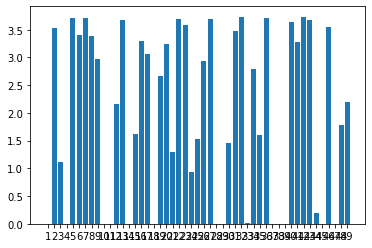

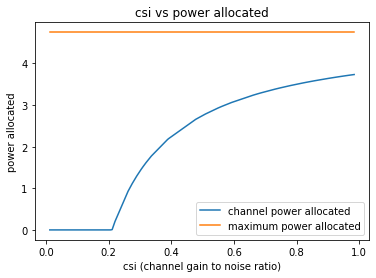

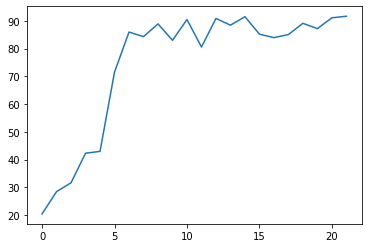

22
Power Allocated= 3.2163852381706315
CSI= 0.6980241319106252
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.986417


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.170967
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.254355

Power Allocated= 3.5593134500708596
CSI= 0.9176947016813052
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.596494
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037362
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012519

Power Allocated= 3.0275674023327044
CSI= 0.6167383798233365
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.384278
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099711
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.122691

Power Allocated= 0
CSI= 0.14711133976481527
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9256353579588152
CSI= 0.5802600946091268
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.677785


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.203990
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012395

Power Allocated= 0
CSI= 0.032496426071516704
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.011980864225537569
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.27415111902194766
CSI= 0.22857929975168112
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.508205
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.049975
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.048249

Power Allocated= 2.0383423701300534
CSI= 0.3830451800652058
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.540051
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.226492
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.053999

Power Allocated= 3.4175611416025182
CSI= 0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3929, Accuracy: 8762/10000 (88%)

Power in training Round= 98.00028024713473



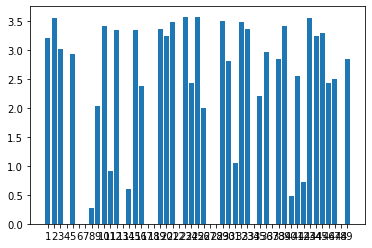

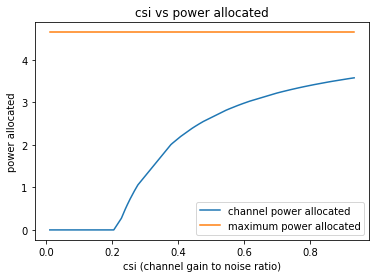

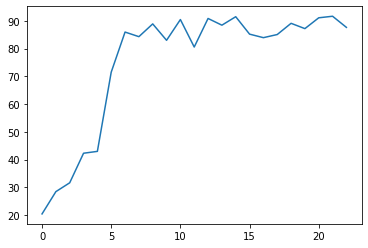

23
Power Allocated= 3.2234739342593093
CSI= 0.8281032513404847
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.835426


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024063
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.058619

Power Allocated= 3.1899588180831513
CSI= 0.8057407415926044
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3052318254496282
CSI= 0.319915952428263
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.239165
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030150
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004628

Power Allocated= 0
CSI= 0.1541134037331633
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7198817671783
CSI= 0.584395113178276
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2210904456385766
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power A

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014174
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.010185

Power Allocated= 3.36068399642196
CSI= 0.9342574070735352
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.530115
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001807
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000213

Power Allocated= 3.333728563884556
CSI= 0.9113076614436091
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.534990
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.240898
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003205

Power Allocated= 2.2637875840354402
CSI= 0.461410991261782
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.545325
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.101381
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.090608

Power Allocated= 2.702164662198631
CSI= 0.5784064148728685


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4083, Accuracy: 8407/10000 (84%)

Power in training Round= 98.00114115880507



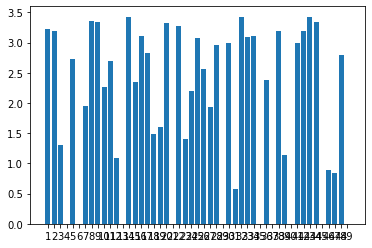

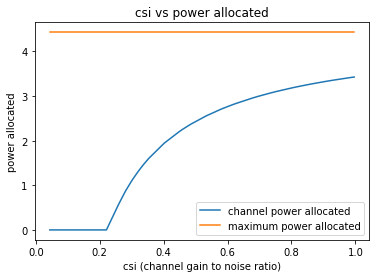

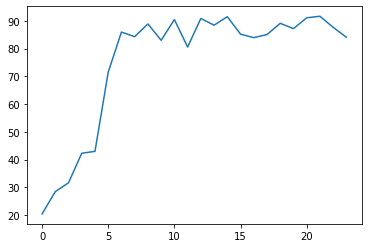

24
Power Allocated= 1.3894208007748872
CSI= 0.367502601977573
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.407996


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.085638
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004747

Power Allocated= 2.818893117513894
CSI= 0.7742353953260622
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.405524
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009339
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.158952

Power Allocated= 2.6714827216106105
CSI= 0.694923532065489
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.374371
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003672
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.025593

Power Allocated= 3.036493246263047
CSI= 0.9311015364585778
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.082488
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.098905
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.069921

Power Allocated= 2.7264357285549474
CSI= 0.7225150357281876
S

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073786
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009729

Power Allocated= 3.021660103390855
CSI= 0.9184171286027553
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.506345
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.105114
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001239

Power Allocated= 2.3432208628871223
CSI= 0.5658447803710706
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.337799
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036283
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.019799

Power Allocated= 0
CSI= 0.06368068091304346
SNR= 20.19679116644772
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7196704759230155
CSI= 0.7190005633135691
SNR= 20.466394740873444
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.768912
Model client15 Train 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3986, Accuracy: 8514/10000 (85%)

Power in training Round= 97.99692011584081



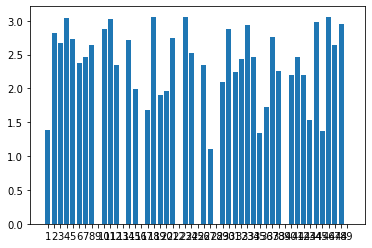

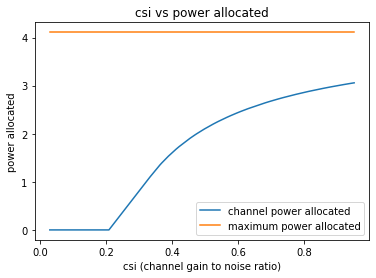

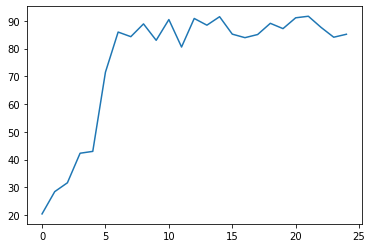

25
Power Allocated= 3.6127433937396543
CSI= 0.9634034151863518
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.250913


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.125352
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.055460

Power Allocated= 1.0936030296654438
CSI= 0.28112574053618045
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.612031
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037581
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.391062

Power Allocated= 3.5813357677362285
CSI= 0.935108696004813
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.384284
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014960
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.059179

Power Allocated= 3.5460127273274678
CSI= 0.9052088490937066
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.948321
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.120096
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009303

Power Allocated= 2.996406586761082
CSI= 0.6044766654927523

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048347
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006962

Power Allocated= 2.4874881788330776
CSI= 0.4622691342728975
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.500398
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002641
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000694

Power Allocated= 2.262876732186074
CSI= 0.4187861727233043
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.234640
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027613
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.165961

Power Allocated= 3.539477544439235
CSI= 0.8998853922366816
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.225572
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.085131
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.0721557589376283
CSI= 0.63348296817054

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4398, Accuracy: 8524/10000 (85%)

Power in training Round= 97.99352268379502



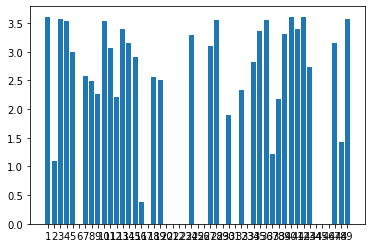

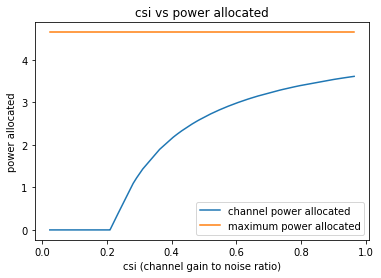

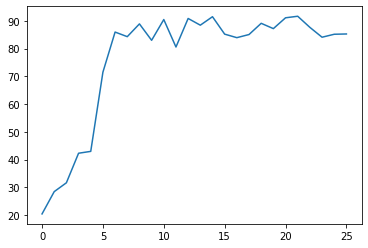

26
Power Allocated= 3.086773526059495
CSI= 0.5587066765503431
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.813337


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.133304
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.167091

Power Allocated= 3.711941506294912
CSI= 0.8586049605563274
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.787788
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.035032
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002124

Power Allocated= 3.585474010773854
CSI= 0.7745048698431692
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.439098
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006653
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.088396

Power Allocated= 3.596998692392731
CSI= 0.7814803020932709
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.499135
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.066867
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000163

Power Allocated= 3.4964705684803548
CSI= 0.7245584479834213
S

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.091077
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.292807

Power Allocated= 2.603879225262661
CSI= 0.4399971001522083
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.825755
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026163
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002035

Power Allocated= 1.5442389847789668
CSI= 0.30008560015004226
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.551698
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.114453
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.106754

Power Allocated= 3.3165387479072868
CSI= 0.6409916484438555
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.841273
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006473
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 1.7949205330616311
CSI= 0.3244

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3328, Accuracy: 9397/10000 (94%)

Power in training Round= 97.99954376379853



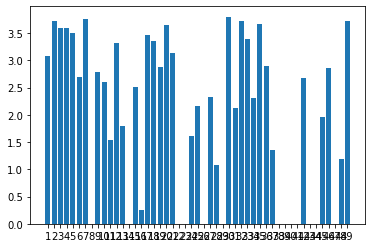

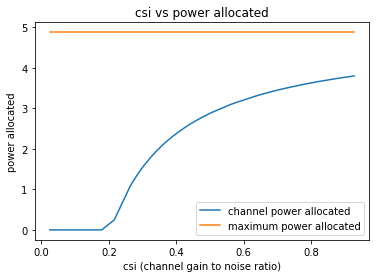

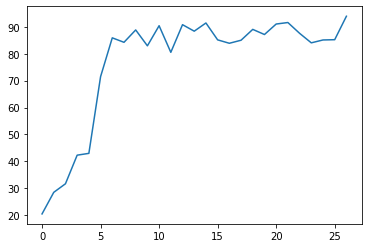

27
Power Allocated= 3.687768457194226
CSI= 0.8885116892628544
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.803283465874212
CSI= 0.990135686816541
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5637728175106584
CSI= 0.23532328468759944
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.763309


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.135847
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004606

Power Allocated= 2.9659591141998076
CSI= 0.5413344180165577
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.421856781439554
CSI= 0.4181669675592088
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.905826
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.154061
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.440570

Power Allocated= 0.8091349624992139
CSI= 0.24974332064306604
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.374709
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010811
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009560

Power Allocated= 3.0221321321462
CSI= 0.558311779211649
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.453237
Model client7 Train

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019735
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004500

Power Allocated= 2.8695256798058164
CSI= 0.5144772950470118
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.743151
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003677
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006428

Power Allocated= 3.575713947562319
CSI= 0.8080598438570283
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.809708
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000435
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.1809986264980967
CSI= 0.612652214167202
SNR= 20.466394740873444
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.534570
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.139010
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015066

Power Allocated= 0
CSI= 0.037236926141132276
SNR

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6189, Accuracy: 8202/10000 (82%)

Power in training Round= 98.00120204889383



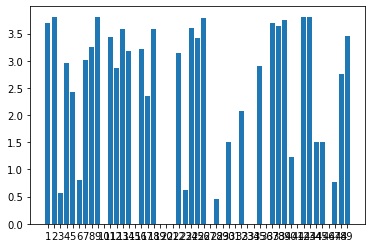

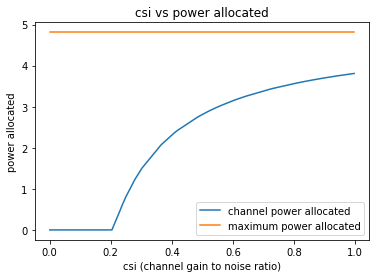

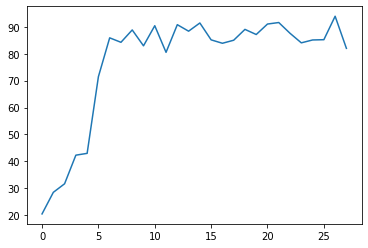

28
Power Allocated= 0.8867898117613588
CSI= 0.2878585162768359
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.359704


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.397602
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.144712

Power Allocated= 3.2919759746705552
CSI= 0.9356789304113592
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.953631
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079243
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.099630

Power Allocated= 3.1199032948212855
CSI= 0.8059216858501903
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.630073
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020259
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.163719

Power Allocated= 1.8392854164514074
CSI= 0.39659983382036945
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.994575
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.029561
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.203627

Power Allocated= 0
CSI= 0.14511209495657862
SNR= 18.42900

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.083940
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011682

Power Allocated= 2.582838411727927
CSI= 0.562467583855942
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.792861
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003102
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000116

Power Allocated= 0
CSI= 0.1577271016192925
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.749453030822324
CSI= 0.6206301371489098
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.508656
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000801
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.426451

Power Allocated= 2.329417600166495
CSI= 0.4922953206949825
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.702035
Model client11 Train Epoch: 2 [

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2971, Accuracy: 9187/10000 (92%)

Power in training Round= 97.9927843845918



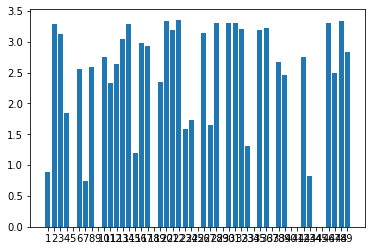

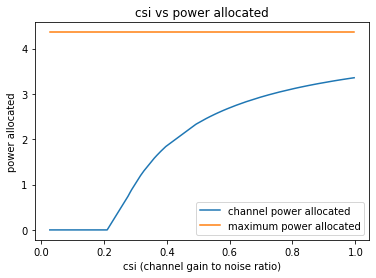

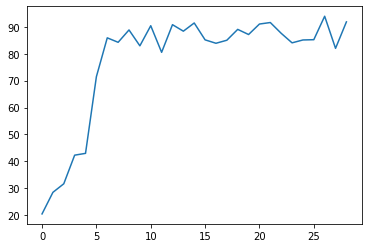

29
Power Allocated= 0
CSI= 0.022065305216364406
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.702950218860951
CSI= 0.5903836784972375
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.480241


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.056386
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000102

Power Allocated= 0
CSI= 0.22252026357153687
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8902655412946014
CSI= 0.6637909294644472
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5265048630093143
CSI= 0.34840060030981546
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.210426
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.167137
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.099463

Power Allocated= 0
CSI= 0.216284561750537
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2676051915411866
CSI= 0.4696690564449486
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.562355
Mod

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3723, Accuracy: 8801/10000 (88%)

Power in training Round= 98.00419416380768



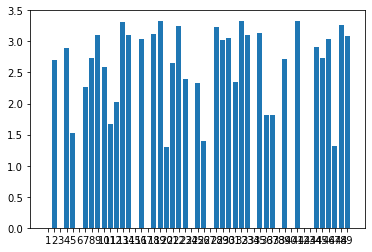

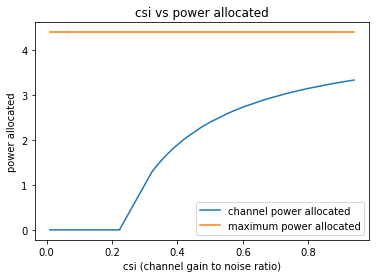

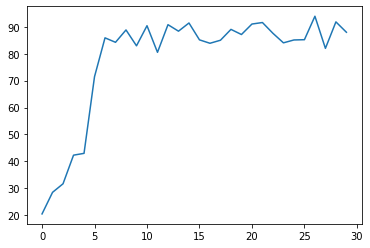

30
Power Allocated= 2.8003340839542736
CSI= 0.45399494087309966
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.017230


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069361
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.185564

Power Allocated= 0.2623073636571389
CSI= 0.21093956026902783
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.439811
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021220
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002939

Power Allocated= 2.837509620031783
CSI= 0.46178878351595687
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.522182
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.066536
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000347

Power Allocated= 3.9445001715214563
CSI= 0.9447316584823611
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.808672
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.082275
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.179219

Power Allocated= 3.995992519325916
CSI= 0.993039506306441

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000079
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006374

Power Allocated= 3.7252359141807947
CSI= 0.7826159786015312
SNR= 20.466394740873444
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.476082
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.091324
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.088850

Power Allocated= 2.8813902918657814
CSI= 0.47133982619180526
SNR= 20.54304442884906
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.337454
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001430
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003502

Power Allocated= 0
CSI= 0.09451334617257712
SNR= 20.559061872099633
Client: client17
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2209792351111872
CSI= 0.2644087872446611
SNR= 20.627161125173572
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.340704
Model client18 Tra

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.7159, Accuracy: 7704/10000 (77%)

Power in training Round= 98.00761510573459



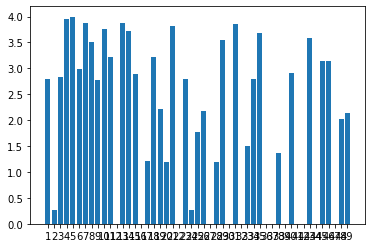

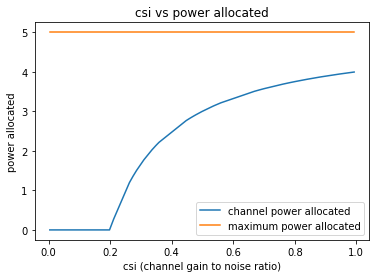

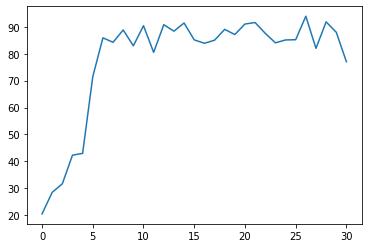

31
Power Allocated= 3.350071742444034
CSI= 0.9589296846417857
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0375389755590056
CSI= 0.73781021523551
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.034518


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.086293
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.115626

Power Allocated= 1.3114059088163987
CSI= 0.3245177899320826
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.475195
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107823
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000041

Power Allocated= 1.4517218196982822
CSI= 0.339999678449452
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.943462
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.224532
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.305412

Power Allocated= 0
CSI= 0.1977745854722034
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0587013918299033
CSI= 0.7495129964138756
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.638818


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006188
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000756

Power Allocated= 2.3363028381260253
CSI= 0.4862398418870395
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.808158
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054000
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.065366

Power Allocated= 0
CSI= 0.1691192402043492
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17333944284795455
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7534843956387034
CSI= 0.6099730559651588
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.602984
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000872
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.096049

Power Allocated= 3.225717596352437
CSI= 0.8

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2379, Accuracy: 9342/10000 (93%)

Power in training Round= 98.00354636567296



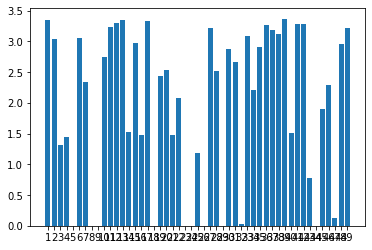

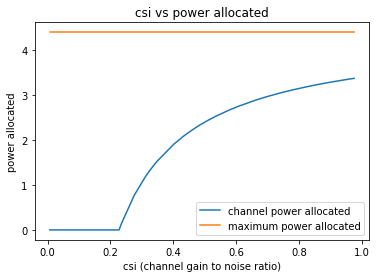

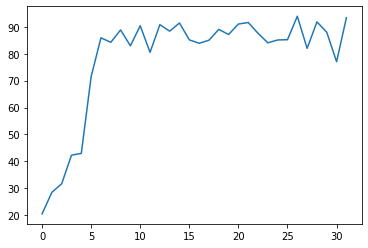

32
Power Allocated= 1.8669585722630688
CSI= 0.385011184698552
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.367401


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.605695
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.204906

Power Allocated= 3.3320767957311115
CSI= 0.8832292199890608
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0621140798747937
CSI= 0.7131794535408844
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.540616
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021395
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029344

Power Allocated= 1.1090306098545302
CSI= 0.29803993105597504
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.559159
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.087477
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.094201

Power Allocated= 2.5366677005727
CSI= 0.5187749818095803
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.582366
Model client5 Tra

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079265
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.026116

Power Allocated= 0.9146009486593103
CSI= 0.28171515670446234
SNR= 20.54304442884906
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.303545
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039193
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.190724

Power Allocated= 1.7835713412586127
CSI= 0.37303489325893135
SNR= 20.559061872099633
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.751101
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075782
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.116010

Power Allocated= 0
CSI= 0.0101338949160229
SNR= 20.627161125173572
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.330258256063737
CSI= 0.8818128633036132
SNR= 20.8358788807459
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.801839
Model client19 Train 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2026, Accuracy: 9334/10000 (93%)

Power in training Round= 97.99667637740137



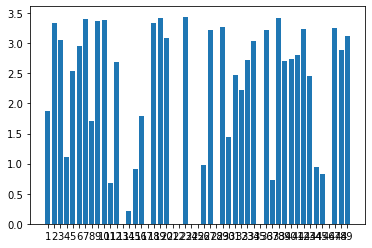

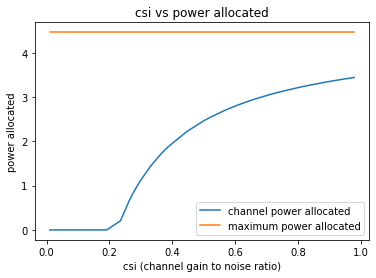

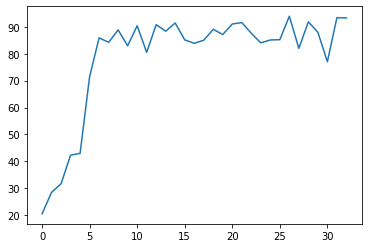

33
Power Allocated= 3.141274468258154
CSI= 0.8803704265781265
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.422149


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.142182
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.017952

Power Allocated= 2.965164656009951
CSI= 0.7621978467078945
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.541699
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.137155
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.013788

Power Allocated= 0
CSI= 0.18840113111254175
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.893471717554016
CSI= 0.7227061451738177
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.646856


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.017038
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.041098

Power Allocated= 1.9912409749655184
CSI= 0.4374608216725616
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.612902
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.291912
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.406137

Power Allocated= 2.871838546506042
CSI= 0.7115809851630857
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.819166
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062618
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.046604

Power Allocated= 2.548247944426279
CSI= 0.5783984307166653
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.179925
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.049783
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.041715

Power Allocated= 2.9120317646450307
CSI= 0.7325319330201231


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2931, Accuracy: 9079/10000 (91%)

Power in training Round= 97.99947218743368



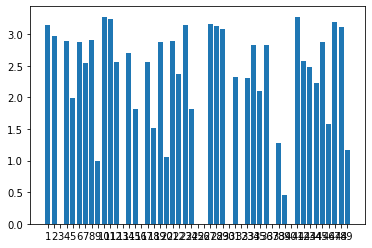

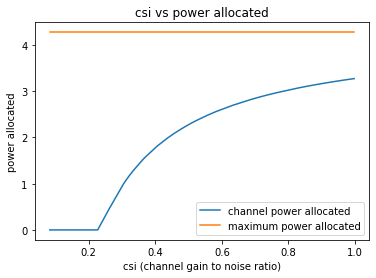

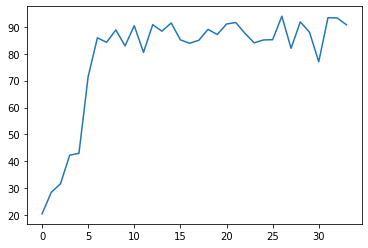

34
Power Allocated= 3.5366947208880406
CSI= 0.8543235452258596
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6016151946884207
CSI= 0.9044893170180809
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.431825


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019915
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009697

Power Allocated= 0
CSI= 0.05605059581015659
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.646916997106452
CSI= 0.48536751608300677
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.853211


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009923
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015590

Power Allocated= 2.339366930444489
CSI= 0.4223250270918555
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.609741
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.238976
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.220100

Power Allocated= 0
CSI= 0.0974739542440014
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5236127081991038
CSI= 0.844880926639123
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.358154
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.085647
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.052157

Power Allocated= 1.2794474446318627
CSI= 0.29173537006494876
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.658441
Model client8 Train Epoch: 2 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5370, Accuracy: 8995/10000 (90%)

Power in training Round= 97.99694751167009



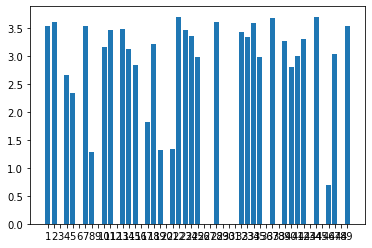

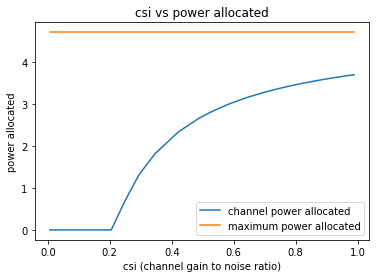

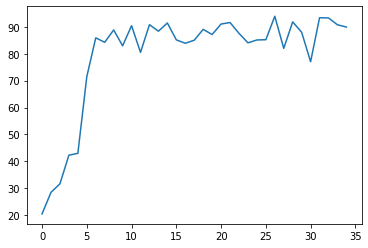

35
Power Allocated= 0.810145006362331
CSI= 0.27515619365904675
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.098139


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.361784
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.198232

Power Allocated= 2.603210102104978
CSI= 0.5431139192902408
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.564412
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079220
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.039535

Power Allocated= 1.1497844377799105
CSI= 0.3035214553177099
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.645398
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000257
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.060348

Power Allocated= 2.8510538099293425
CSI= 0.627592492599318
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.767451
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.055993
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.205302

Power Allocated= 3.4360378284695976
CSI= 0.9916634660641053


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038461
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.057735

Power Allocated= 1.3487451928626069
CSI= 0.323028795348543
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.131140
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014388
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.613614

Power Allocated= 2.6411968424495402
CSI= 0.5545550144602924
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.053835
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.203110
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.051321

Power Allocated= 2.943566153845423
CSI= 0.6662765437166874
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.457984
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000837
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.041153

Power Allocated= 2.2285972737725905
CSI= 0.45129466203059

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4087, Accuracy: 8796/10000 (88%)

Power in training Round= 97.9929308907214



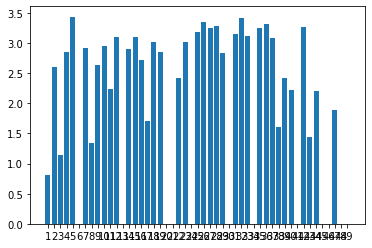

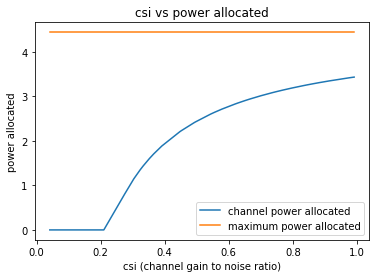

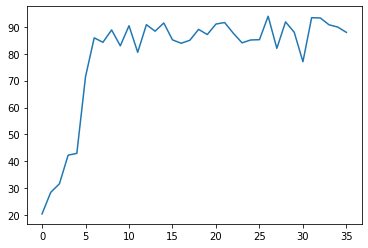

36
Power Allocated= 3.4247417691085587
CSI= 0.9130447789560568
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.622901


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.146289
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.134177

Power Allocated= 0
CSI= 0.1998268264626778
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0142645512414656
CSI= 0.6641368574196318
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.328711


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002704
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014628

Power Allocated= 2.8208558070624417
CSI= 0.5885390851694583
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.955714
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.050596
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.031797

Power Allocated= 0
CSI= 0.0712005809692784
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0019540305506206
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0554405313737907
CSI= 0.40575559890566604
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.706456
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006863
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.158042

Power Allocated= 0
CSI= 0.11551468025424794
SN

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3514, Accuracy: 8836/10000 (88%)

Power in training Round= 97.99757003260427



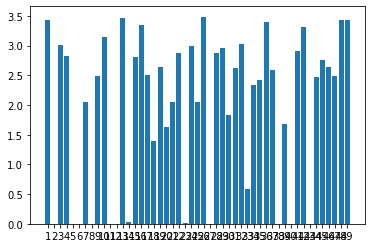

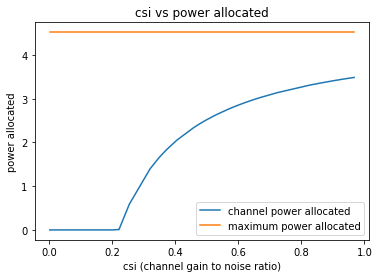

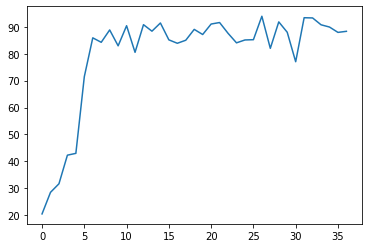

37
Power Allocated= 2.403966260817612
CSI= 0.48152810682006686
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.782017


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.105669
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.563395

Power Allocated= 3.0638994763397926
CSI= 0.7058215240597857
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.219481
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.085340
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.152038

Power Allocated= 1.6232116746796366
CSI= 0.3499591262922721
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.170318
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.317725
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002680

Power Allocated= 2.763636740940811
CSI= 0.5823937163267217
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.414669
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.168839
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.178497

Power Allocated= 3.1093869377645786
CSI= 0.7292343432872667

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016024
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.415646

Power Allocated= 3.1926109374711693
CSI= 0.7763509246825312
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.275726
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.233473
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.280588

Power Allocated= 2.7191808763038674
CSI= 0.567695613528839
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.336805
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.067602
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000018

Power Allocated= 0
CSI= 0.06809066085900506
SNR= 20.095472826104007
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4562010153962595
CSI= 0.9760980733785294
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.663069
Model client12 Train Epoch:

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4656, Accuracy: 8595/10000 (86%)

Power in training Round= 98.00287046556159



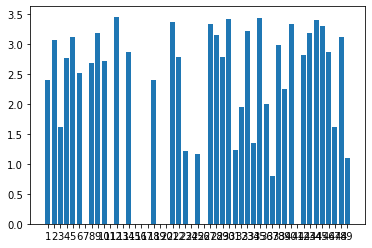

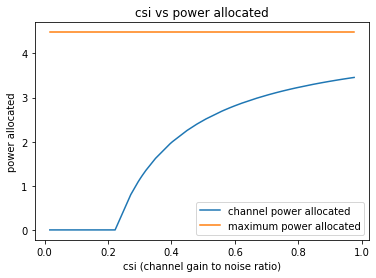

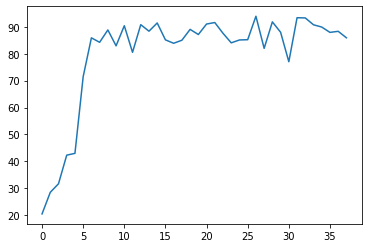

38
Power Allocated= 0.8987727430509
CSI= 0.24270078998068834
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.068062


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.214156
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.020318

Power Allocated= 3.304100094965963
CSI= 0.583099769655146
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.198742
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000649
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.056550

Power Allocated= 0
CSI= 0.14052747894762907
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1669241164672393
CSI= 0.5399135523746789
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07928181517439559
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.620237306034627
CSI= 0.41686899240422337
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.058697


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.029513
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000023

Power Allocated= 1.9247857314839663
CSI= 0.32317625441920983
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.405066
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.051542
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000841

Power Allocated= 0
CSI= 0.04562893098791665
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7192894396646237
CSI= 0.23256987426747866
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.776729
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.554481
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.200222

Power Allocated= 2.828800312923114
CSI= 0.45656426499345604
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.420032
Model client10 Train Epoch: 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5535, Accuracy: 8229/10000 (82%)

Power in training Round= 97.99591629699232



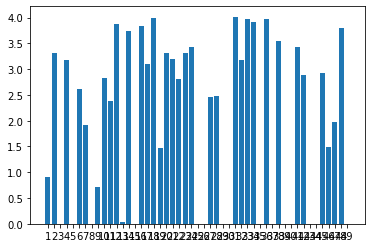

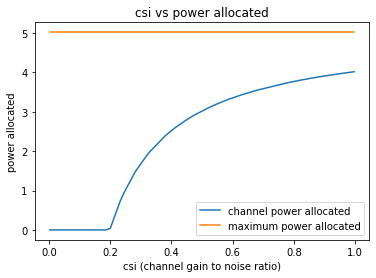

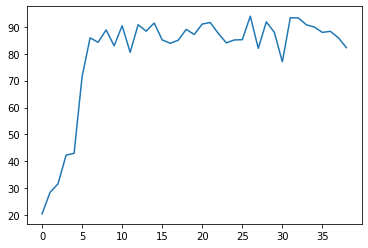

39
Power Allocated= 0.8414656345198224
CSI= 0.25601830224733824
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.639975


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038970
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.098750

Power Allocated= 3.5617931426380194
CSI= 0.8434240290980939
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.182377
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019107
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.106258

Power Allocated= 0
CSI= 0.07214085409073479
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.647988364344075
CSI= 0.4763156746294901
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18574711779642727
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8458623157676168
CSI= 0.3446405214420756
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.602299


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016069
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001102

Power Allocated= 2.8437480116098013
CSI= 0.5252960591229104
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.645961
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021024
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029958

Power Allocated= 1.2079297361175514
CSI= 0.2825252498108991
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.807749
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001650
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.063785

Power Allocated= 0
CSI= 0.017645102907270394
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06288885670244493
SNR= 19.996251205202647
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0961054115274917
CSI= 0.6

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 1.0449, Accuracy: 5759/10000 (58%)

Power in training Round= 98.00382039658709



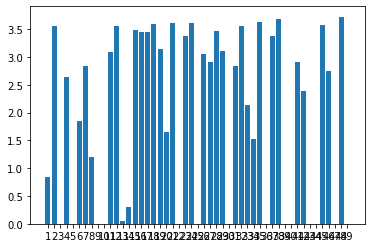

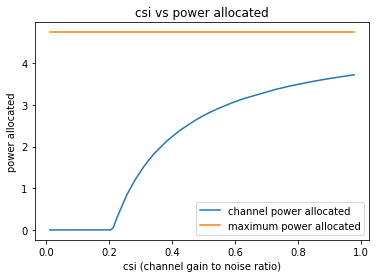

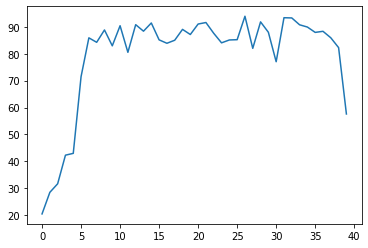

40
Power Allocated= 2.5764339626424007
CSI= 0.6259635325682023
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.016414


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.125353
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.171477

Power Allocated= 0
CSI= 0.014332078693569783
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.678187846026205
CSI= 0.40067581667950003
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.742973


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.058396
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.063770

Power Allocated= 2.737413817686588
CSI= 0.6961086766885527
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.079038
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.066858
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001888

Power Allocated= 1.7437469493989832
CSI= 0.4114846744154932
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.246171
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.175267
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.451585

Power Allocated= 2.560388582891025
CSI= 0.6197389841588509
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.738206
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009951
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.052760

Power Allocated= 1.3126172441590365
CSI= 0.34948490985302516

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3213, Accuracy: 9018/10000 (90%)

Power in training Round= 97.99642969246068



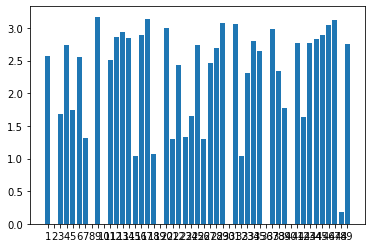

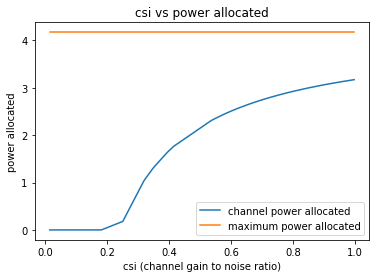

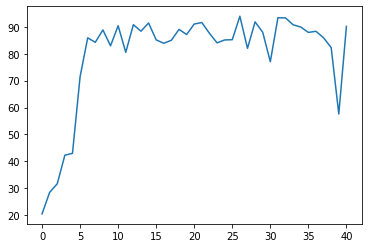

41
Power Allocated= 2.968392317771225
CSI= 0.5201452532498272
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.401954725744882
CSI= 0.6716018270565528
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.910769


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005925
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.137404

Power Allocated= 2.486458472789919
CSI= 0.41589142098996945
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.854868
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030673
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000179

Power Allocated= 0.01611153022791978
CSI= 0.20513575069640433
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.607737
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037020
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.418751

Power Allocated= 3.755034903711779
CSI= 0.8803612729647433
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.490442
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.247349
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.505633

Power Allocated= 0
CSI= 0.10734510167731393
SNR= 18.59614

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010937
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.048993

Power Allocated= 0.7581979668429195
CSI= 0.24197055526841815
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.901391
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003258
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.477817

Power Allocated= 0
CSI= 0.15902245486293343
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.670477220661175
CSI= 0.31051512993935204
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.547088
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000069
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000054

Power Allocated= 3.7947093334562885
CSI= 0.9122232530126577
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.391487
Model client11 Train Epoc

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3603, Accuracy: 8488/10000 (85%)

Power in training Round= 97.99567975264296



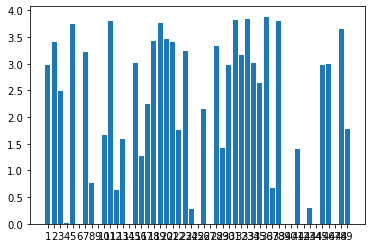

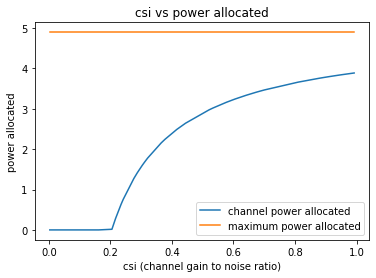

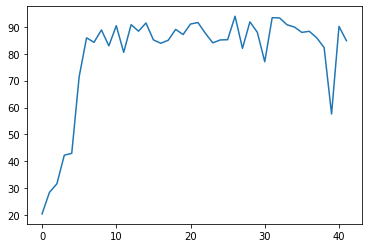

42
Power Allocated= 3.4643974152929196
CSI= 0.7977828776614332
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.572861


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.150874
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.267239

Power Allocated= 3.561621215157479
CSI= 0.8648648040427814
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13386658557360132
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18164949460063917
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8979505150875635
CSI= 0.5494744662674969
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.701716


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.144956
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.054686

Power Allocated= 0
CSI= 0.13936979432858654
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4454050133207783
CSI= 0.44005053338506506
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.671699
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022228
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000008

Power Allocated= 0
CSI= 0.11019904459785212
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15341506002604477
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5046894381605123
CSI= 0.8242787288233216
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.797296
Model client10 T

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4561, Accuracy: 8825/10000 (88%)

Power in training Round= 98.00347500527695



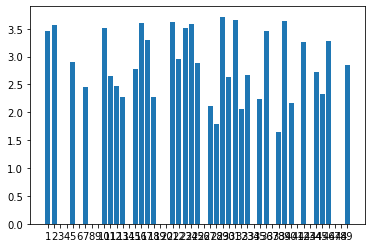

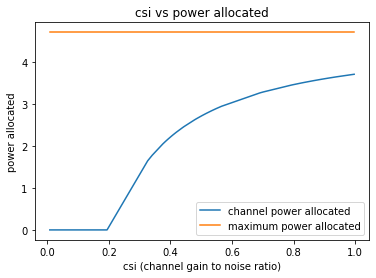

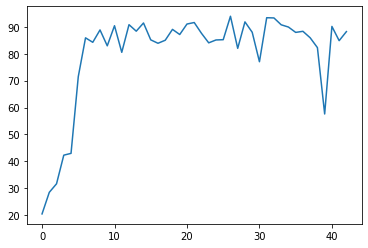

43
Power Allocated= 0
CSI= 0.08853989442872501
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0648768231771113
CSI= 0.41297741709226754
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.739212


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007995
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008071

Power Allocated= 3.4011065005200702
CSI= 0.9214804368629057
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.709645
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.049227
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.081120

Power Allocated= 0
CSI= 0.011309082904489398
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10679011069538347
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.391511950956869
CSI= 0.47737145156100036
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.900281
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009194
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000483

Power Allocated= 0.18176061655387432
CSI= 0.

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2329, Accuracy: 9235/10000 (92%)

Power in training Round= 97.99279711952639



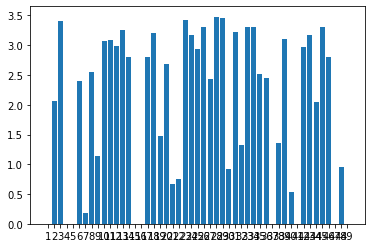

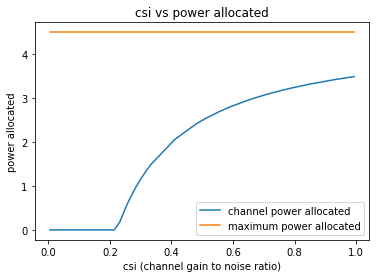

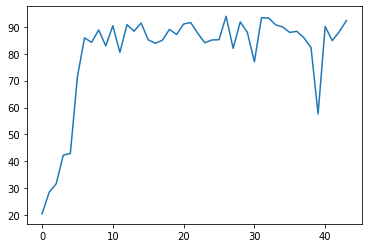

44
Power Allocated= 3.4598895824549745
CSI= 0.9846543414609792
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7479236886685863
CSI= 0.5788542086057025
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.310139


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010863
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0.44196990179369866
CSI= 0.2479233630143679
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.399302
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002192
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000528

Power Allocated= 3.2417593892529846
CSI= 0.8105599681096539
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.241951
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.278001
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.060129

Power Allocated= 3.172865919124382
CSI= 0.7676903800807404
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.706026
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.121154
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.178228

Power Allocated= 2.8317660543272654
CSI= 0.608380435895527

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014110
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000014

Power Allocated= 0
CSI= 0.014789397943121174
SNR= 20.095472826104007
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1103112846710278
SNR= 20.18554291572515
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5757025619535128
CSI= 0.5263789997420447
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.383194
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.2731025367366833
CSI= 0.8316894550803737
SNR= 20.466394740873444
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.543264
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005132
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.021130

Power Allocated= 3.244714647976777


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.8409, Accuracy: 7835/10000 (78%)

Power in training Round= 98.0049893150638



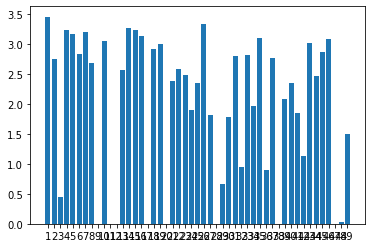

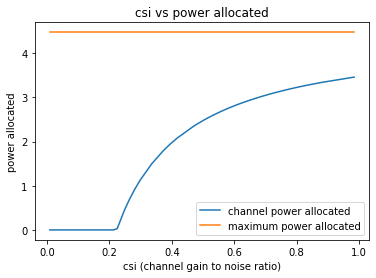

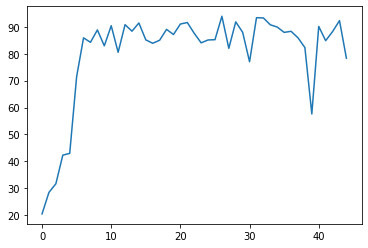

45
Power Allocated= 3.0721582835218775
CSI= 0.8154420927470001
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.413123


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075128
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.153457

Power Allocated= 0
CSI= 0.08151286629514587
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.293839292218262
CSI= 0.9953738602520025
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.297029944602044
CSI= 0.998545131727491
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.119929


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.281236
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001008

Power Allocated= 3.264907094497675
CSI= 0.9675111327982775
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.651773
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.108969
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.165784

Power Allocated= 1.3278181050895963
CSI= 0.3366245307249559
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.875889
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000002
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 1.8175610593714824
CSI= 0.4030753239308186
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.140743
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037624
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.087201

Power Allocated= 0
CSI= 0.21058452106218262
SNR= 19.2408940

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3654, Accuracy: 8892/10000 (89%)

Power in training Round= 98.00410000243896



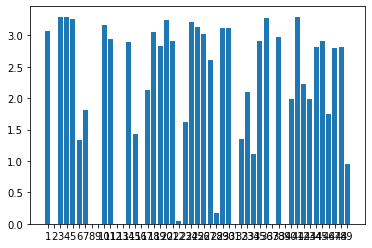

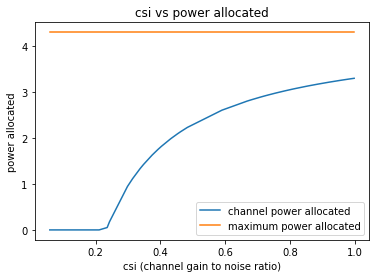

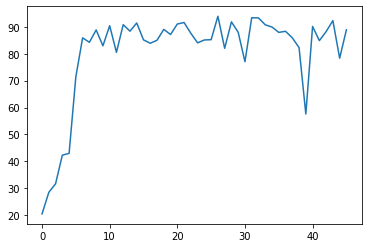

46
Power Allocated= 3.5853673512312896
CSI= 0.8271598466894037
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.913404


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.162915
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.243035

Power Allocated= 2.275151842504221
CSI= 0.39695587583627934
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.634503
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073257
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.036915

Power Allocated= 1.8957787688263608
CSI= 0.3450007108797669
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.295102
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037083
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.024687

Power Allocated= 2.304742353814512
CSI= 0.4016739896654933
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.418101
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.171542
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001282

Power Allocated= 3.3370260112290024
CSI= 0.6862016803901658

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.117511
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015822

Power Allocated= 3.201507675729337
CSI= 0.627818967898643
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.369369
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073743
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.005829

Power Allocated= 3.4940280375126367
CSI= 0.7690559666909716
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.559569
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.330517
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.037660

Power Allocated= 2.5293600020009253
CSI= 0.44150821487108016
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.307761
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000647
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.236933

Power Allocated= 1.8099242973625684
CSI= 0.33507

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3783, Accuracy: 8848/10000 (88%)

Power in training Round= 98.00434244262516



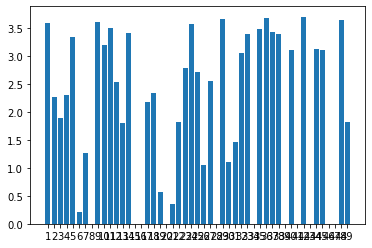

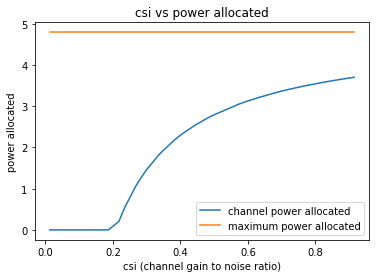

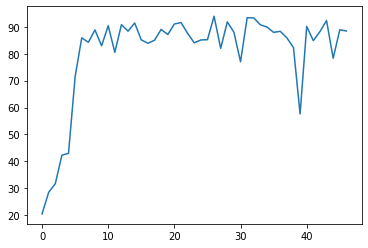

47
Power Allocated= 0
CSI= 0.14091607649715077
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.0238590045477065
CSI= 0.3105336536811206
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.957848


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039183
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.115618

Power Allocated= 2.7302045852894397
CSI= 0.6605380598453375
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.396378
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039549
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.300584

Power Allocated= 3.216894635054042
CSI= 0.9734944181390057
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.465843
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006119
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.068179

Power Allocated= 2.6550717560774997
CSI= 0.6293067650346748
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.065460
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.403210
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.279806

Power Allocated= 2.8948375313959316
CSI= 0.74113361853477
S

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2987, Accuracy: 9132/10000 (91%)

Power in training Round= 98.0011646296464



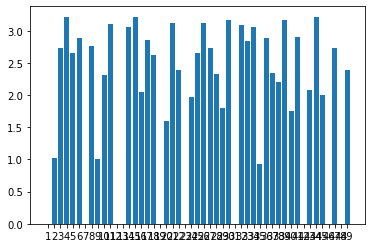

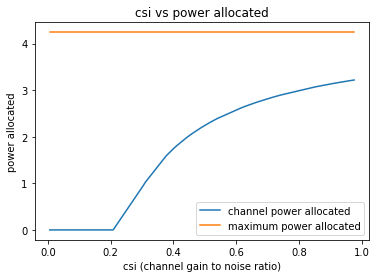

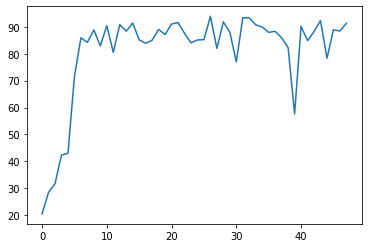

48
Power Allocated= 2.8946521853891394
CSI= 0.6262118414113993
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.330048


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.174939
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.122210

Power Allocated= 0
CSI= 0.16318201149557088
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3312492125900413
CSI= 0.8618411256566963
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.135386


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000388
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.036854

Power Allocated= 3.145647373948085
CSI= 0.7429925580019057
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.347695
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009973
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.169828

Power Allocated= 0
CSI= 0.01562177238040141
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.796124480819893
CSI= 0.5898203863977902
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.179784
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026228
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001403

Power Allocated= 3.415487091470977
CSI= 0.9293086235266625
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.422744
Model client7 Train Epoch: 2 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2290, Accuracy: 9374/10000 (94%)

Power in training Round= 98.00767253950016



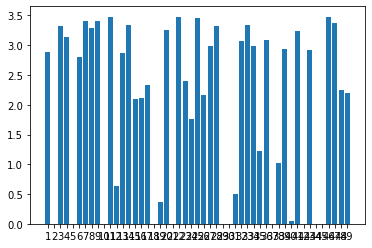

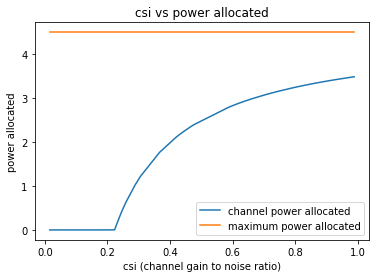

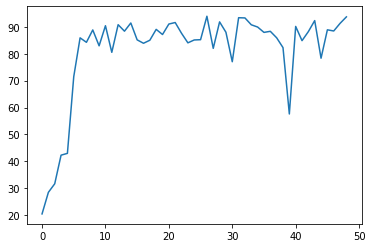

49
Power Allocated= 1.100504151188387
CSI= 0.272173055908955
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.054406


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113395
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.486721

Power Allocated= 3.7149897298923067
CSI= 0.943710145642248
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.286930
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009677
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029489

Power Allocated= 3.0971935060513465
CSI= 0.596145221911846
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.193010
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034296
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009264

Power Allocated= 0.26155611647924193
CSI= 0.2215781187044097
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.363476
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069418
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.236720

Power Allocated= 3.748798109767068
CSI= 0.9748118200195823


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001054
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.175014

Power Allocated= 0
CSI= 0.17278294854603127
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6157853959213906
CSI= 0.8629231615074002
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.408235
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012936
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.653300

Power Allocated= 0
CSI= 0.057915686617990625
SNR= 20.095472826104007
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.924740058589693
CSI= 0.35088986577145675
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.799500
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.063271
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.277379

Power Allocated= 3.5137108134423047
C

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3693, Accuracy: 9053/10000 (91%)

Power in training Round= 97.99391985159303



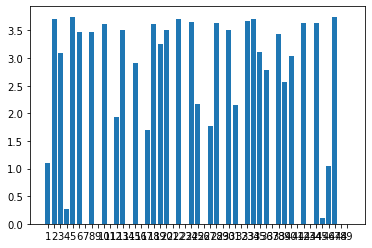

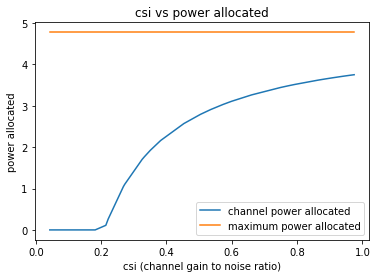

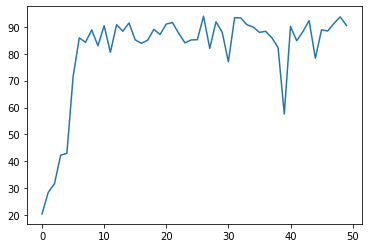

50
Power Allocated= 2.1945843357749557
CSI= 0.38574367295801737
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.929820160040699
CSI= 0.538456783820332
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.490225


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038961
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006849

Power Allocated= 0
CSI= 0.058351728029115146
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.604313215045936
CSI= 0.4581552596397933
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.708702


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054306
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.053222

Power Allocated= 3.5479462786853864
CSI= 0.8070809164767992
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8224226806741077
CSI= 0.25223500803819676
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.631537
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.056305
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.016499

Power Allocated= 0
CSI= 0.05818609445951839
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1901761795779118
CSI= 0.6262512357174683
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.300430
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008600
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.048871

Power Allocated= 0
CSI= 0.03

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.7354, Accuracy: 7541/10000 (75%)

Power in training Round= 97.99662866895326



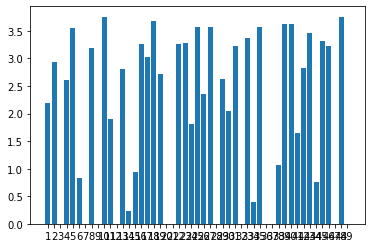

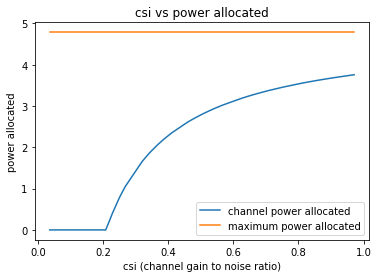

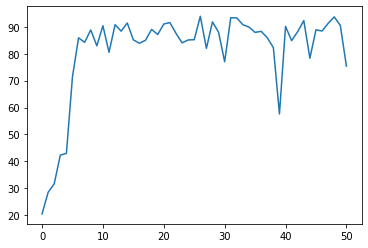

51
Power Allocated= 3.329621234292167
CSI= 0.8552790307606101
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.025841


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036567
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.046699

Power Allocated= 2.934000761384585
CSI= 0.6390472397722573
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13168530356758001
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4374642655166308
CSI= 0.4851152009261209
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.504782


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.136153
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.127059

Power Allocated= 0
CSI= 0.1524006161405459
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.8991209159854807
CSI= 0.2778002033430431
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.281560
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.061004
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001533

Power Allocated= 2.868598904395412
CSI= 0.6134098509991436
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.458330
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052567
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.018221

Power Allocated= 3.263784652034894
CSI= 0.809686668918385
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.462555
Model client8 Train Epoch: 2 [0/121

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3817, Accuracy: 8675/10000 (87%)

Power in training Round= 97.99784753952407



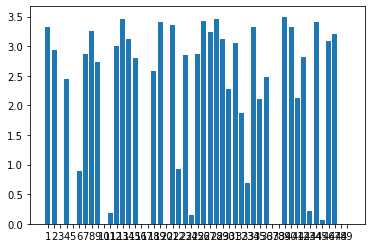

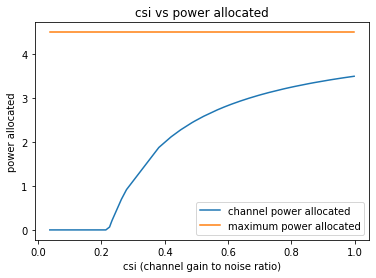

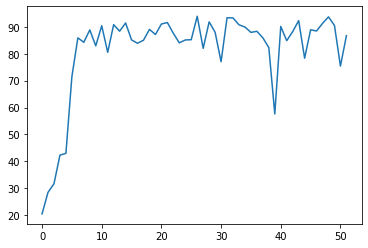

52
Power Allocated= 0.08537349105159908
CSI= 0.22805541368143445
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.771630


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.076217
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.071453

Power Allocated= 3.4571145808946877
CSI= 0.987012781455271
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.627292
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073133
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.026395

Power Allocated= 3.0556073913835164
CSI= 0.7068809868716911
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.229505
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024534
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000310

Power Allocated= 0.0012250296817102324
CSI= 0.2237613193594571
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.159209
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006240
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.086422

Power Allocated= 3.126810020525812
CSI= 0.74434520975311

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.058883
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.109335

Power Allocated= 2.7643099941973075
CSI= 0.5861792901059815
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.804136
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023732
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 9.474214561655536e-06
SNR= 20.095472826104007
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.25272863170695015
CSI= 0.23710481431289465
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.811942
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006413
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012826

Power Allocated= 2.918398957022502
CSI= 0.6443823237153169
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.319610
Model client14 Trai

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2900, Accuracy: 8994/10000 (90%)

Power in training Round= 97.99718299915516



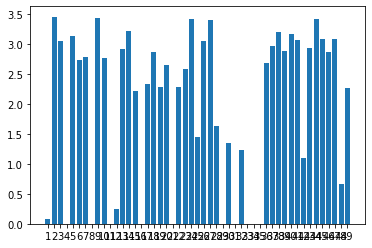

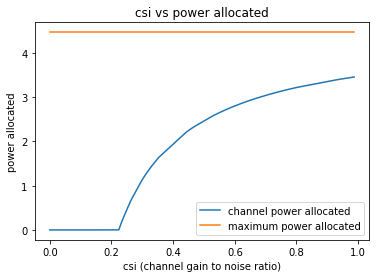

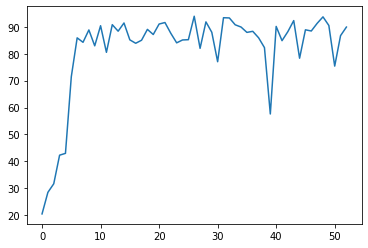

53
Power Allocated= 3.0555418783614208
CSI= 0.8267346327035627
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.788950


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031481
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.115544

Power Allocated= 2.6084745928414907
CSI= 0.6036295312822432
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.272617
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011075
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000003

Power Allocated= 2.087915866420695
CSI= 0.4593046896857742
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.547069
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000801
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003020

Power Allocated= 2.9675406071004398
CSI= 0.7706658422394005
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.806410
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018915
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000030

Power Allocated= 0.6866870952174993
CSI= 0.2794519468614703

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073076
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000024

Power Allocated= 0
CSI= 0.0009669137768407721
SNR= 20.95447603565735
Client: client20
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.561959709820602
CSI= 0.5871438489466043
SNR= 21.401971926297648
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.625821
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.254799
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.088598

Power Allocated= 2.3019895622533255
CSI= 0.5093905413761135
SNR= 21.468728856918247
Client: client22
Model client22 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.534827
Model client22 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.067255
Model client22 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003430

Power Allocated= 1.5697779688887321
CSI= 0.3710104484543524
SNR= 21.659324222483548
Client: client23
Model client23 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.615087
Model client23 Tra

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5832, Accuracy: 8027/10000 (80%)

Power in training Round= 97.99430533576661



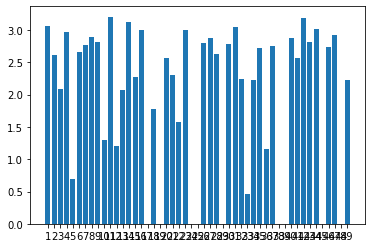

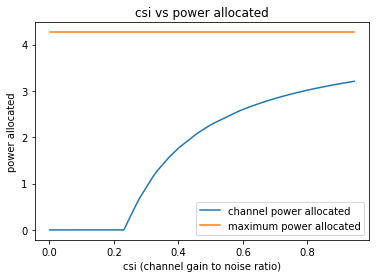

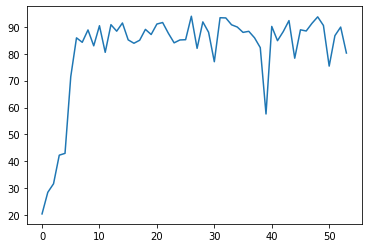

54
Power Allocated= 0
CSI= 0.09470198668560204
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5167259755469313
CSI= 0.31732208176287935
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.266961


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006549
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0.12260651593428129
CSI= 0.21999820169343565
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.923798
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.115053
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001998

Power Allocated= 3.575356896986285
CSI= 0.9151296669027893
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5715954368485368
CSI= 0.9119903919042167
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.670420
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.166072
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.275652

Power Allocated= 3.582462278364228
CSI= 0.9211191013563519
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.473600
Model client6 T

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2879, Accuracy: 8818/10000 (88%)

Power in training Round= 98.0068325829143



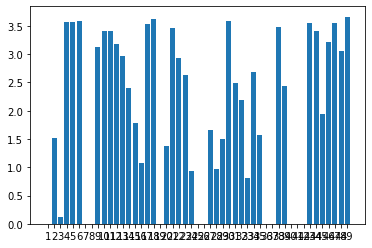

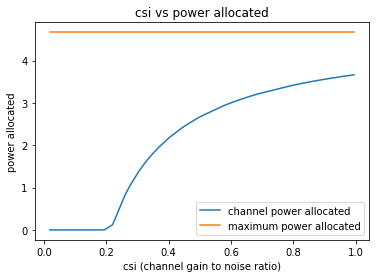

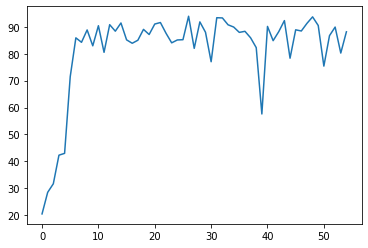

55
Power Allocated= 3.3686876533362295
CSI= 0.7776418356837231
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.562784


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.253348
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.122355

Power Allocated= 1.3734336421244464
CSI= 0.30476719372641414
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.446603
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026213
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003151

Power Allocated= 0.12978424884111295
CSI= 0.22100216991606902
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.168385
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070450
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000261

Power Allocated= 3.2081842973871573
CSI= 0.6913514142886397
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.698218
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011896
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000206

Power Allocated= 3.0079353845346133
CSI= 0.607278359491

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.092472
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.108653

Power Allocated= 0
CSI= 0.16811660312914112
SNR= 19.996251205202647
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.168160960521234
CSI= 0.4021772689441093
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.253520
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.089189
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.032769

Power Allocated= 3.353837100393008
CSI= 0.7687638347644408
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.071042
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.029396
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.21465106973131176
SNR= 20.19679116644772
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1258607821534

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2865, Accuracy: 9218/10000 (92%)

Power in training Round= 98.00325972438887



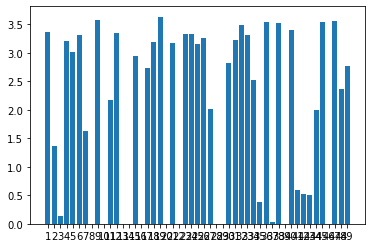

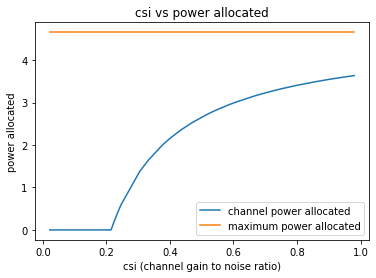

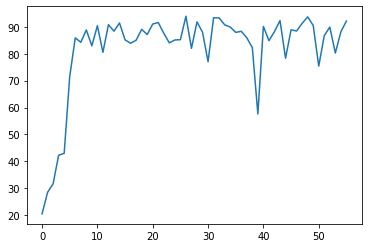

56
Power Allocated= 2.717735254736217
CSI= 0.5970933854254427
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.242038


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027431
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.021334

Power Allocated= 0
CSI= 0.11235983797709148
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.0040304029046547285
CSI= 0.22786908390416794
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.382736


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032471
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009909

Power Allocated= 2.4476278996422858
CSI= 0.5141686222006084
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.808380
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038208
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009619

Power Allocated= 3.0024089587483687
CSI= 0.7193695008971235
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.072832046410703
CSI= 0.7577576723642935
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.624691
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038090
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000153

Power Allocated= 2.751414707850378
CSI= 0.6093472232232546
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.348616
Model client7 Tra

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3278, Accuracy: 8716/10000 (87%)

Power in training Round= 98.00540491110445



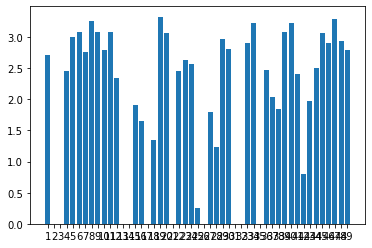

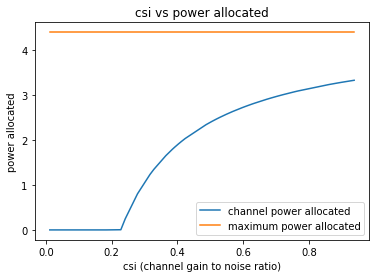

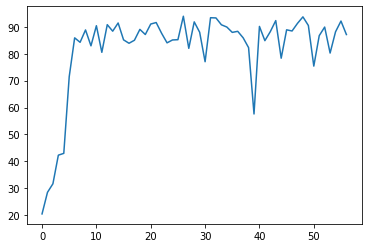

57
Power Allocated= 3.017896081362908
CSI= 0.7407074975098814
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.235836


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.077234
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.282342

Power Allocated= 2.9286781414735996
CSI= 0.6947925507608226
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.220873
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005751
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.038475

Power Allocated= 3.2338644642242698
CSI= 0.8817625189747145
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.221427
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003490
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000512

Power Allocated= 0.9964772491695526
CSI= 0.29660569596244657
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.191818
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057353
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004248

Power Allocated= 2.8634980149481333
CSI= 0.66469091505326

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012561
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.059658

Power Allocated= 3.3267600352966573
CSI= 0.960433377130079
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.575333
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002092
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000602

Power Allocated= 2.1090079940230435
CSI= 0.4426838071586333
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.756536
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.068389
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.401510807203108
CSI= 0.5085316707593809
SNR= 20.466394740873444
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.567037
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.214772
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.115510

Power Allocated= 0
CSI= 0.08510301494274652
SNR=

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3188, Accuracy: 8961/10000 (90%)

Power in training Round= 98.00391407461514



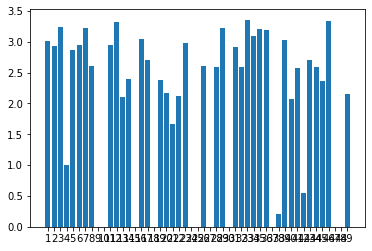

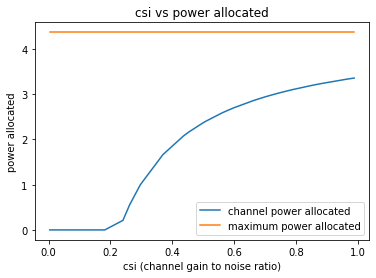

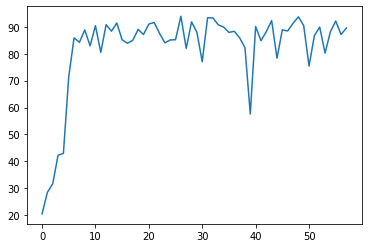

58
Power Allocated= 0
CSI= 0.1752396718984417
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12714264945602793
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5947686604025977
CSI= 0.5581662169752625
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.675654


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044062
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001712

Power Allocated= 0
CSI= 0.08919812086415135
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1715323990536333
CSI= 0.311059669235323
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.522765
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.173510
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.122530

Power Allocated= 2.950347981056508
CSI= 0.6963780062914731
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.478038
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037198
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000577

Power Allocated= 2.181054355952326
CSI= 0.4534540064487437
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.030527
Model client7 Train Epoch: 2 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2581, Accuracy: 9207/10000 (92%)

Power in training Round= 98.00101702072142



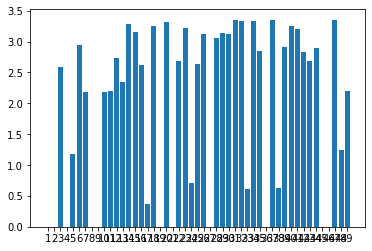

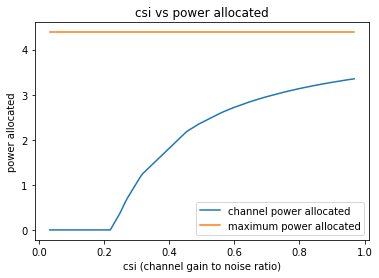

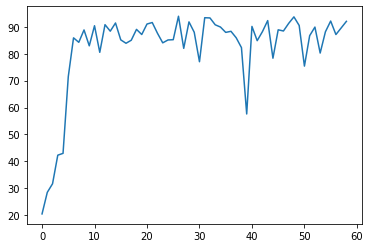

59
Power Allocated= 3.2501569393300542
CSI= 0.5129493336093175
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.532416


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.188771
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.481004

Power Allocated= 3.7537349707492975
CSI= 0.6915953355494214
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17501122608125774
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.21389937843346
CSI= 0.5035835400362993
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.703771


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.041497
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004496

Power Allocated= 0.43900409253035555
CSI= 0.210054770302315
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.409324
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.185148
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.405133

Power Allocated= 4.185929190554544
CSI= 0.9864481450563347
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.418223
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002099
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.1126261049891214
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.966553937985339
CSI= 0.8109555006280789
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.424808
Model client8 Train Epoch: 2 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4235, Accuracy: 8923/10000 (89%)

Power in training Round= 98.00392999343096



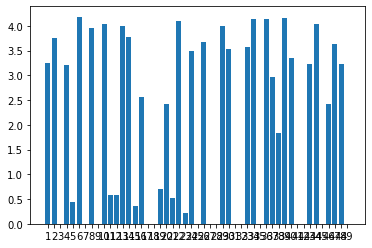

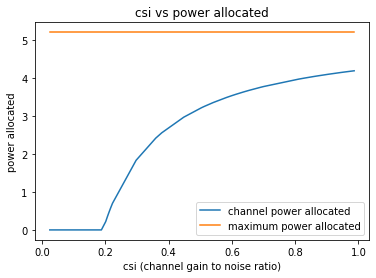

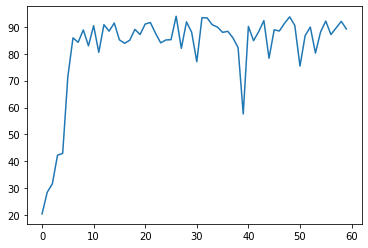

60
Power Allocated= 2.2913458697166997
CSI= 0.4382992883394219
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.642100


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040721
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.026579

Power Allocated= 3.231318523469545
CSI= 0.7453934461226737
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3662743455901216
CSI= 0.23772068361761156
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.619774
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013060
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.026583

Power Allocated= 3.322969421724198
CSI= 0.800049619005849
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.683980
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010929
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.061948

Power Allocated= 0
CSI= 0.20899448232770634
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.467356078011

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.143090
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000290

Power Allocated= 3.284458848908287
CSI= 0.776136564960377
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.247641
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.041083
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009977

Power Allocated= 3.306404454253885
CSI= 0.789585404780046
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.605095
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002705
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.036908

Power Allocated= 0
CSI= 0.10418711790984247
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3999589805446524
CSI= 0.23963960601809853
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.447603
Model client10 Train Epoch: 2 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2742, Accuracy: 9029/10000 (90%)

Power in training Round= 98.00271547945881



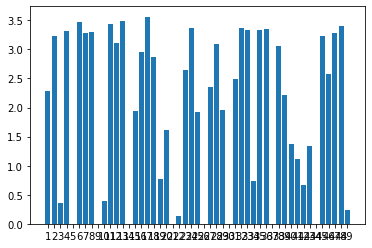

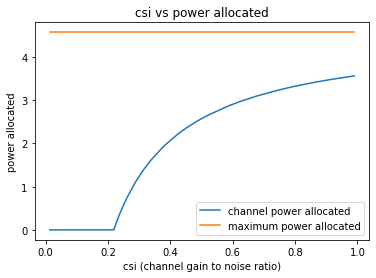

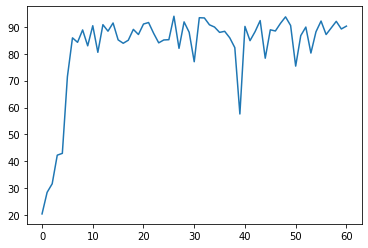

61
Power Allocated= 0
CSI= 0.197220087460811
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.593831161728529
CSI= 0.4846377452872277
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.649472


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004802
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.041803

Power Allocated= 3.021004324920691
CSI= 0.6111633783940998
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.264083
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038103
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000052

Power Allocated= 0.14580984540096775
CSI= 0.22165978895491856
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.186181
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.047968
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.035386

Power Allocated= 0
CSI= 0.08032530000892779
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.936263341309365
CSI= 0.5810694511117479
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.344676
Model client6 Train Epoch: 2 [0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1663, Accuracy: 9476/10000 (95%)

Power in training Round= 98.00782911732257



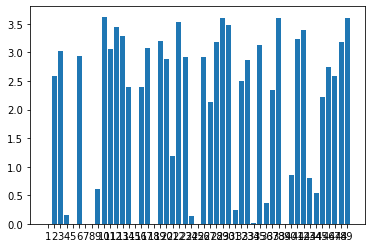

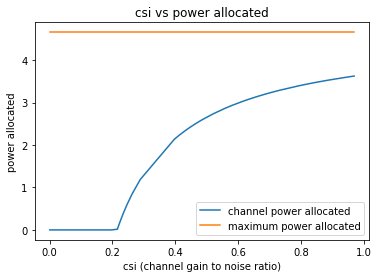

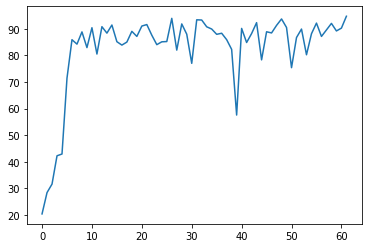

62
Power Allocated= 0
CSI= 0.12911524831274335
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8040124387371894
CSI= 0.3475604678486677
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.304855


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000235
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.347422

Power Allocated= 0
CSI= 0.0026229467761776926
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.384122073750425
CSI= 0.7709579814949167
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.286496
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045283
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001896

Power Allocated= 2.8959411437325686
CSI= 0.5601398393212021
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.487430
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.118307
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.042119

Power Allocated= 3.1262126660544682
CSI= 0.6430880745621195
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.179503
Model client6 Train Epoch: 2 [

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6504, Accuracy: 8273/10000 (83%)

Power in training Round= 98.00032858462274



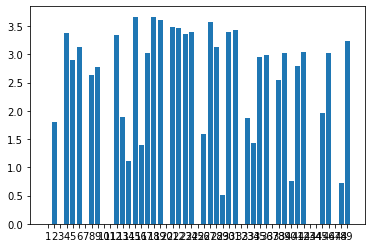

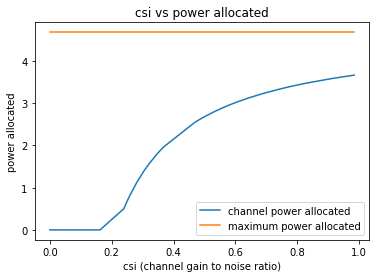

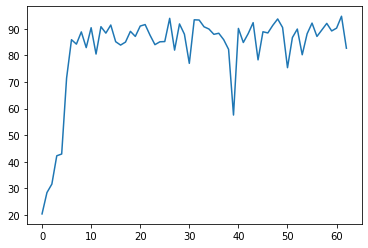

63
Power Allocated= 0
CSI= 0.006012200536661294
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.555186967645559
CSI= 0.9960705280301043
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.1028008916132546
CSI= 0.28932413754081077
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.534692


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.133004
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.016578

Power Allocated= 0
CSI= 0.07145491048636299
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5514769222100053
CSI= 0.3324849404801825
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.018505
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.227991
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.353800

Power Allocated= 3.092118916299893
CSI= 0.6816572061549349
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.474921
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008124
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.046086

Power Allocated= 3.061469342036917
CSI= 0.667707132772242
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.985589
Model client7 Train Epoch: 2 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3995, Accuracy: 8672/10000 (87%)

Power in training Round= 98.00716143586438



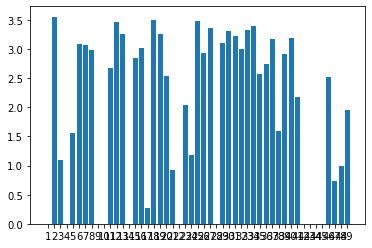

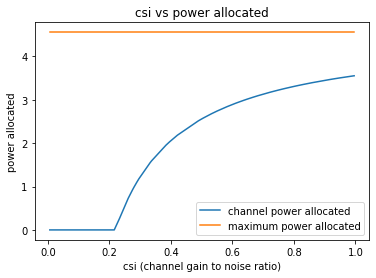

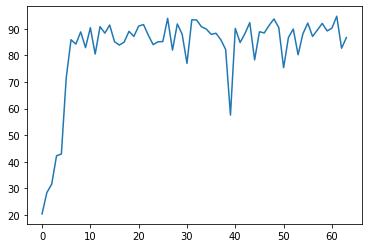

64
Power Allocated= 2.0691162220095656
CSI= 0.3718628924757098
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2444136459100505
CSI= 0.28458685340525225
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.054299


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.041074
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.027237

Power Allocated= 0
CSI= 0.13615051144227308
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.623893662840537
CSI= 0.4685188715894699
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.130455


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.138022
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.068755

Power Allocated= 2.902942739985517
CSI= 0.5389857367817172
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.800477
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052944
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.331473

Power Allocated= 0
CSI= 0.1756028648768887
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.571737375580746
CSI= 0.8427851472786462
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.156605
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006697
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.079970

Power Allocated= 3.5811453757693927
CSI= 0.849520933195826
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.86815943442545

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4331, Accuracy: 9315/10000 (93%)

Power in training Round= 97.99897317909414



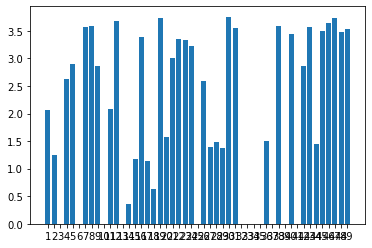

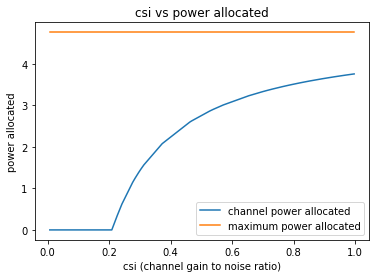

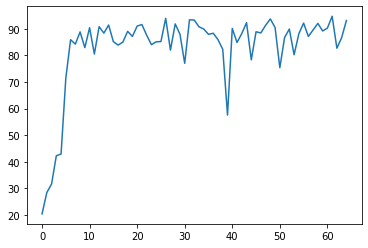

65
Power Allocated= 3.7125242043669444
CSI= 0.9370898134127849
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.64781224224764
CSI= 0.8835127848584239
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6846231269414123
CSI= 0.9132131119320028
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.633878


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025289
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.026296

Power Allocated= 3.0912198012455634
CSI= 0.5922633905738885
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.788757
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023533
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028678

Power Allocated= 0.8313961576763584
CSI= 0.25327602285307704
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.927232
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.161236
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.148658

Power Allocated= 3.0510151586509466
CSI= 0.5784885722893092
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.819603
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008919
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.097154

Power Allocated= 2.1574558345297317
CSI= 0.38135888163032

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048330
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.097178

Power Allocated= 3.7576733164963043
CSI= 0.978488459592547
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.854547
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.029208
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.327365531245201
CSI= 0.6885666457732251
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.636525
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023422
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000586

Power Allocated= 3.553435697207057
CSI= 0.8155129620351708
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.780037
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002361
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000249

Power Allocated= 0
CSI= 0.18547626411939355
SNR= 2

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5696, Accuracy: 8051/10000 (81%)

Power in training Round= 97.99238776968038



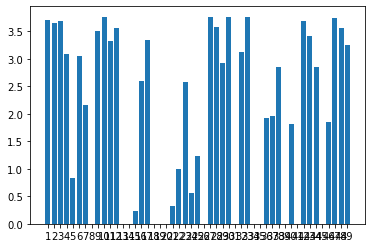

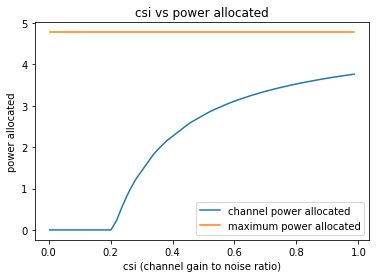

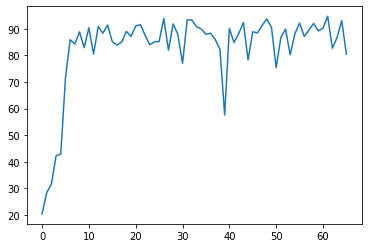

66
Power Allocated= 2.685248455139907
CSI= 0.5853345634723796
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.058370


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048327
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001198

Power Allocated= 1.419771593841118
CSI= 0.3362586132472779
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.616973
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057445
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000220

Power Allocated= 1.2995903184558308
CSI= 0.3231975571241609
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.433837
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004132
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.005025

Power Allocated= 0
CSI= 0.1458037006215921
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.022749325633982465
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7063205585521386
CSI= 0.372

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001123
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000015

Power Allocated= 1.3903295149087236
CSI= 0.3329622362870366
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.736997
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.205202
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007726

Power Allocated= 1.0792305748366209
CSI= 0.3017098619672339
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.610678
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013288
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.087782

Power Allocated= 0
CSI= 0.171613104364146
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.190189590113167
CSI= 0.8309212239939536
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.705020
Model client10 Train Epoch: 2 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5523, Accuracy: 8343/10000 (83%)

Power in training Round= 97.99354855785795



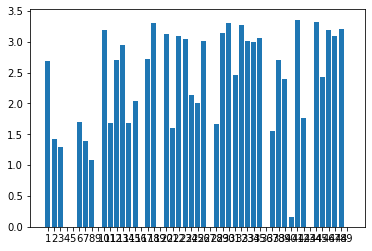

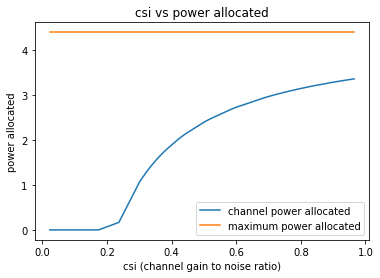

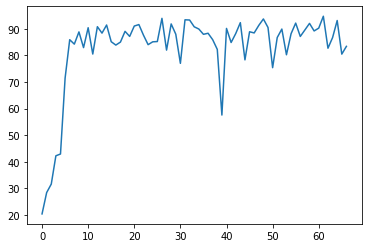

67
Power Allocated= 0
CSI= 0.03230444694297363
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4352619934960242
CSI= 0.9940118707194089
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.276975


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006226
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.056157

Power Allocated= 3.3164361981652166
CSI= 0.8890074245415657
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.307935
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002202
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000096

Power Allocated= 1.9786558078950316
CSI= 0.4060698692885938
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.379820
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007883
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.226385

Power Allocated= 0
CSI= 0.12125418929557963
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2190527159720768
CSI= 0.8181742817109271
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.271689
Model client6 Train Epoch: 2 [0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3739, Accuracy: 8585/10000 (86%)

Power in training Round= 98.00437080152193



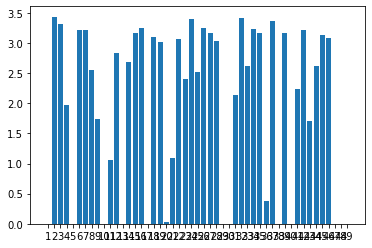

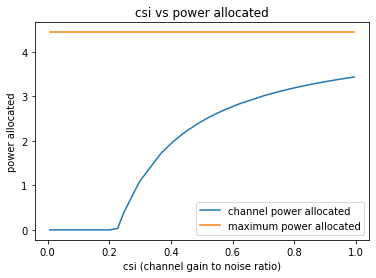

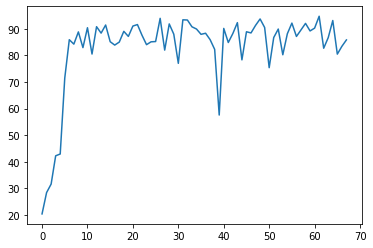

68
Power Allocated= 2.8291095781067894
CSI= 0.6007937888912397
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.524861


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031987
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.024026

Power Allocated= 1.7393726959634228
CSI= 0.3630816418337125
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.185750
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000001
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.066951

Power Allocated= 1.7046094279274544
CSI= 0.35855598248850196
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.168091
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009317
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001935

Power Allocated= 3.3302034520002546
CSI= 0.8595712168728518
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.817215
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037587
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.500532

Power Allocated= 0.8412132890178508
CSI= 0.27379550581363

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000979
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.050414

Power Allocated= 0
CSI= 0.13334422329619067
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4220328210143824
CSI= 0.933235085420585
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.215311
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075031
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.456270123321798
CSI= 0.9640374825222534
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.745462
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.083874
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000642

Power Allocated= 1.3514326616765775
CSI= 0.31825428337099515
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.671237
Model client12 Train Epo

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2198, Accuracy: 9385/10000 (94%)

Power in training Round= 97.99240766840795



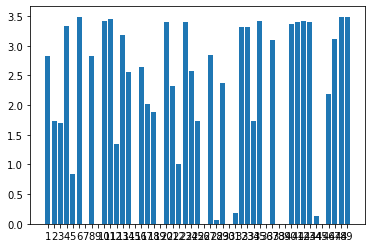

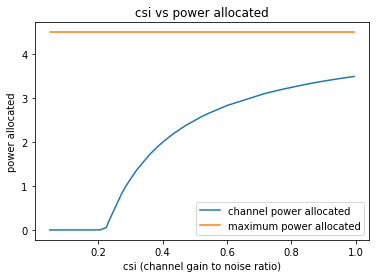

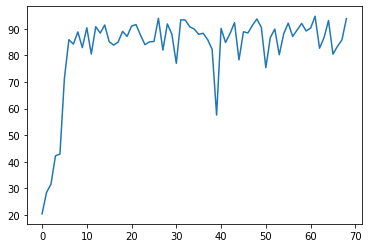

69
Power Allocated= 1.5527456492592475
CSI= 0.3537708488746021
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.2225085667544464
CSI= 0.24056239965182635
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.187775


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000742
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001546

Power Allocated= 3.3624058409390885
CSI= 0.9832567731299865
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.170561
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005175
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.037117

Power Allocated= 0
CSI= 0.19843401455902143
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8655531916557573
CSI= 0.6605539072170994
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.830726


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.065780
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.329264

Power Allocated= 0
CSI= 0.15004024119962145
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.003490792693853
CSI= 0.7267740892029148
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.494162
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038899
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.198287

Power Allocated= 0.3423467326724037
CSI= 0.2477033291362386
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.107956
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001370
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.117997

Power Allocated= 1.369229214906901
CSI= 0.3322032926521621
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.448386
Model client9 Train Epoch: 2 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3014, Accuracy: 8949/10000 (89%)

Power in training Round= 98.00717785034416



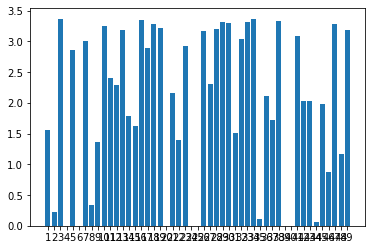

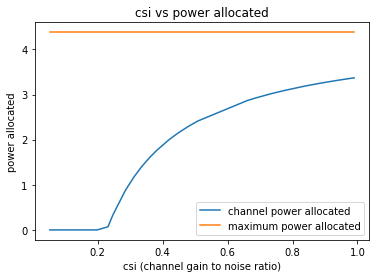

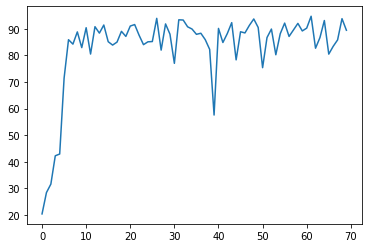

70
Power Allocated= 0
CSI= 0.07478343619866368
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.126525099490868
CSI= 0.6909878716744539
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.044606


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000003
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009924

Power Allocated= 2.808661929052369
CSI= 0.5665508681032644
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.301279
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007824
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.018627

Power Allocated= 1.8319172350382216
CSI= 0.3647224050434459
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.265619
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026707
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.088166

Power Allocated= 3.5539308077960263
CSI= 0.9805866440331746
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.754419
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.229988
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.172819

Power Allocated= 0.5689610605576014
CSI= 0.2497023895278085

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2576, Accuracy: 9236/10000 (92%)

Power in training Round= 97.99840160672173



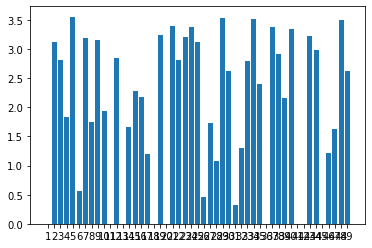

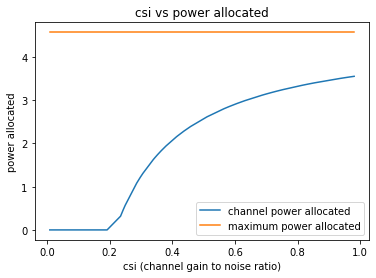

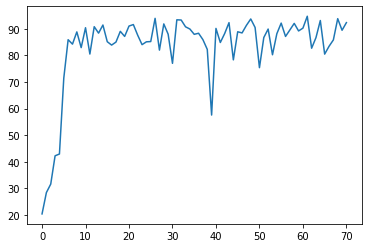

71
Power Allocated= 0
CSI= 0.09627039241749735
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14423042491879268
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2343876739341404
CSI= 0.6387903942847459
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.18922486484442
CSI= 0.27696062544964173
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.607503


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006004
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.005313

Power Allocated= 1.737863827626334
CSI= 0.3265857903363255
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.180397
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.312070
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.059545

Power Allocated= 3.672235268050847
CSI= 0.8868305458392628
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.328707
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.033239
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.168864

Power Allocated= 0.47701945840811
CSI= 0.23133010235535223
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.455063
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.130200
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.129504

Power Allocated= 0
CSI= 0.2018572038487073
SNR= 19.2408940521

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2899, Accuracy: 9200/10000 (92%)

Power in training Round= 98.00342596451758



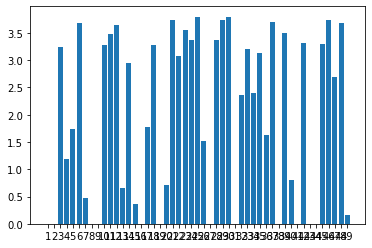

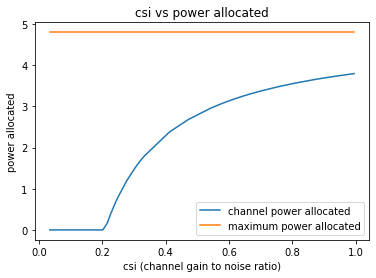

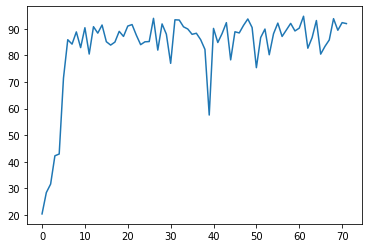

72
Power Allocated= 0
CSI= 0.14464612463300708
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 4.004027499385437
CSI= 0.9220727655477764
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3894144998774163
CSI= 0.5885378348731178
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.242168


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031747
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007149

Power Allocated= 0
CSI= 0.09196830852570459
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13824367780626456
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6995323320754077
CSI= 0.2278419035604875
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.430121
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025806
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011048

Power Allocated= 0
CSI= 0.024964868836473197
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06100510835082862
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17683

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4873, Accuracy: 9205/10000 (92%)

Power in training Round= 97.9927786924829



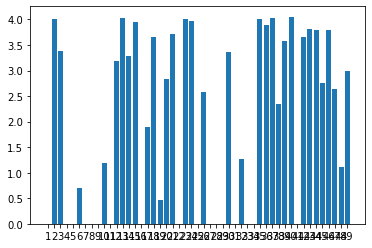

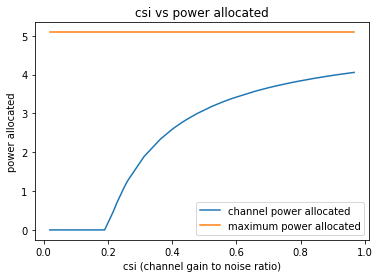

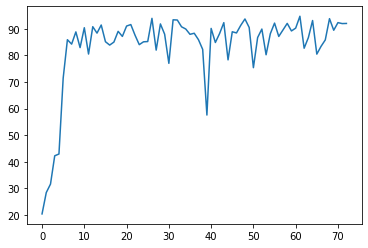

73
Power Allocated= 2.1711912953613375
CSI= 0.4524555896463436
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.946828


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054247
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.254730

Power Allocated= 2.216695061116232
CSI= 0.4619667614390337
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.684210
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.042054
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003326

Power Allocated= 3.131700976758033
CSI= 0.8002227916041739
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.508742
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015361
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.010513

Power Allocated= 2.496078502301841
CSI= 0.5304267476624215
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.761207
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.096125
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.090024

Power Allocated= 0
CSI= 0.16272274702468092
SNR= 18.429004777

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025603
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.259979

Power Allocated= 0
CSI= 0.0577739814911814
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.297476115275705
CSI= 0.9226140434785768
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.810637
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.076876
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000555

Power Allocated= 0
CSI= 0.13088948519311694
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.638358555512685
CSI= 0.5737253065159943
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.756896
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001416
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.115302

Power Allocated= 3.2212723016634808
CSI= 0.86

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3016, Accuracy: 9025/10000 (90%)

Power in training Round= 97.99890600312212



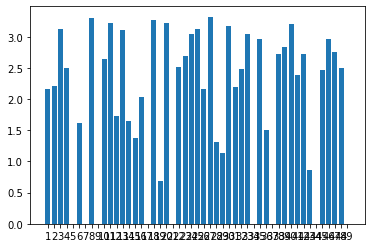

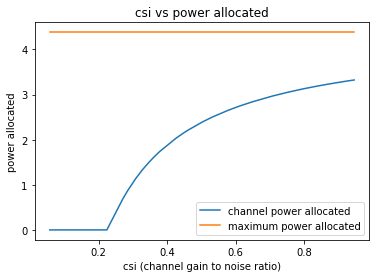

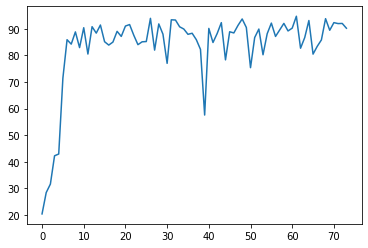

74
Power Allocated= 1.0362983698534571
CSI= 0.27195155850592634
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.729997


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023229
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.392358

Power Allocated= 1.0058995705873905
CSI= 0.2697217684206049
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.285659
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000554
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000017

Power Allocated= 2.6384542617795272
CSI= 0.48193477861043865
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13954150030053347
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4265153703821882
CSI= 0.7770560459790326
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.807310482571574
CSI= 0.25600895590602823
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001657
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003614

Power Allocated= 3.6784780882597854
CSI= 0.96623422720062
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.533179
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030891
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.213574

Power Allocated= 3.698629274552697
CSI= 0.9854211313772697
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.832740
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004501
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.374387906091077
CSI= 0.427526567386296
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.664886
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.157889
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.115134

Power Allocated= 1.6642640936149316
CSI= 0.3279592038802881
SNR=

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4892, Accuracy: 8279/10000 (83%)

Power in training Round= 97.99800619844373



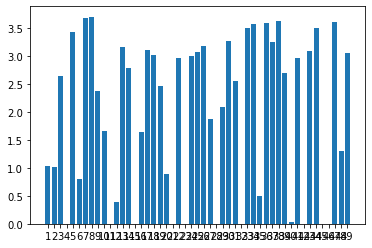

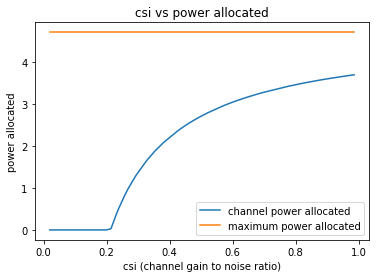

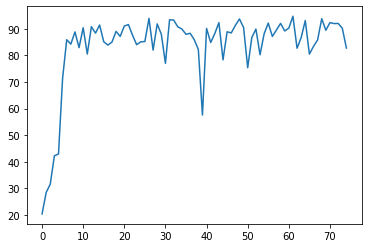

75
Power Allocated= 2.6897723187788616
CSI= 0.7602514722963457
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.954162


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.046369
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011631

Power Allocated= 2.7212655123449423
CSI= 0.7789004894796011
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.2050404575761915
CSI= 0.555528981387352
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.322019
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000234
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.071524

Power Allocated= 2.0595743616878774
CSI= 0.5139928909847032
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.703447
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.041257
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001043

Power Allocated= 2.793121054577596
CSI= 0.8250787590287816
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.879792
Model client5 Tra

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0.12311568744781232
CSI= 0.25759845407836346
SNR= 20.466394740873444
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.474332
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.017664
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.005656

Power Allocated= 2.5660653446843584
CSI= 0.6948974706339872
SNR= 20.54304442884906
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.974568
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038163
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000038

Power Allocated= 2.4993076870919064
CSI= 0.6640904936598936
SNR= 20.559061872099633
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.564848
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013607
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.113562

Power Allocated= 2.9502478572281166
CSI= 0.

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2560, Accuracy: 9147/10000 (91%)

Power in training Round= 98.00262852288154



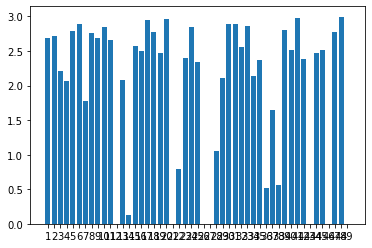

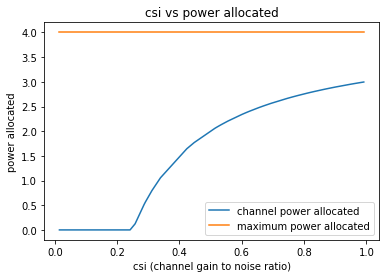

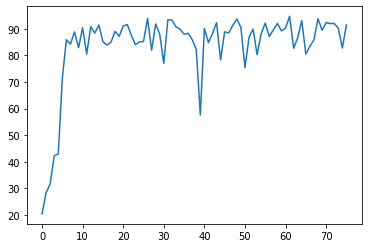

76
Power Allocated= 2.279880143426049
CSI= 0.4371429408077744
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.209575


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008552
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.048184

Power Allocated= 0
CSI= 0.13484762351769342
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.549263047543894
CSI= 0.24886775391674787
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.160484


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000316
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004833

Power Allocated= 2.7066959173723424
CSI= 0.5374132348622745
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.764055
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.052660
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.099534

Power Allocated= 2.251038448869028
CSI= 0.4317000905962317
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.687836
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.084129
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.272845

Power Allocated= 0
CSI= 0.09953683081543963
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.139519887226289
CSI= 0.7003087924728493
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.450488
Model client7 Train Epoch: 2 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2303, Accuracy: 9324/10000 (93%)

Power in training Round= 97.99424114901724



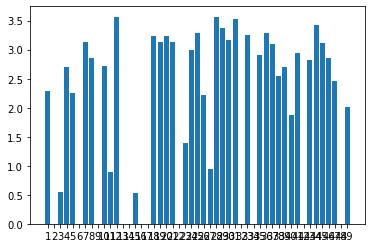

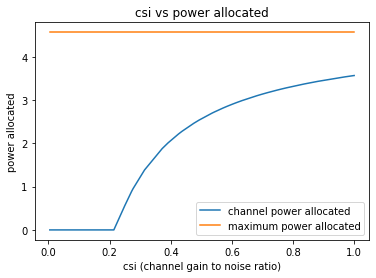

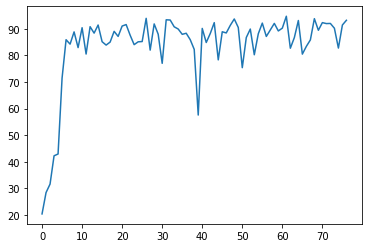

77
Power Allocated= 2.651393978866971
CSI= 0.608221204184817
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.227335926172817
CSI= 0.9361571528850353
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.350796


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000090
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.385213

Power Allocated= 3.2681492852565297
CSI= 0.9733465015718078
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.649258
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.085492
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000352

Power Allocated= 1.5152024069902623
CSI= 0.35966950470556514
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.537141
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026190
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.034011

Power Allocated= 2.431445218626202
CSI= 0.5364555252554841
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.822977
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.351375
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.069514

Power Allocated= 2.89280806569082
CSI= 0.7128983223099823


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007629
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 3.1688820670907223
CSI= 0.8875866383746217
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.971968
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011188
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.823992918541858
CSI= 0.6795603144838999
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.464498
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004232
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000004

Power Allocated= 0.9560024159347331
CSI= 0.2994433142070758
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.507999
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003259
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.9271556563441767
CSI= 0.7307

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4336, Accuracy: 8718/10000 (87%)

Power in training Round= 98.00296450517286



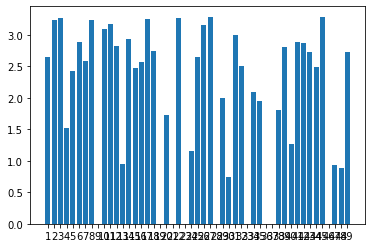

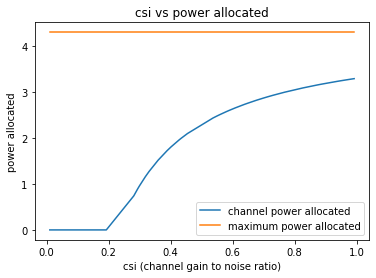

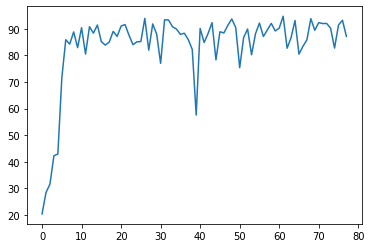

78
Power Allocated= 2.3303896106475945
CSI= 0.5747305511625719
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.400951


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.072296
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.331444

Power Allocated= 0.15638336171621914
CSI= 0.255496232793184
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.232935
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001182
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.286285

Power Allocated= 2.074074179040882
CSI= 0.5009364464361479
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.418333
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015866
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.297856

Power Allocated= 0
CSI= 0.2356783211264768
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.91790881826247
CSI= 0.8677342397622777
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.434702


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.126976
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.021710

Power Allocated= 2.6216137204251098
CSI= 0.6902637111808834
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.509622
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044820
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002202

Power Allocated= 2.5283378752370815
CSI= 0.6485094734397486
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.274442
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.077724
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011857

Power Allocated= 0.30054952882225683
CSI= 0.2652670563606635
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.289716
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.046931
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.098770

Power Allocated= 0
CSI= 0.15768318509338153
SNR= 19.62336

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2439, Accuracy: 9340/10000 (93%)

Power in training Round= 98.00599047444773



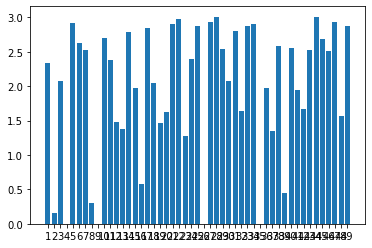

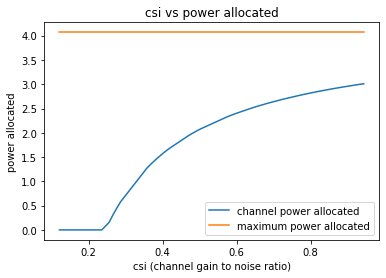

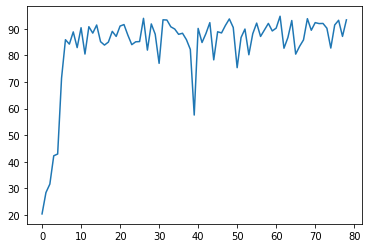

79
Power Allocated= 0.539455852190398
CSI= 0.250166514444493
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.448538


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014565
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.146190

Power Allocated= 3.068287760958725
CSI= 0.6809643607813223
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.088368
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000094
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003417

Power Allocated= 3.2957545000761694
CSI= 0.8057765188103186
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.050280
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003403
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000309

Power Allocated= 0.6385544836175772
CSI= 0.2565260936743856
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.301869
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.134126
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.128686

Power Allocated= 2.6336960997224574
CSI= 0.5254592094589097

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014354
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.017502

Power Allocated= 1.2568735795801818
CSI= 0.3048855022225685
SNR= 20.54304442884906
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.093522
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000011
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.021756

Power Allocated= 0.42338116326687203
CSI= 0.2431071684049102
SNR= 20.559061872099633
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.827164
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.100834
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.233626

Power Allocated= 0
CSI= 0.19805558584677863
SNR= 20.627161125173572
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7897500104109603
CSI= 0.3640277419052791
SNR= 20.8358788807459
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.319987
Model client19 Train

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2197, Accuracy: 9385/10000 (94%)

Power in training Round= 98.00700991833936



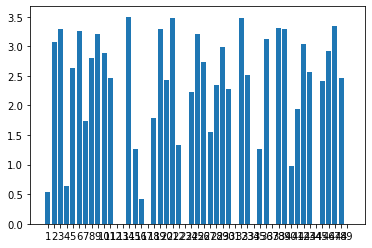

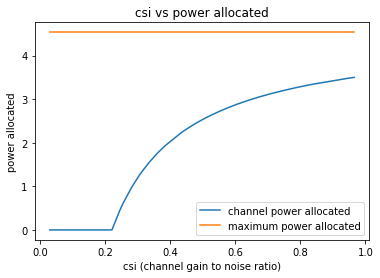

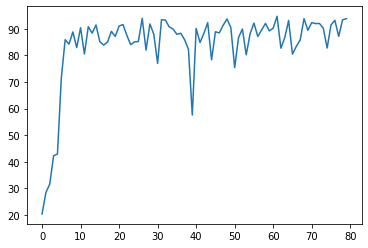

80
Power Allocated= 0
CSI= 0.1310975757045828
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0021203454850243
CSI= 0.8272936958355493
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.254361


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003998
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009926

Power Allocated= 2.785609974413626
CSI= 0.7016209835056341
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.209404
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000056
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000476

Power Allocated= 3.1282791601672426
CSI= 0.9237007000460883
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.20920800274650053
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0476338284126747
CSI= 0.8596625862407108
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.087736150395447
CSI= 0.8903571742198184
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Los

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2939, Accuracy: 9180/10000 (92%)

Power in training Round= 98.00624476209791



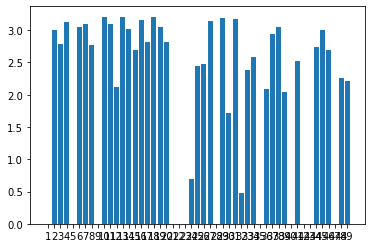

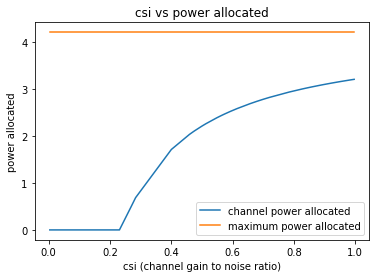

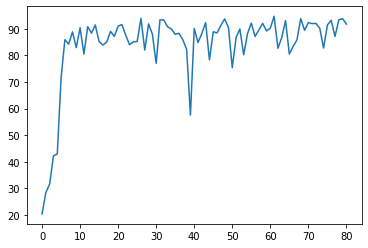

81
Power Allocated= 0
CSI= 0.030470864350481408
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17629093786464933
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14062503039848695
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9202840023468113
CSI= 0.6347955639831119
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.482343


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025841
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.119197

Power Allocated= 3.0334723763033313
CSI= 0.683937482761688
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.904075
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.234024
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.047284

Power Allocated= 2.192267295580526
CSI= 0.43415459049172056
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.358737
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018729
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.078002074168373
CSI= 0.7054214670369492
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.092190
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002044
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.020941

Power Allocated= 3.3358939871772173
CSI= 0.8622917263997074


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3211, Accuracy: 8946/10000 (89%)

Power in training Round= 97.99559789657371



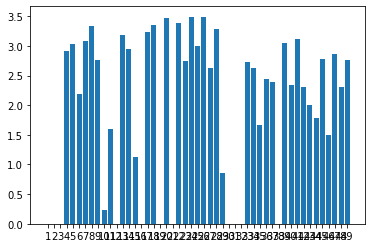

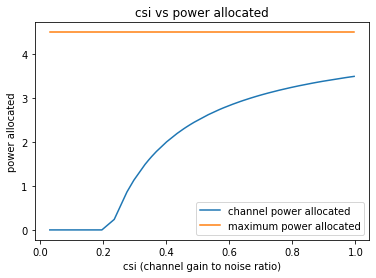

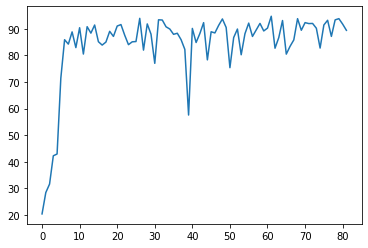

82
Power Allocated= 3.271345350371842
CSI= 0.8225195254629745
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.102628


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.017747
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.070319

Power Allocated= 3.352299969938227
CSI= 0.8811954727519452
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.368169
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008868
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000804

Power Allocated= 2.8479460772737193
CSI= 0.6100626604827063
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.384496
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001535
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.173821

Power Allocated= 1.128473385596466
CSI= 0.29773880114413354
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.299050
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.055692
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.040214

Power Allocated= 0
CSI= 0.22254465483691344
SNR= 18.4290047

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038723
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000017

Power Allocated= 2.4983286043930963
CSI= 0.5028174481743832
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.804635
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015192
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001623

Power Allocated= 0.7525193362714782
CSI= 0.2677661054627142
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.332375
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000044
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000209

Power Allocated= 2.830259962011496
CSI= 0.603550568018919
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.341411
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113782
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.100974

Power Allocated= 1.2468375886489351
CSI= 0.3086148885107487
S

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2741, Accuracy: 9169/10000 (92%)

Power in training Round= 97.99660512823569



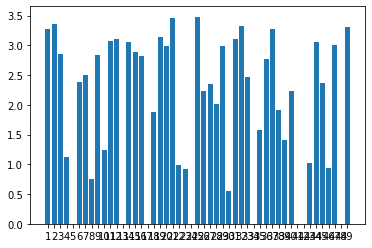

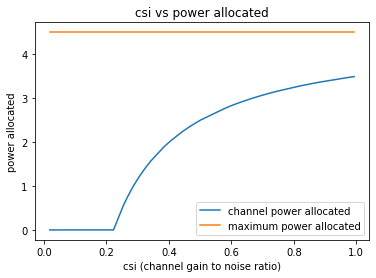

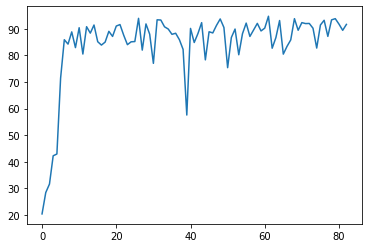

83
Power Allocated= 3.7846804777077647
CSI= 0.9596558306622879
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.646358


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.091257
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028710

Power Allocated= 0.5976883635779915
CSI= 0.2364607111783097
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.459425
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003540
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.016063

Power Allocated= 0
CSI= 0.08217390760595045
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3920897075172265
CSI= 0.6970433422665065
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.662270


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022319
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000916

Power Allocated= 0
CSI= 0.09879675067773175
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0886673066871015
CSI= 0.5753563089161866
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.186353
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022019
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.2724487810240293
CSI= 0.643388052696678
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.421541
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.041018
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009735

Power Allocated= 0
CSI= 0.12383903735817914
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.15063074987532
CSI= 0.37367

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2958, Accuracy: 9128/10000 (91%)

Power in training Round= 98.00216595654005



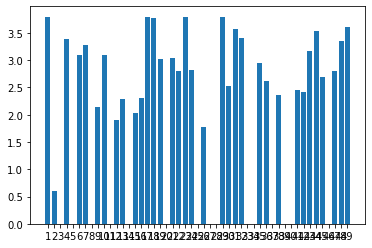

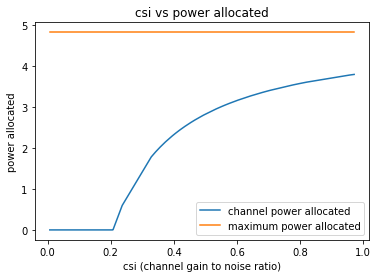

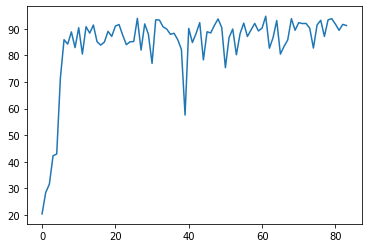

84
Power Allocated= 2.5519780742373603
CSI= 0.6089018049120001
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.382999


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032843
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.038864

Power Allocated= 2.332814748409779
CSI= 0.5372114975067788
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.220498
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000494
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.005446

Power Allocated= 3.0697868630272214
CSI= 0.8892903418899197
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.201957
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001845
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 2.7992165286723267
CSI= 0.7168137757892904
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.595596
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002980
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023488

Power Allocated= 2.4101602127921207
CSI= 0.5605007947015647

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005826
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.166832

Power Allocated= 0
CSI= 0.21816952188393224
SNR= 20.18554291572515
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13101625260171124
SNR= 20.19679116644772
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8725038140628234
CSI= 0.7565583073709978
SNR= 20.466394740873444
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.612399
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039840
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.179205

Power Allocated= 0
CSI= 0.07544965866621267
SNR= 20.54304442884906
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.723027670262617
CSI= 0.6796935217319477
SNR= 20.559061872099633
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.734071
Model clien

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2892, Accuracy: 9119/10000 (91%)

Power in training Round= 97.99995330045333



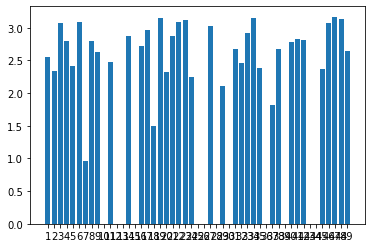

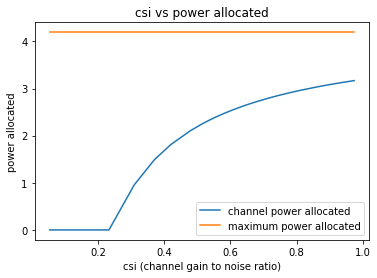

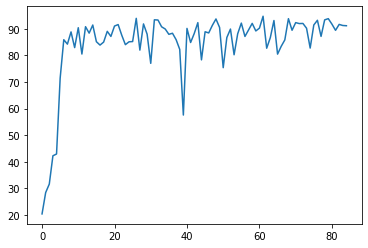

85
Power Allocated= 3.077572093414168
CSI= 0.8005222159979819
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9467220074379359
CSI= 0.42016194914498683
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.603865


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.083307
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.017967

Power Allocated= 0.08170267511403662
CSI= 0.23556826433897593
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.642958
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010769
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.3130572643012344
CSI= 0.9864857383566891
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.755660
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024966
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.111127

Power Allocated= 2.835314586288808
CSI= 0.6704920127151045
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.794014469175213
CSI= 0.6524254397736715
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.622042
Model client6 T

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010927
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 3.1375566060349387
CSI= 0.8409014059241757
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.780638
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039947
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.366404

Power Allocated= 2.0611176049888447
CSI= 0.4413765716005267
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.775832
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000213
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006449

Power Allocated= 2.1443225562177526
CSI= 0.4582039827906357
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.439531
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.148204
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009532

Power Allocated= 0
CSI= 0.11059560007965019
SNR= 20

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2324, Accuracy: 9306/10000 (93%)

Power in training Round= 98.00549858332944



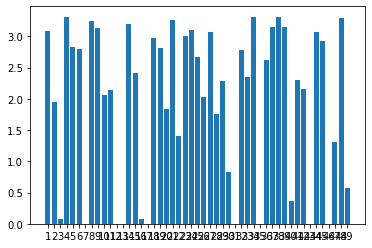

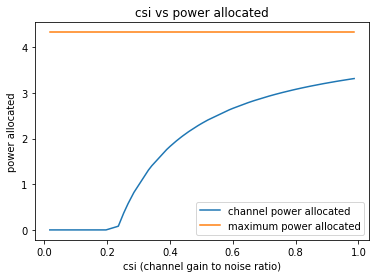

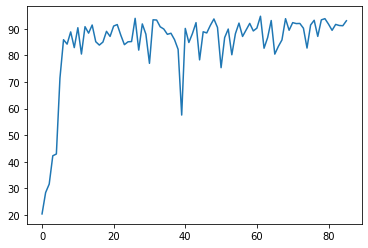

86
Power Allocated= 0
CSI= 0.21920094273272928
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.047998805485018
CSI= 0.7007340025660866
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.97854767567787
CSI= 0.6682141780722661
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.176397


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000462
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.022153

Power Allocated= 0
CSI= 0.016719270627710503
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0961845954157314
CSI= 0.7252214090847386
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.120823789676205
CSI= 0.7384160707300724
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8519237294862867
CSI= 0.6160859641458991
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.422302
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004278
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002656

Power Allocated= 2.807451176207269
CSI= 0.5996560387911608
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Lo

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3306, Accuracy: 9103/10000 (91%)

Power in training Round= 97.99862183935642



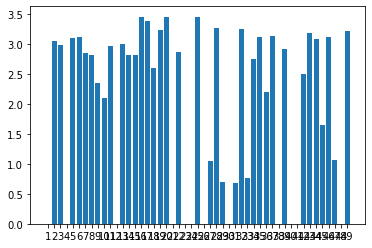

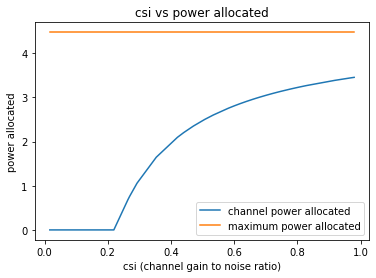

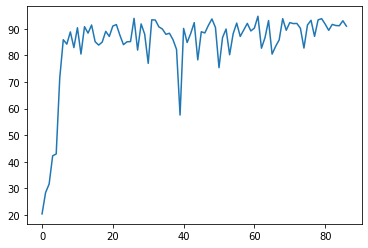

87
Power Allocated= 2.3229729975466338
CSI= 0.43522312176493005
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.750030


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.154520
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.034773

Power Allocated= 0
CSI= 0.031457916856601265
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1562231522930144
CSI= 0.6828633244256851
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.288249


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011995
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000515

Power Allocated= 0
CSI= 0.19040876937653284
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16962742239347872
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1214903025563151
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4261500158477842
CSI= 0.8371738500920142
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.674834
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.115061
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000007

Power Allocated= 2.4763621083577476
CSI= 0.46635636757081944
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.117138
Model client8 Trai

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3116, Accuracy: 9298/10000 (93%)

Power in training Round= 97.99957093010812



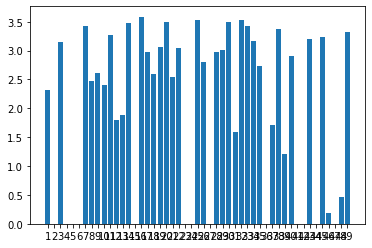

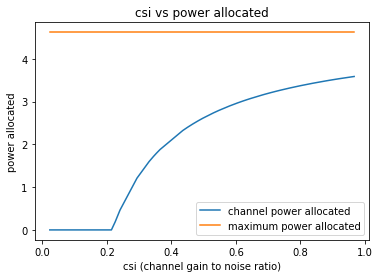

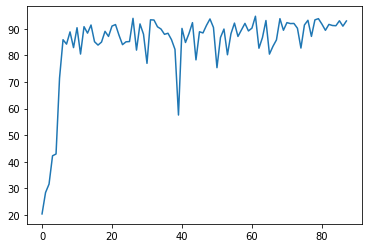

88
Power Allocated= 2.968742730613645
CSI= 0.6225714821342198
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.656611


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.143029
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009315

Power Allocated= 0
CSI= 0.12655319839571866
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.401054343380424
CSI= 0.45999648731918164
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.445922


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002756
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.215273

Power Allocated= 3.4522958160427666
CSI= 0.890719280182451
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.706649
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023668
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.17641637436973334
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7867444010644213
CSI= 0.5592091840230997
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.388920
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018389
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.459716851036365
CSI= 0.8966461641829356
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.848070
Model client7 Train Epoch: 2 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2569, Accuracy: 9168/10000 (92%)

Power in training Round= 97.99234005660176



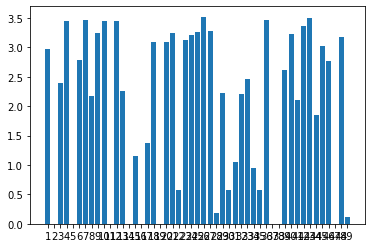

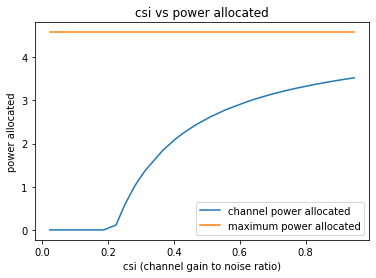

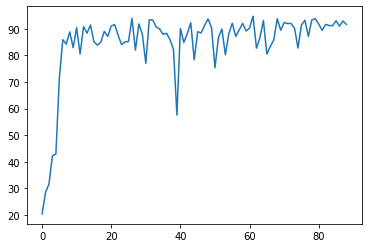

89
Power Allocated= 0
CSI= 0.19764442652696745
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.418838343473062
CSI= 0.7079413806034449
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.742018


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000258
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.9084480875668435
CSI= 0.5200379495684939
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.193502494690002
CSI= 0.37909198808115574
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.541467
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000556
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023863

Power Allocated= 2.991005186831926
CSI= 0.5433661951307255
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.274590
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.173564
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.220077

Power Allocated= 0
CSI= 0.030527410004484223
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4715226906

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.8041, Accuracy: 7214/10000 (72%)

Power in training Round= 97.99604030241339



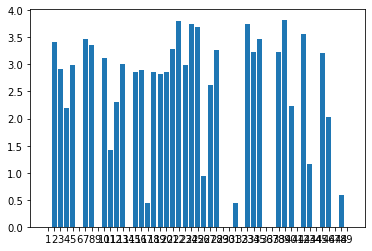

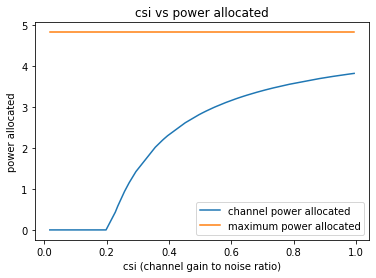

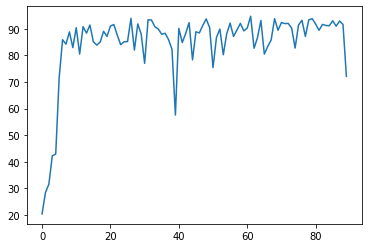

90
Power Allocated= 0
CSI= 0.12346856433656261
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9499184044857825
CSI= 0.28274138875143073
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.069151


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013546
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028242

Power Allocated= 0
CSI= 0.07060515926972799
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1001307276497387
CSI= 0.7211944567572975
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.285308961225304
CSI= 0.8323550736186398
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.504050
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075330
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.076997

Power Allocated= 3.243763926739927
CSI= 0.8045341070096148
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.917928524043502
CSI= 0.6374336262146324
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.9194, Accuracy: 6914/10000 (69%)

Power in training Round= 97.99406404503414



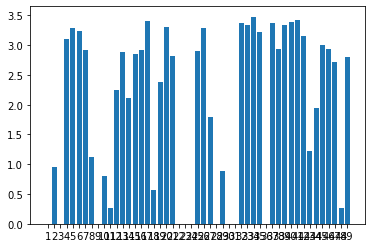

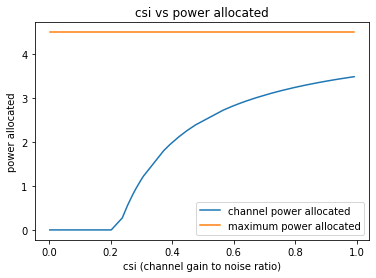

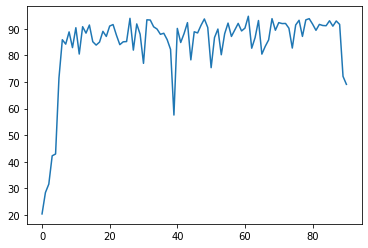

91
Power Allocated= 2.812730870711765
CSI= 0.5174770719436964
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.3271993676955578
CSI= 0.22634756909029496
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.444844


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011087
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.035812

Power Allocated= 3.4059079858790655
CSI= 0.746672276138977
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.434579
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008726
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011677

Power Allocated= 3.4580847791809513
CSI= 0.7769410971631214
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.298612
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.235959
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.150470

Power Allocated= 2.8433253072431364
CSI= 0.525801519234503
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.721019
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.238405
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.227770

Power Allocated= 1.6980789745494023
CSI= 0.328180390977553
S

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.165073
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.047232

Power Allocated= 2.7826633636638043
CSI= 0.5095488758855566
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.280494
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001770
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000050

Power Allocated= 1.1041197006567716
CSI= 0.274644998561304
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.946133
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.124283
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.158411

Power Allocated= 0
CSI= 0.12877309100960055
SNR= 20.18554291572515
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11365003927735917
SNR= 20.19679116644772
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2506084781203253
CS

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.7885, Accuracy: 7755/10000 (78%)

Power in training Round= 98.00011554374039



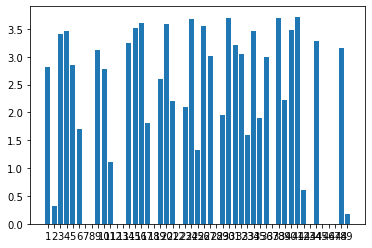

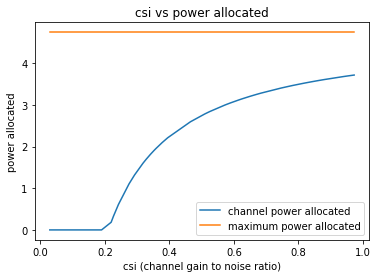

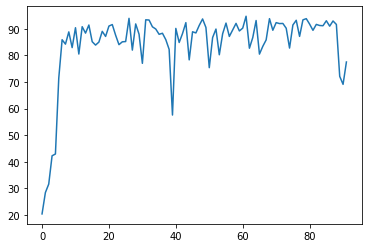

92
Power Allocated= 3.3738055909025477
CSI= 0.8348416349864156
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.052610


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021891
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007706

Power Allocated= 0.8653522940417955
CSI= 0.2698119351550874
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.687625
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003375
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000730

Power Allocated= 3.0714879362507785
CSI= 0.6666001735998519
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.552096246909246
CSI= 0.9808332301953674
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.953775
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.050732
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002390

Power Allocated= 0
CSI= 0.04077407441385594
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.23322724910

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001025
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000233

Power Allocated= 3.5589872768921795
CSI= 0.987507746863605
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.385978
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.103690
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.063307

Power Allocated= 0
CSI= 0.20216358089736963
SNR= 19.996251205202647
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10841706901271331
SNR= 20.095472826104007
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.020073391620007208
SNR= 20.18554291572515
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9321440648608132
CSI= 0.6099444752994525
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.459901
Model client14 T

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6434, Accuracy: 7859/10000 (79%)

Power in training Round= 98.00374537304828



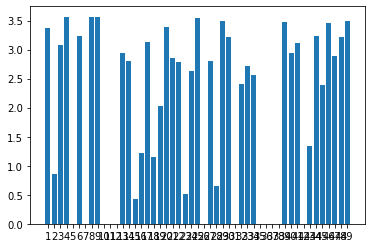

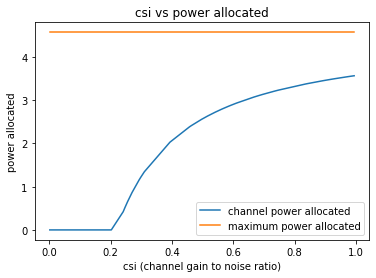

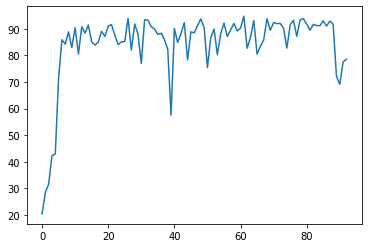

93
Power Allocated= 2.565409842203204
CSI= 0.6012225596608984
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.122771555876099
CSI= 0.9042279223722826
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.532222


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028109
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.1948948264442394
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.021327928774215
CSI= 0.45302996908606086
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.539313


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019802
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000131

Power Allocated= 2.0334548485314263
CSI= 0.4555326005455096
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.137273
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.134370
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.130933

Power Allocated= 0
CSI= 0.06505786450605078
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8011207971413423
CSI= 0.700492703591719
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.223269
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019666
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.084552

Power Allocated= 3.2254009322833284
CSI= 0.996724282447145
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.356615
Model client8 Train Epoch: 2 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4905, Accuracy: 8465/10000 (85%)

Power in training Round= 97.99794605171107



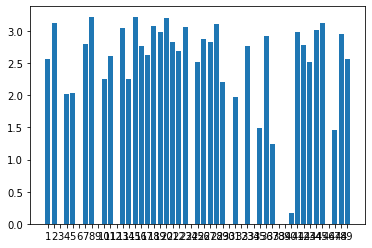

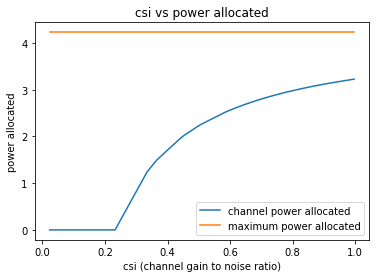

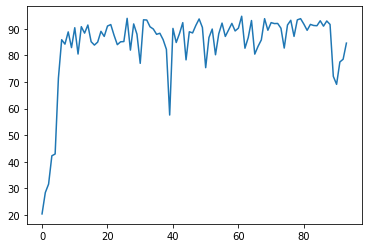

94
Power Allocated= 0
CSI= 0.18637479699859172
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.190278215791771
CSI= 0.8975617305329843
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.210096


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003826
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.182473

Power Allocated= 2.454379356850364
CSI= 0.5405322553063387
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.560623
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000572
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004039

Power Allocated= 1.5486185925966467
CSI= 0.362872468148992
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.795389
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015872
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001975

Power Allocated= 2.5280974921123445
CSI= 0.5629647276472504
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.632152
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.046044
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.110101

Power Allocated= 1.6687048048246869
CSI= 0.37940543173849195

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4324, Accuracy: 8693/10000 (87%)

Power in training Round= 97.99814922831872



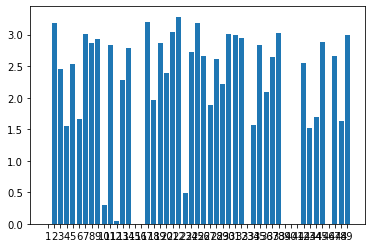

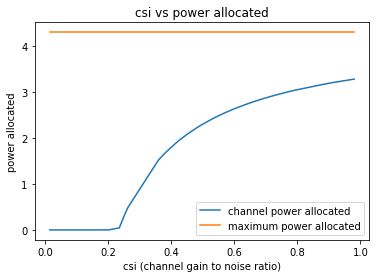

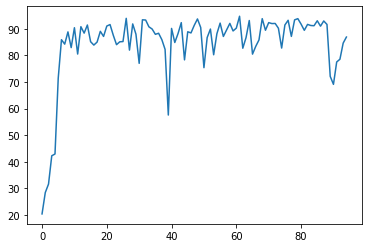

95
Power Allocated= 2.184894891540618
CSI= 0.4148911066476868
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.212654325519688
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.03925985530479981
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1700004584478899
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.6396820779704937
CSI= 0.25281357443538477
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.340700


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.136340
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.128954

Power Allocated= 0.6317044269967078
CSI= 0.2523047115438435
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.263018
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.196383
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.551685

Power Allocated= 3.159249097613765
CSI= 0.6964191855990728
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1884652348425804
CSI= 0.7108832995425011
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.465148
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000014
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002944

Power Allocated= 0
CSI= 0.2150347493366983
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.155125

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3577, Accuracy: 8958/10000 (90%)

Power in training Round= 98.00212633165121



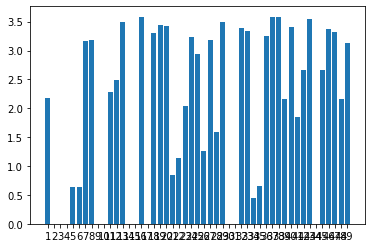

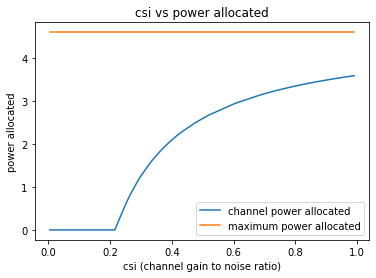

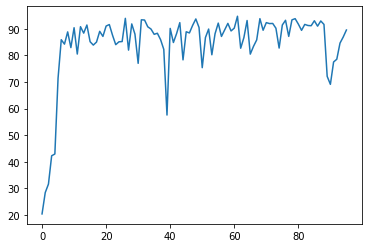

96
Power Allocated= 2.9496469918856034
CSI= 0.5663941948326033
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.635516


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018353
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.018259

Power Allocated= 3.257783779771249
CSI= 0.6861449349610339
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.088181
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001157
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000002

Power Allocated= 3.6398605590170012
CSI= 0.9299373556931021
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.783564
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006261
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.013189

Power Allocated= 0
CSI= 0.1625494207714836
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9741843073934704
CSI= 0.5743767642407417
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.601082


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.081379
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.356679

Power Allocated= 1.5915952828292799
CSI= 0.32014275520853497
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.223195
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.124417
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.433686386998005
CSI= 0.43830516753844184
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.262071
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.216338
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.022291

Power Allocated= 1.0139810252217107
CSI= 0.27018112616796186
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.852609
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.204448
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.3935422444390815
CSI= 0.7566244936100

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5764, Accuracy: 8401/10000 (84%)

Power in training Round= 97.99636707692108



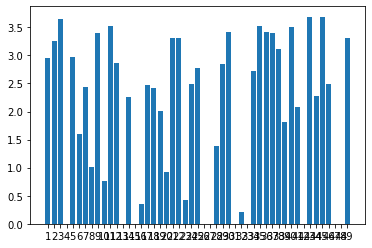

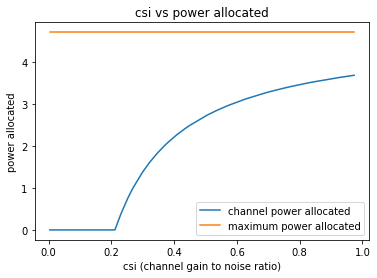

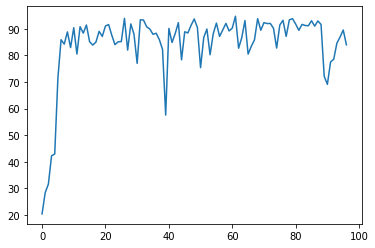

97
Power Allocated= 1.503896342537824
CSI= 0.3309275268796713
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.563725


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.191788
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.097479

Power Allocated= 0.026614746020948488
CSI= 0.22226710713241238
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.934513
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023889
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.059540

Power Allocated= 3.4384509548086566
CSI= 0.9197473905486776
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.614335
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000978
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014002

Power Allocated= 2.8650346999243923
CSI= 0.6021661203211772
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.323961
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027770
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.8773660234670073
CSI= 0.606670958713

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.035333
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.153601

Power Allocated= 1.9700690740910272
CSI= 0.3912918873158864
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.655847
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.118549
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.456739

Power Allocated= 2.982987311686987
CSI= 0.648206313311739
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.548547
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016818
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000007

Power Allocated= 2.3178919752030667
CSI= 0.4529366985519149
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 3.452975
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.129518

Power Allocated= 0
CSI= 0.10369061911223332
SNR=

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3428, Accuracy: 8762/10000 (88%)

Power in training Round= 97.99782760497214



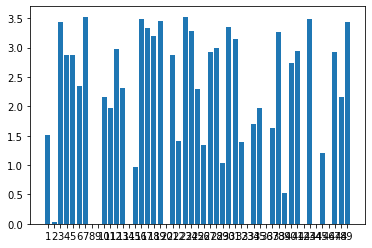

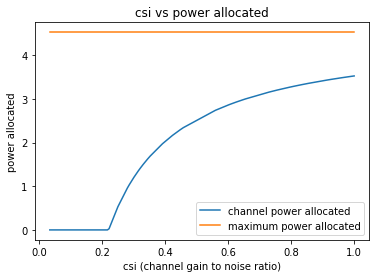

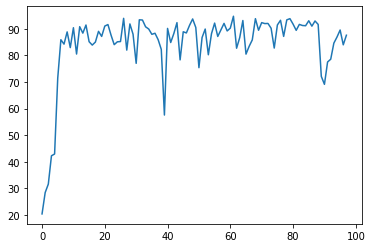

98
Power Allocated= 0.37144695420537577
CSI= 0.23373124209055285
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.512791


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048993
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002649

Power Allocated= 2.7324210741713597
CSI= 0.5215275952849874
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.403238
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.017706
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.098049713829983
CSI= 0.6444065281035315
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.306334
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002833
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.010490

Power Allocated= 3.2498262233123736
CSI= 0.7142658522877576
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.062300
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007178
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.085798

Power Allocated= 3.6457087872420195
CSI= 0.9958608372093759

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.149343
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.019074

Power Allocated= 0
CSI= 0.07508597941955242
SNR= 20.54304442884906
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6046805858391733
CSI= 0.488953425334533
SNR= 20.559061872099633
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.121001
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.060807
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.442368

Power Allocated= 3.57628374509274
CSI= 0.9314617333964784
SNR= 20.627161125173572
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.275846
Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000008
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.0811222534100664
CSI= 0.38929547982595936
SNR= 20.8358788807459
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.329290
Model client19 Train Ep

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3767, Accuracy: 8859/10000 (89%)

Power in training Round= 97.99351740013783



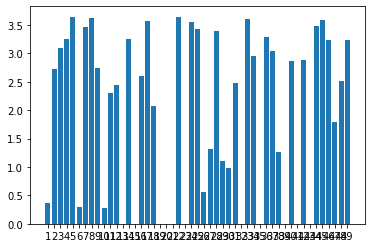

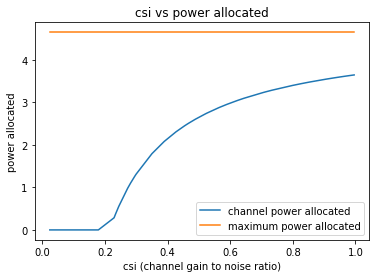

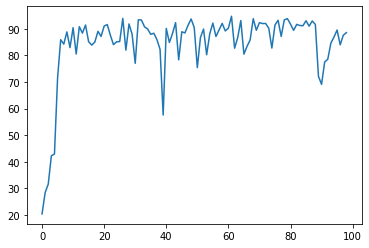

99
Power Allocated= 3.069177854244899
CSI= 0.8326106030195595
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.036691538220301
CSI= 0.44772217850444485
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.455201169905141
CSI= 0.5509586263257209
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.196701


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000088
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009330

Power Allocated= 2.1904562146063182
CSI= 0.4808239534645339
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.429303
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.076579
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000400

Power Allocated= 3.2519746783014787
CSI= 0.9820820977588451
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7944861659022786
CSI= 0.6776292058714718
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.158874
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023530
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.010983

Power Allocated= 3.0738617308427107
CSI= 0.8358703681617691
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.802697
Model client7 T

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000281
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.08915761982935277
SNR= 20.19679116644772
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.856632900023169
CSI= 0.7074204067853959
SNR= 20.466394740873444
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.532927
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.061213
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.134312

Power Allocated= 2.3743644218575453
CSI= 0.5274664805250179
SNR= 20.54304442884906
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.290869
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.043690
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000076

Power Allocated= 3.1686122782393524
CSI= 0.9077645734121013
SNR= 20.559061872099633
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.807870
Model client17 Train 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5646, Accuracy: 8179/10000 (82%)

Power in training Round= 98.00696596285013



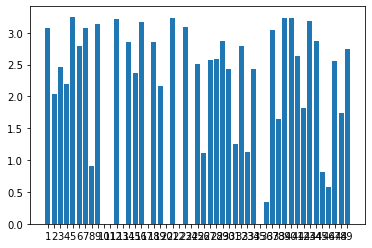

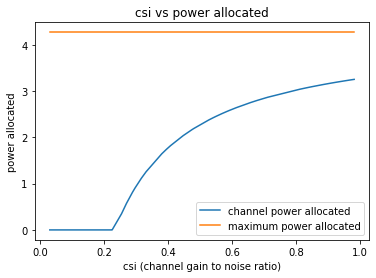

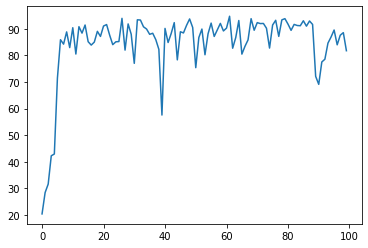

100
Power Allocated= 0
CSI= 0.16342103246482398
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11506573596867808
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2268355536809175
CSI= 0.7274453347778963
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0978862477162099
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16451561338971377
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5496401253723926
CSI= 0.9506885730925064
SNR= 18.596146162761706
Client: client6


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.156094
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036272
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000080

Power Allocated= 0.07158472532404847
CSI= 0.2207542277156911
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.823181
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030743
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029490

Power Allocated= 3.422331021232803
CSI= 0.8480481893238675
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.158879
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.114257
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.069071

Power Allocated= 3.1665283073544277
CSI= 0.696873344368474
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.594792
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022822
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.047772

Po

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4691, Accuracy: 8697/10000 (87%)

Power in training Round= 98.0010030381308



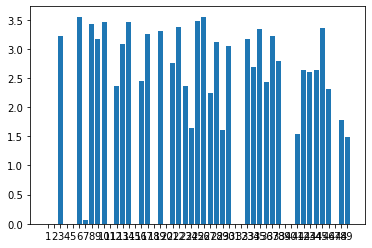

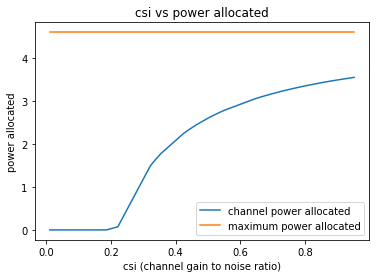

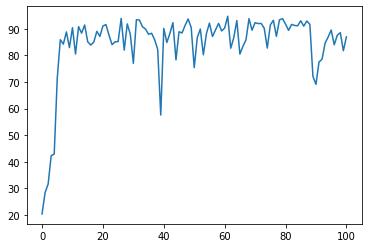

101
Power Allocated= 0
CSI= 0.17704563722568167
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2227270378244558
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9472073355301083
CSI= 0.8263743129866666
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.333908


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001555
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.031294

Power Allocated= 0.5892042671613922
CSI= 0.28026054004852075
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.492001
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054466
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.061071

Power Allocated= 1.3421286629075029
CSI= 0.35521656210891683
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.459943
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.190782
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.083739

Power Allocated= 0
CSI= 0.15667992325739266
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11186700322196264
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0677523340260207
CSI= 0.

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3614, Accuracy: 8765/10000 (88%)

Power in training Round= 97.99350656281696



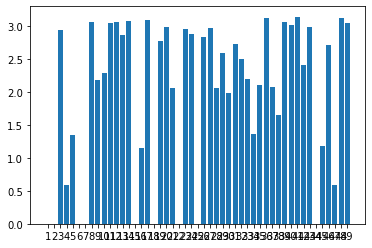

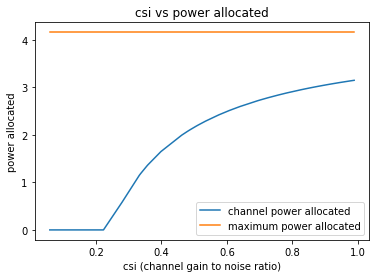

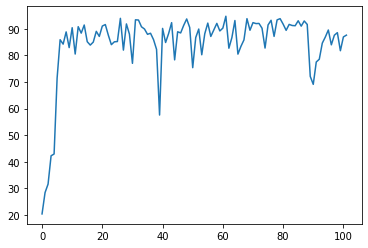

102
Power Allocated= 2.61525547044382
CSI= 0.7265109215335175
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8139344958972394
CSI= 0.8490674202484487
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.954739


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048622
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.722103

Power Allocated= 2.9561638516069078
CSI= 0.9656858799025787
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.604519
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002713
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006842

Power Allocated= 2.740613194515348
CSI= 0.7993067930856331
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.457354
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005501
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.043576

Power Allocated= 0.9946064205272704
CSI= 0.33365688607098754
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.261353
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.097825
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.069316

Power Allocated= 2.7664350938279876
CSI= 0.816151856891362

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.110563

Power Allocated= 1.9476310957482523
CSI= 0.48922095221444273
SNR= 20.8358788807459
Client: client19
Model client19 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.909372
Model client19 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008534
Model client19 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023081

Power Allocated= 2.7932858058280905
CSI= 0.8344379457003857
SNR= 20.95447603565735
Client: client20
Model client20 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.049828
Model client20 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107001
Model client20 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012495

Power Allocated= 0
CSI= 0.21442994789087533
SNR= 21.401971926297648
Client: client21
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.566405398153769
CSI= 0.7016106805755503
SNR= 21.468728856918247
Client: client22
Model client22 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.322155
Model client22 Train 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1973, Accuracy: 9445/10000 (94%)

Power in training Round= 97.99967774051242



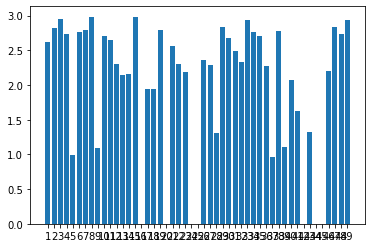

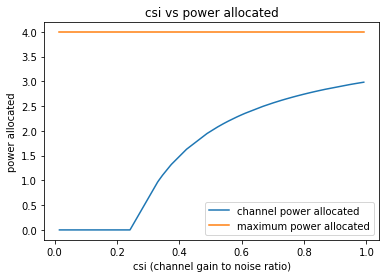

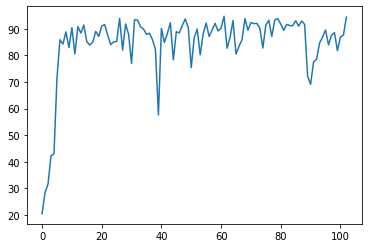

103
Power Allocated= 1.6645835738696988
CSI= 0.37048292368512525
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.558065


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.089526
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.031259

Power Allocated= 1.9748549703999556
CSI= 0.41860124293664336
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.433826
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.217830
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.072250772529231
CSI= 0.7742859410115536
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.268774
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.063297
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003228

Power Allocated= 2.4951202754848403
CSI= 0.5351476883537198
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.280188
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.041328
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 3.2546400699396143
CSI= 0.901613061877350

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000001
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.1782807615479809
SNR= 20.466394740873444
Client: client15
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7220385334090285
CSI= 0.6091154952257787
SNR= 20.54304442884906
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.348929
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028329
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000872

Power Allocated= 3.229698937635659
CSI= 0.8817841604308516
SNR= 20.559061872099633
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.748013
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.111335
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.382389

Power Allocated= 1.6584145380291124
CSI= 0.3696381074977786
SNR= 20.627161125173572
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.322401
Model client18 Train 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2815, Accuracy: 9163/10000 (92%)

Power in training Round= 97.99531468998214



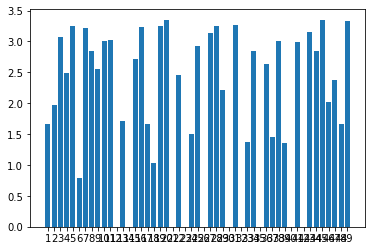

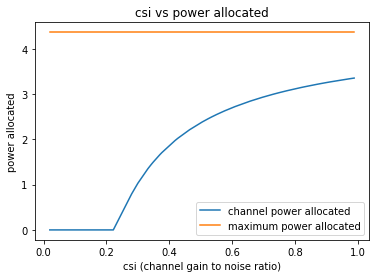

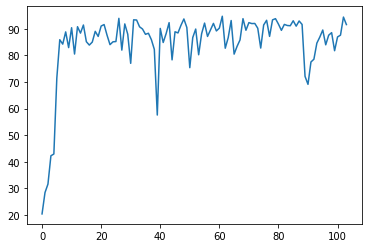

104
Power Allocated= 3.188402049829847
CSI= 0.8610926508396118
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9166668772264348
CSI= 0.29128614091346594
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.338992


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000002
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.102545

Power Allocated= 2.7902571990804947
CSI= 0.6412475828576247
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.023680
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000467
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.038687

Power Allocated= 2.447484659944294
CSI= 0.5256980642464149
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.557229
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.033104
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000079

Power Allocated= 3.103383696205479
CSI= 0.8023534167156244
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.456380
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.302153
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001257

Power Allocated= 2.7579127424196344
CSI= 0.6282178393719207


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.127912
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.155268

Power Allocated= 1.968953634934174
CSI= 0.42003329770015196
SNR= 20.54304442884906
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.597989
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.260957
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.030189

Power Allocated= 3.1341975346319453
CSI= 0.8226933485630523
SNR= 20.559061872099633
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.365962
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.128565
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028068

Power Allocated= 2.463702306698781
CSI= 0.5302184872964394
SNR= 20.627161125173572
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.110911
Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.284647
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.2580334198385987
CSI= 0.916

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2964, Accuracy: 9170/10000 (92%)

Power in training Round= 98.00289741541704



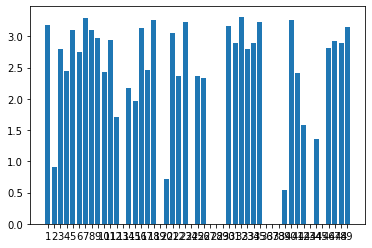

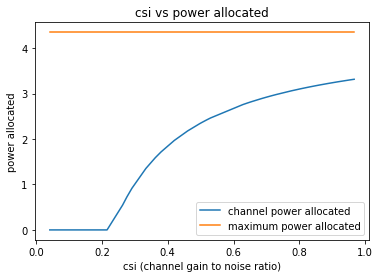

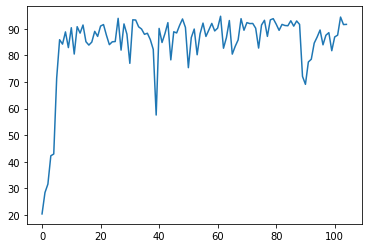

105
Power Allocated= 3.0430030025955137
CSI= 0.8355613084500668
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.701650


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.063087
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.017223

Power Allocated= 0
CSI= 0.10016777548869671
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.867355916205455
CSI= 0.7286253967816234
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.041021


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018433
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.5792206271128713
CSI= 0.602198272033816
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.980303
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.131352
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.044451

Power Allocated= 3.050185807728944
CSI= 0.8406063537946347
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.772986
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.155297
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.109305

Power Allocated= 2.1362734667226184
CSI= 0.4753914096936789
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.371135
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006134
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004037

Power Allocated= 2.6381901990169143
CSI= 0.6243705275412114


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1891, Accuracy: 9471/10000 (95%)

Power in training Round= 97.99538835429041



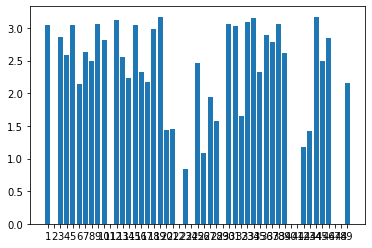

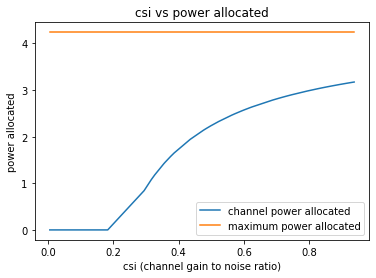

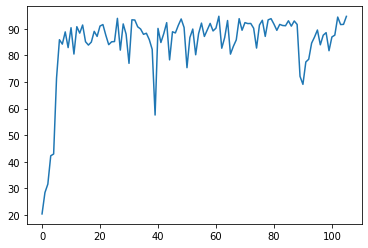

106
Power Allocated= 2.144014217049884
CSI= 0.3993415847035692
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.602241


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.255072
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.095023

Power Allocated= 2.923212607927332
CSI= 0.5797358584820745
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.192919
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002870
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 2.376304393641176
CSI= 0.4401734504956195
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.126621
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039229
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003214

Power Allocated= 3.4134401378274615
CSI= 0.8099159896220257
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.240498
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024708
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.005431

Power Allocated= 0
CSI= 0.19791803837175337
SNR= 18.42900477

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.017675
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000902

Power Allocated= 0.42591440806687597
CSI= 0.236842135153721
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.586121
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000006
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006192

Power Allocated= 0.5808430064427688
CSI= 0.24586376679297317
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.448902
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013027
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000012

Power Allocated= 3.4984117794120877
CSI= 0.8697737225633845
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.198488
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.080968
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.016005

Power Allocated= 3.23700806678478
CSI= 0.7086529204200512


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2574, Accuracy: 9188/10000 (92%)

Power in training Round= 98.00486830241974



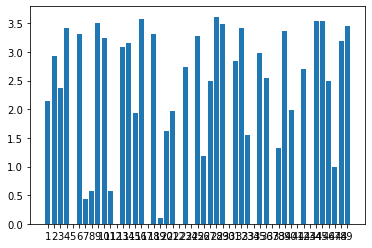

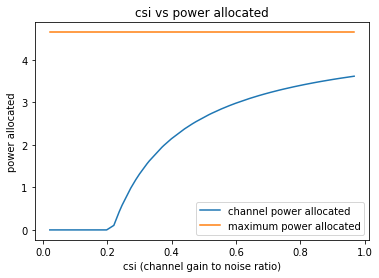

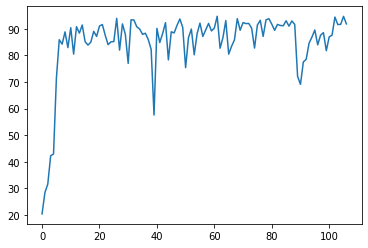

107
Power Allocated= 0
CSI= 0.19171256200498354
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12760526988210208
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5403628868518879
CSI= 0.23423706119453036
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.091205


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.081607
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.039031

Power Allocated= 3.0222180881517593
CSI= 0.5594956346453293
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.185222
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028033
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.151036

Power Allocated= 0
CSI= 0.15990891912681615
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.542546629448978
CSI= 0.789268784546299
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.432683
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008162
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000677

Power Allocated= 0
CSI= 0.16462408350698243
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.004619849873719661
SN

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5732, Accuracy: 8331/10000 (83%)

Power in training Round= 97.99462654930981



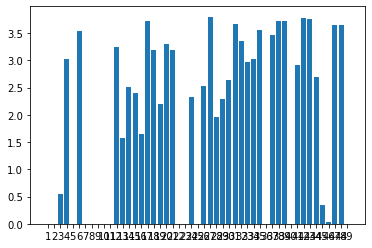

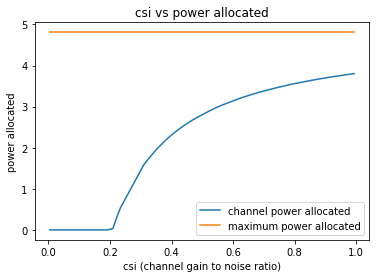

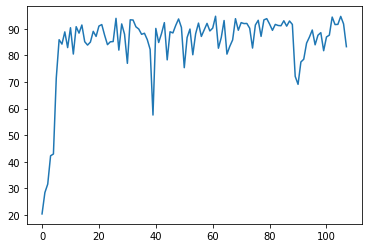

108
Power Allocated= 3.2214195475803833
CSI= 0.7664619901828631
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.216270957371128
CSI= 0.7634492676764473
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.404452


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030406
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 2.039124016173316
CSI= 0.40209221909439186
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.426196
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003891
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000211

Power Allocated= 3.5014245602814142
CSI= 0.9759038342582744
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.347561
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113568
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000010

Power Allocated= 0.899879593122952
CSI= 0.27576803439407627
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.274113
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.049791
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.386619

Power Allocated= 2.808655048878908
CSI= 0.582254974293189


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003271
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009928

Power Allocated= 3.2318877718538124
CSI= 0.7726614361329832
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.456925
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062194
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.022122

Power Allocated= 0
CSI= 0.16252570766766272
SNR= 19.996251205202647
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1380768913280304
CSI= 0.7204409579511449
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.653272
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.355187
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003315

Power Allocated= 1.0220253704663436
CSI= 0.2853807720463042
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.429423
Model client12 Train Epoch

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3750, Accuracy: 8714/10000 (87%)

Power in training Round= 98.00648208926438



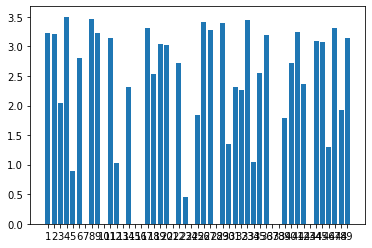

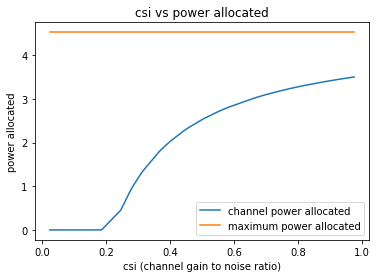

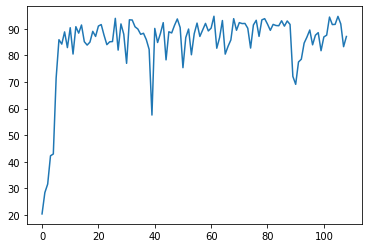

109
Power Allocated= 2.4855024378819186
CSI= 0.4109583328080296
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.870917


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.143518
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.065943

Power Allocated= 0
CSI= 0.08943019479486625
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.3816004015017072
CSI= 0.2827063904875051
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.839270


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000052
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007011

Power Allocated= 2.0028124197648425
CSI= 0.3429323840804972
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.568184
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026633
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007206

Power Allocated= 3.826132443062331
CSI= 0.9151586514724722
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.229155
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.221328
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.070510

Power Allocated= 0
CSI= 0.05249384599817042
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06614889243016042
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.029601575102531363
CSI= 0.2

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6182, Accuracy: 7831/10000 (78%)

Power in training Round= 97.99482348676756



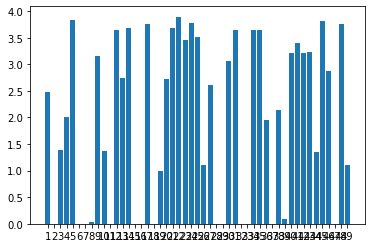

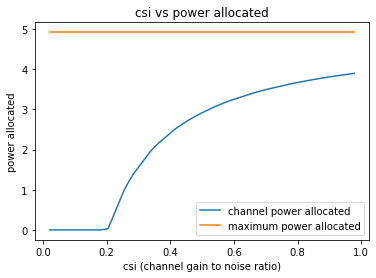

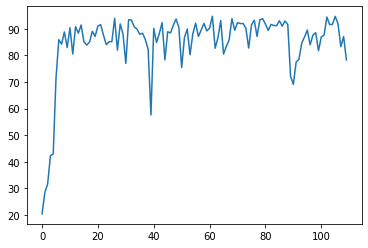

110
Power Allocated= 3.0672484220252247
CSI= 0.8825966454395059
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.963029


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.043040
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004027

Power Allocated= 0
CSI= 0.1817041224116821
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2226855637479441
CSI= 0.3358428345669441
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.865048


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.083724
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001635

Power Allocated= 2.92443630909919
CSI= 0.7838019439439263
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.610517
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.127465
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000002

Power Allocated= 3.196306680440882
CSI= 0.996053499809617
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.9949609374633726
CSI= 0.4534514247132101
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.000533
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.068607
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012627

Power Allocated= 2.8533192558495557
CSI= 0.7424182973814348
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.133413
Model client7 Train

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2621, Accuracy: 9194/10000 (92%)

Power in training Round= 98.00527493553612



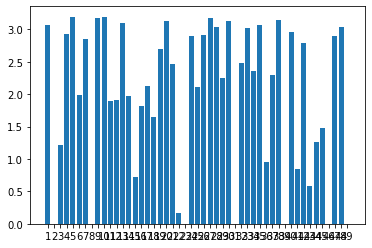

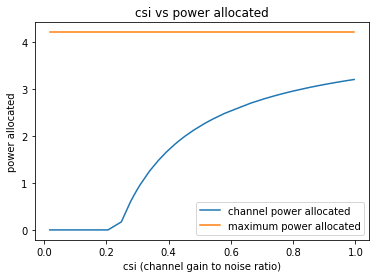

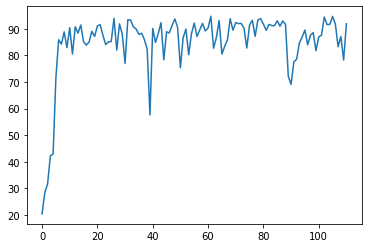

111
Power Allocated= 2.6225189964516584
CSI= 0.6471697723735577
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.009666085525934
CSI= 0.8635261597408314
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1554184561109104
CSI= 0.9878590759240828
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.960639


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000005
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001854

Power Allocated= 0.9449282869099056
CSI= 0.31029108557515694
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.544451
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.176681
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000019

Power Allocated= 2.851832002904479
CSI= 0.7599496844210952
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.410094
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.154980
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.107454

Power Allocated= 3.1612276779207793
CSI= 0.9935608159156784
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.866749
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000247
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000031

Power Allocated= 2.7302867769372225
CSI= 0.695690011281235

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client27 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.028893
Model client27 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023020

Power Allocated= 3.1248953752050355
CSI= 0.9589444995072158
SNR= 21.892401194648528
Client: client28
Model client28 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.437278
Model client28 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074744
Model client28 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.157400

Power Allocated= 0
CSI= 0.1345909237432149
SNR= 22.279074206291572
Client: client29
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.07423912142823141
SNR= 22.413286386353956
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2130731961044504
SNR= 22.759505313015037
Client: client31
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.017590059693754156
CSI= 0.24095697310284214
SNR= 23.441494264008885
Client: client32
Model client32 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.526556
Model 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2922, Accuracy: 9103/10000 (91%)

Power in training Round= 97.99535096997182



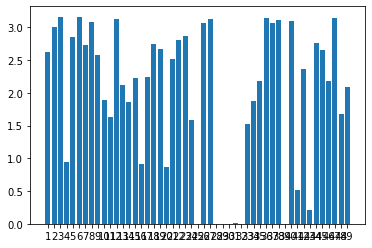

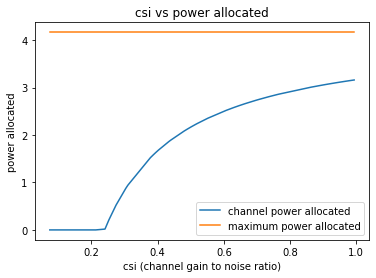

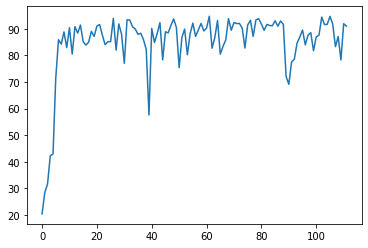

112
Power Allocated= 3.0672706995637213
CSI= 0.813914016245333
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2196464480016127
CSI= 0.9291476060777057
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.877222


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002922
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.049428

Power Allocated= 0.6865568555590689
CSI= 0.27705859107187103
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.651684
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002925
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000018

Power Allocated= 0
CSI= 0.15827273020767296
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4611121339134963
CSI= 0.5450216270896119
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.535607


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030753
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.204162

Power Allocated= 3.0178676501396313
CSI= 0.7824517605499108
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3605379235384985
CSI= 0.516698724609046
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.304307
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045040
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000007

Power Allocated= 1.9942430680893706
CSI= 0.43446929179303206
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.739105
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000068
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.9295036176951825
CSI= 0.7318511389913023
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.078191
Model client9 Tr

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1578, Accuracy: 9579/10000 (96%)

Power in training Round= 98.00564306146728



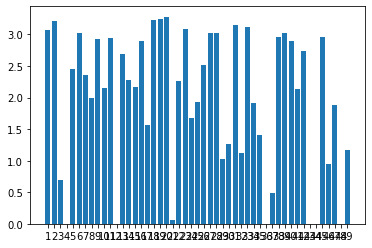

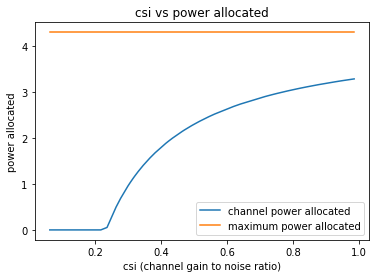

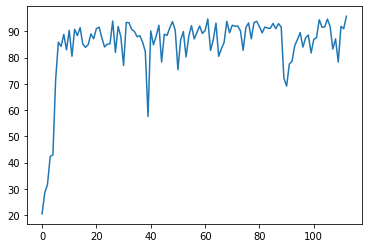

113
Power Allocated= 3.5337357209558835
CSI= 0.9788012545185384
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0978248988025525
CSI= 0.6860740140613829
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.519398


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034011
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001758

Power Allocated= 2.1301207498237216
CSI= 0.41232474346022474
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.432410
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069398
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000107

Power Allocated= 0.2808189738212361
CSI= 0.23394140721030532
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.352814
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001851
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 1.7987514800609952
CSI= 0.3627601848797526
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.343963
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.112881
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.216338

Power Allocated= 3.383946425981329
CSI= 0.85364499067866

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000002
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.4746282214468036
CSI= 0.4805923902004884
SNR= 20.466394740873444
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.606590
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.010158
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.022626

Power Allocated= 0
CSI= 0.1062655042873315
SNR= 20.54304442884906
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.498758156102439
CSI= 0.9464002168572585
SNR= 20.559061872099633
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.660384
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005311
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000160

Power Allocated= 0
CSI= 0.13347116321299546
SNR= 20.627161125173572
Client: client18
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1177905299

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3079, Accuracy: 9059/10000 (91%)

Power in training Round= 98.00154436497293



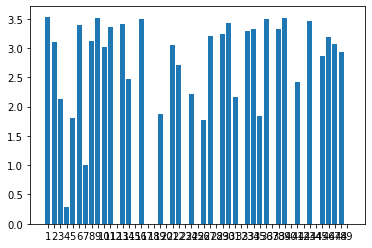

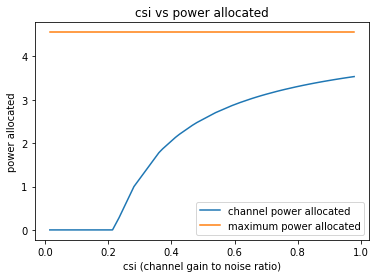

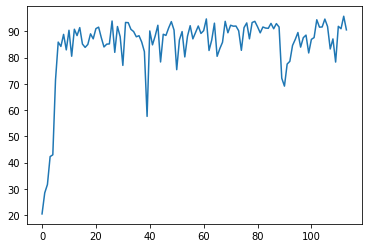

114
Power Allocated= 2.4556494420239323
CSI= 0.6374220294772918
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.774738


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.045437
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002323

Power Allocated= 0
CSI= 0.016576244790908246
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.726518188602157
CSI= 0.7704453576563794
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8464618481802937
CSI= 0.4591353635865001
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.220039


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005970
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.065217

Power Allocated= 2.9079097462858496
CSI= 0.8956087216630676
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.736226210762983
CSI= 0.7762513299490122
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.495565
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.142084
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000036

Power Allocated= 2.214829090260261
CSI= 0.5525961942191411
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.835589
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.050619
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.048386

Power Allocated= 2.988461740013246
CSI= 0.9652444152760482
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.727443
Model client8 Trai

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1843, Accuracy: 9523/10000 (95%)

Power in training Round= 98.00557078425163



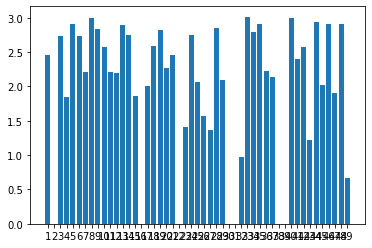

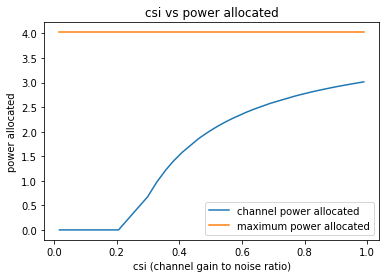

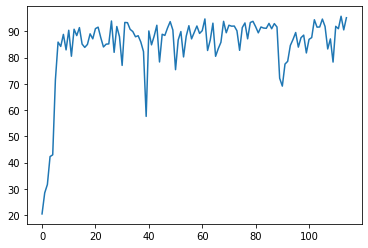

115
Power Allocated= 0
CSI= 0.06633821477615953
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11774110469782284
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.221755812239616
CSI= 0.3807356923634232
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.334001


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000035
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001432

Power Allocated= 3.7236823688400205
CSI= 0.8892308175123421
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.532449
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011084
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000124

Power Allocated= 3.510787936917402
CSI= 0.7476848807347009
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.765844
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109143
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.269268

Power Allocated= 3.8342144995364853
CSI= 0.9861589803257517
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.378157
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.188728
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.420884791337659
CSI= 0.7005916543152115


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3935, Accuracy: 8718/10000 (87%)

Power in training Round= 97.99549067236437



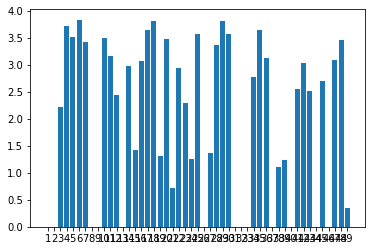

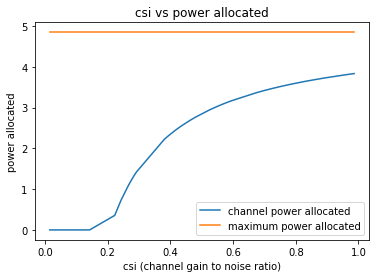

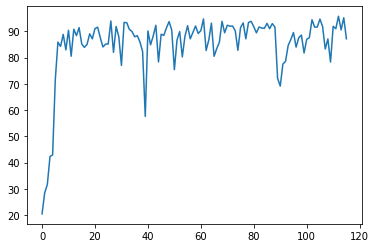

116
Power Allocated= 1.549528173440439
CSI= 0.3222307725297856
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.609075


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.106028
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.027152

Power Allocated= 3.118114026722688
CSI= 0.651559149956588
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.818062
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030262
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.018688

Power Allocated= 2.048169757648587
CSI= 0.3839177849611114
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.966040
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002252
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000012

Power Allocated= 2.0120210058657175
CSI= 0.37866264841413877
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.962967
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018384
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000002

Power Allocated= 3.601348965625532
CSI= 0.9509815291671962
S

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000797
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.12359543690196
CSI= 0.6538945099767358
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.645780
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009858
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000020

Power Allocated= 3.599123909006898
CSI= 0.9489735128430531
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.716894
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000005
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.1758525611050916
CSI= 0.6770290297046939
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.542105
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005679
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.601329461589204
CSI= 0.9509638

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.8122, Accuracy: 8114/10000 (81%)

Power in training Round= 98.006045331561



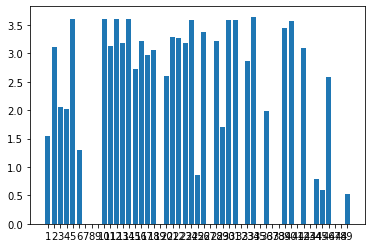

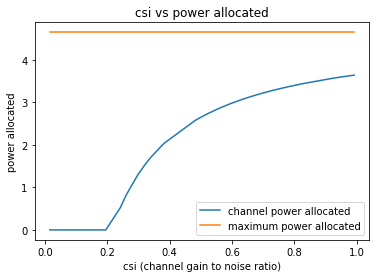

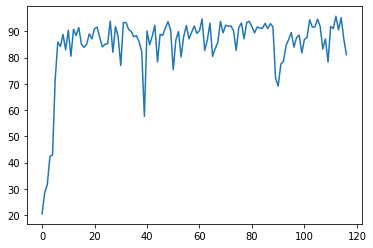

117
Power Allocated= 2.9642951981708774
CSI= 0.7402551290413018
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.156595


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.360001
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.024637

Power Allocated= 0
CSI= 0.13389400467340062
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.067095619807962
CSI= 0.801227360922359
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.567468


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002262
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000671

Power Allocated= 2.8527379238694337
CSI= 0.6837873890097051
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.004534
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.162179
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.529465

Power Allocated= 0
CSI= 0.04733944551999225
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.046602111999167
CSI= 0.788283773540396
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0529841943568874
CSI= 0.7922695962856627
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.469810
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.049953
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.499162

Power Allocated= 3.184175408829

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4716, Accuracy: 8262/10000 (83%)

Power in training Round= 98.00158808940505



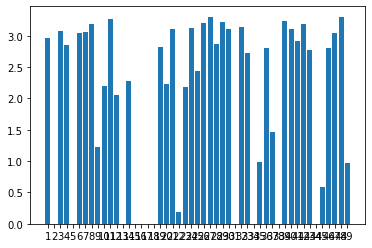

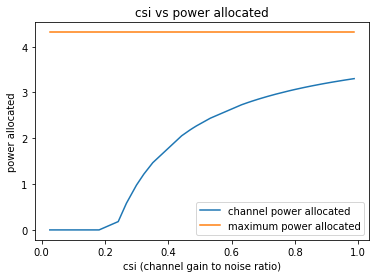

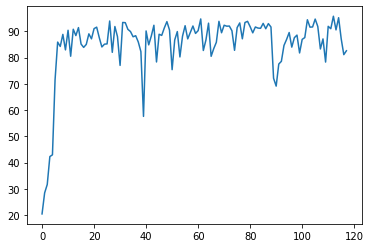

118
Power Allocated= 1.8282143107292352
CSI= 0.4601114796822474
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.787619


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.050051
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.372514

Power Allocated= 2.6956160528095445
CSI= 0.7657058204299421
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.975142
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020069
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008200

Power Allocated= 2.6897013310785907
CSI= 0.7622536219083553
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3175618471770685
CSI= 0.5938105488480745
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.207515
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.091626
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000447

Power Allocated= 2.5302307445164214
CSI= 0.6796387522234524
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.237622
Model client5 T

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021590
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000301

Power Allocated= 0.577467385750221
CSI= 0.29204470903226054
SNR= 20.54304442884906
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.834750
Model client16 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006202
Model client16 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000015

Power Allocated= 2.130394319268355
CSI= 0.5344146119984634
SNR= 20.559061872099633
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.378377
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025694
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.040287

Power Allocated= 2.69273165459438
CSI= 0.764018408988474
SNR= 20.627161125173572
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.758967
Model client18 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.176620
Model client18 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.125258

Power Allocated= 0
CSI= 0.1801842021949478
SNR= 2

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4060, Accuracy: 8555/10000 (86%)

Power in training Round= 97.99450143611425



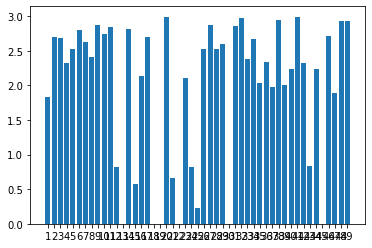

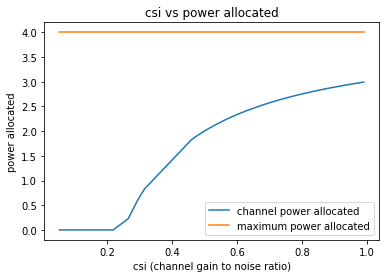

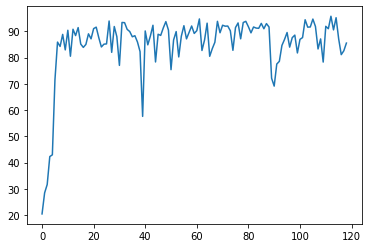

119
Power Allocated= 3.1696811409974694
CSI= 0.7560397128755976
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.324093


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.148608
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.427306

Power Allocated= 2.0341371484907267
CSI= 0.4067974496038673
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.691558
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.333341
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.128073

Power Allocated= 3.2496547150617774
CSI= 0.8046940910080962
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.265574
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000267
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000149

Power Allocated= 0
CSI= 0.11345733975538519
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16785264521824939
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12419977945031313
S

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006959
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.3144799940133325
CSI= 0.848980764142132
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.424712
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000021
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 3.479716275764092
CSI= 0.9875112345936206
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.48221138452629475
CSI= 0.2493671312571344
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.229086
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.1862293533825703
SNR= 20.095472826104007
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.42070646

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4799, Accuracy: 8322/10000 (83%)

Power in training Round= 97.99725729640538



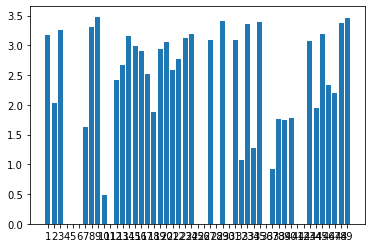

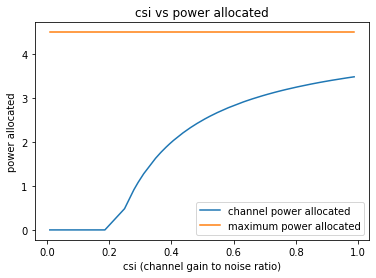

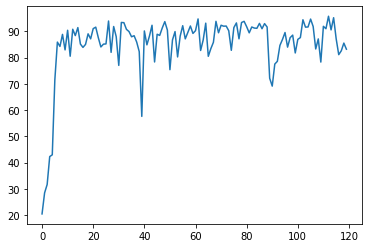

120
Power Allocated= 1.9775923370153126
CSI= 0.4176789327362481
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.144392


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053203
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.010002

Power Allocated= 0
CSI= 0.2199131189276028
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.723744812878059
CSI= 0.27412047740988477
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.249166


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.673198
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.020554

Power Allocated= 3.2572599515827614
CSI= 0.897250575359109
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0453182421444476
CSI= 0.7538876630584301
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.249740
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.273340
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.084226

Power Allocated= 3.1935358905661797
CSI= 0.8487235740164181
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.957794
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.019062
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.038107

Power Allocated= 3.2795266644981647
CSI= 0.9155420255830488
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.615325
Model client7 Tr

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6322, Accuracy: 7642/10000 (76%)

Power in training Round= 98.00185359181009



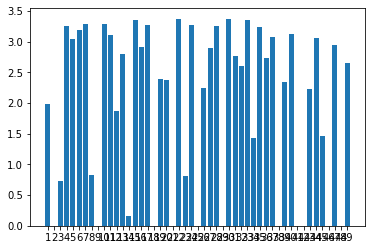

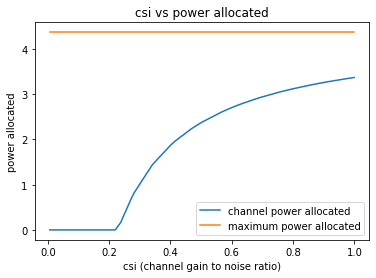

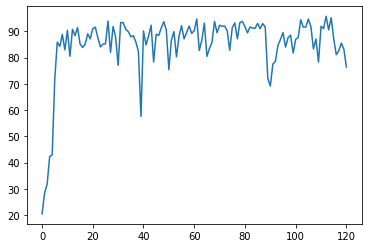

121
Power Allocated= 0
CSI= 0.11278141210912052
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7701306664036469
CSI= 0.24673901216795668
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.787983


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000023
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 3.215904841413723
CSI= 0.622242221025871
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.591932
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003894
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.077618

Power Allocated= 2.9070090760715788
CSI= 0.521924217722812
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.091191
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032929
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.033424

Power Allocated= 1.7986230867539166
CSI= 0.3306470510609435
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.646517
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.249539
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.155655

Power Allocated= 0
CSI= 0.15020457084889793
SNR= 18.596146162

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6415, Accuracy: 7728/10000 (77%)

Power in training Round= 97.99925830403856



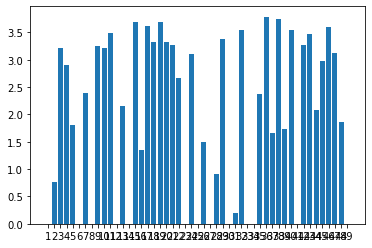

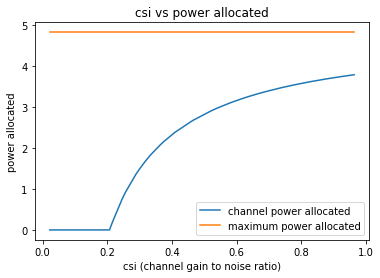

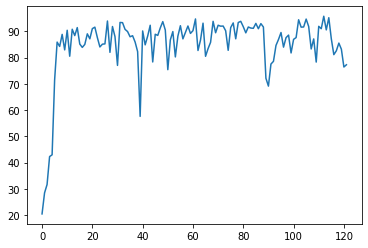

122
Power Allocated= 0
CSI= 0.08170978314929522
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.19519536272703442
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.347415754780199
CSI= 0.7739373124485424
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.492506


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000334
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003517

Power Allocated= 3.420860002289779
CSI= 0.8205801060970211
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.266617
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.124732
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008956

Power Allocated= 3.036990042586412
CSI= 0.6240171631589413
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.874776
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.088371
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.101808

Power Allocated= 0
CSI= 0.08074579821609662
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.06640516034280242
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6590312807230196
CSI= 0.3355

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6791, Accuracy: 7903/10000 (79%)

Power in training Round= 98.00191250306099



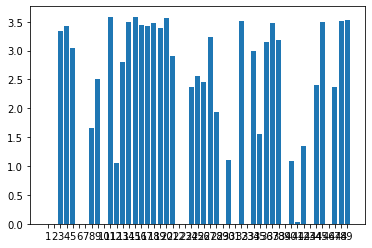

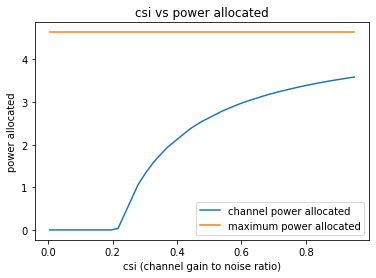

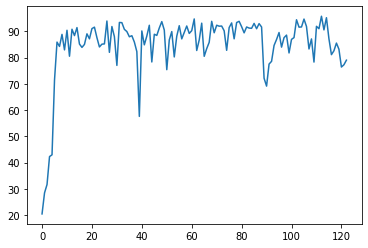

123
Power Allocated= 1.0421199396517515
CSI= 0.2718226287509351
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.177996


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.058312
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.162500

Power Allocated= 0.39114024174842754
CSI= 0.23095492149360575
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.958502
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032139
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.098522

Power Allocated= 3.028970166197202
CSI= 0.5910097884548289
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18203247248628496
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.713460549940119
CSI= 0.9925272923244011
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11242199029924194
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round



/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.066006
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.074105

Power Allocated= 3.2135480900519244
CSI= 0.6633756911073296
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.466995
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.063150
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000009

Power Allocated= 1.7547370244589011
CSI= 0.3371257172827553
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.390572
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.041299
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.048395

Power Allocated= 2.7025501596854444
CSI= 0.4954322730506139
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.583704
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001048
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.025533

Power Allocated= 2.786610284193597
CSI= 0.5169617114357

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.7763, Accuracy: 7639/10000 (76%)

Power in training Round= 97.99313058223274



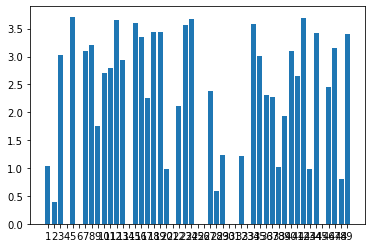

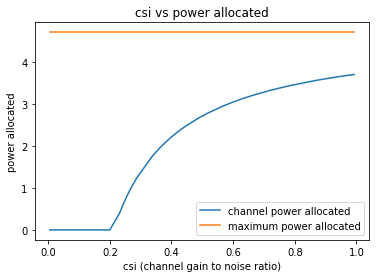

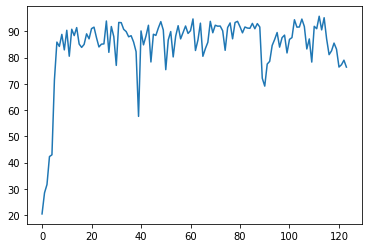

124
Power Allocated= 0
CSI= 0.07093592400436366
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.30784947868093
CSI= 0.9099264398696012
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0444710488997346
CSI= 0.734015869019123
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.060924


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013481
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.340888225746358
CSI= 0.9381292598528245
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.822729
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.217342
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.109970

Power Allocated= 0
CSI= 0.046140558265393095
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.01666197922816881
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.937780003164166
CSI= 0.6807076637597903
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7526201157852261
CSI= 0.3767586199006566
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.148404
Mod

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.8335, Accuracy: 7039/10000 (70%)

Power in training Round= 98.00031664918446



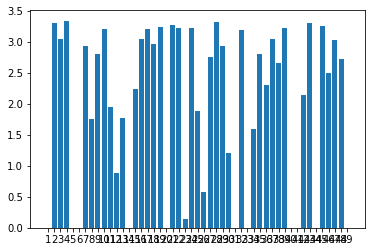

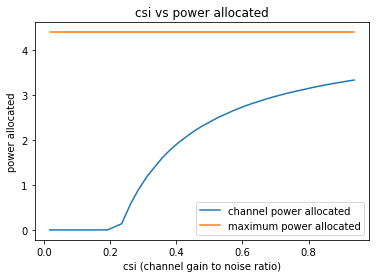

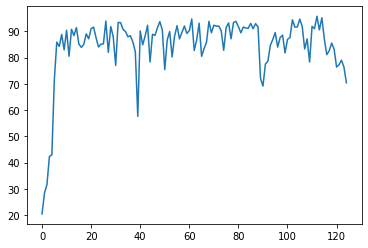

125
Power Allocated= 3.279210519106112
CSI= 0.7321165050269489
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.629532


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039543
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.205653

Power Allocated= 2.812912165464956
CSI= 0.5457915940020922
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.968283
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015151
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.383188

Power Allocated= 0
CSI= 0.11705777416495311
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.47528677961583
CSI= 0.8548275729155121
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.610867


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.143961
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002609

Power Allocated= 2.8877968650372203
CSI= 0.5690494648013555
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.304748
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.122008
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.084855

Power Allocated= 1.8341623648719834
CSI= 0.3557514907146304
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.433168
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.210016
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006359

Power Allocated= 0.20179037214735196
CSI= 0.22505678904338322
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.231365
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003269
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000009

Power Allocated= 3.621889905076677
CSI= 0.97730365150055

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6077, Accuracy: 8091/10000 (81%)

Power in training Round= 98.00828301866021



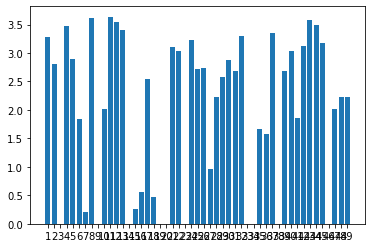

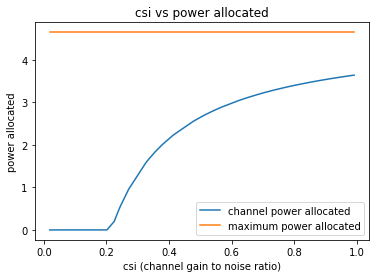

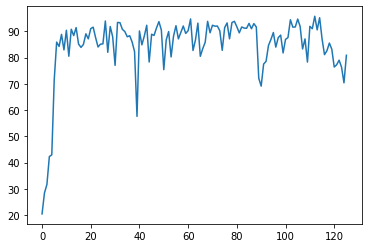

126
Power Allocated= 1.5813229220432392
CSI= 0.352702825844622
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.688379


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.136147
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.089401

Power Allocated= 0
CSI= 0.12211921656476155
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5878560615830688
CSI= 0.3535174207573081
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.353599


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002389
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.1708081671156005
CSI= 0.8027210270174734
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.040048
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009318
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.461346

Power Allocated= 3.2462060353336124
CSI= 0.8544343449715727
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.879254
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.199109
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.171272

Power Allocated= 3.3143619377994327
CSI= 0.9072689180435132
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.453267
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027501
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002028

Power Allocated= 2.076712760286221
CSI= 0.4273763230663138

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2751, Accuracy: 9329/10000 (93%)

Power in training Round= 98.00437165832317



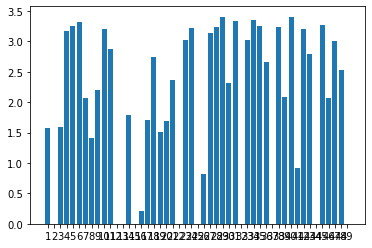

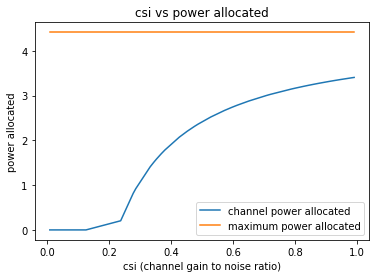

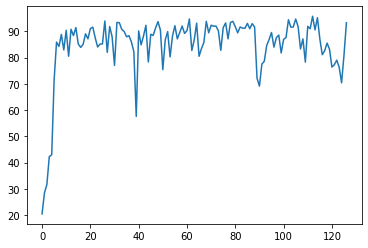

127
Power Allocated= 3.026314557420749
CSI= 0.6759461866636101
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.943321


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048336
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.153249

Power Allocated= 2.8420027744269096
CSI= 0.6010628620364404
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.021717082202534432
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8070693348408726
CSI= 0.3705552455373453
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.346057


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.059660
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.018362

Power Allocated= 2.390912586199024
CSI= 0.4728557888428655
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.047316
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.224843
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.151874

Power Allocated= 3.0686979226864537
CSI= 0.6958824349513385
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.492422
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011157
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.041926

Power Allocated= 2.7092505809644294
CSI= 0.5566466800548424
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.556307
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.195898
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.045621

Power Allocated= 1.4354593484666505
CSI= 0.3257050052203831

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4130, Accuracy: 8565/10000 (86%)

Power in training Round= 98.00564196010325



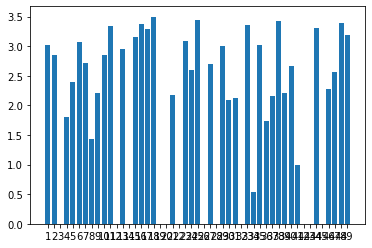

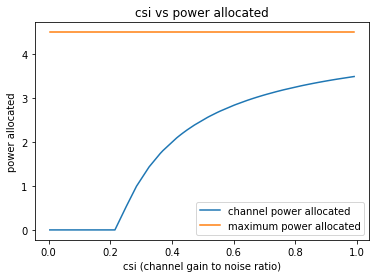

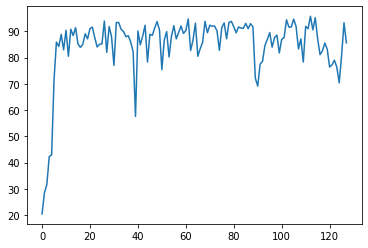

128
Power Allocated= 2.800443362695391
CSI= 0.5329389253773719
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.950644


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040279
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.024202

Power Allocated= 2.8596428351045815
CSI= 0.5503007507386808
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.485053
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.033352
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006630

Power Allocated= 3.422034655962155
CSI= 0.7969420864391794
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.611575986732598
CSI= 0.93874237337566
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.548015
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.085838
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 1.7623154960478207
CSI= 0.34311020330359454
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.489189
Model client5 Trai

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006474
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 2.4197969293221315
CSI= 0.44305933266583175
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.377518
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.048617
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.182600

Power Allocated= 0
CSI= 0.0552042729365152
SNR= 19.996251205202647
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4272405237079555
CSI= 0.44452535682724215
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.164653
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.111673
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.370464

Power Allocated= 0
CSI= 0.13984091450980973
SNR= 20.18554291572515
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.518958524538397
CSI= 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.7360, Accuracy: 7451/10000 (75%)

Power in training Round= 98.00109956151996



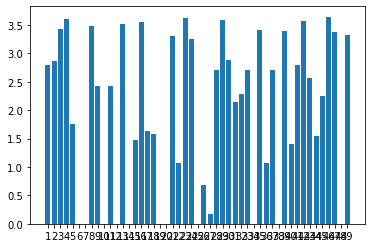

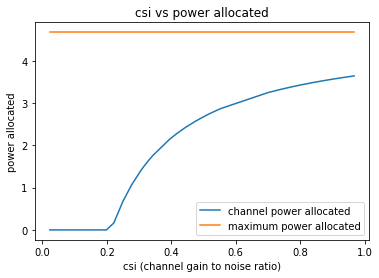

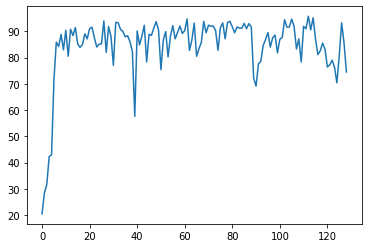

129
Power Allocated= 0
CSI= 0.1801639550819184
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13619049899058733
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.873336244958275
CSI= 0.6447241351594052
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8056993273613675
CSI= 0.6177843196847991
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.230456


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.579526
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000006

Power Allocated= 1.4103085864643061
CSI= 0.33177634720186167
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.667951
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.261385
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.101199

Power Allocated= 2.7599704159963676
CSI= 0.6008110445476041
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.555272
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001291
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.092638

Power Allocated= 2.826802493547966
CSI= 0.6259448916598421
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.550937
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030237
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.024151

Power Allocated= 0
CSI= 0.001407405446985699
SNR= 19.24089

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5321, Accuracy: 8188/10000 (82%)

Power in training Round= 97.99297071584486



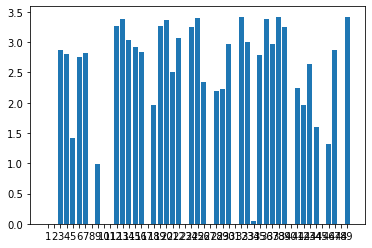

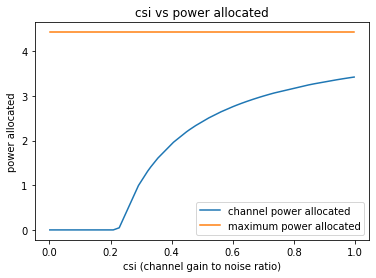

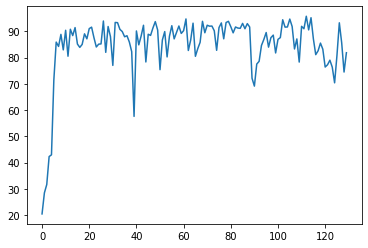

130
Power Allocated= 2.7229801062897963
CSI= 0.6236738461089044
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7068198558203047
CSI= 0.3817431457629691
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.605660


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037782
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.151528

Power Allocated= 2.3312674749899402
CSI= 0.5012242894096025
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.701640
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.035439
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004755

Power Allocated= 3.01493315248689
CSI= 0.7625152815138986
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.286267
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015670
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.813719

Power Allocated= 3.1331532484929836
CSI= 0.8380620772014884
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.655023654754804
CSI= 0.5983156369978183
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.179612
Model client6 Trai

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.043127
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.031951

Power Allocated= 2.1344470686369283
CSI= 0.4562178641088208
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.219868
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044687
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.205889

Power Allocated= 3.1437924644895947
CSI= 0.845601735794406
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.999000
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003232
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000421

Power Allocated= 1.9100786931413838
CSI= 0.41385528118036075
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.285568
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.069132
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.012275

Power Allocated= 0
CSI= 0.2043380347513225
SNR

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3023, Accuracy: 9217/10000 (92%)

Power in training Round= 97.99500975059698



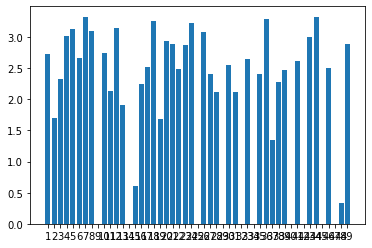

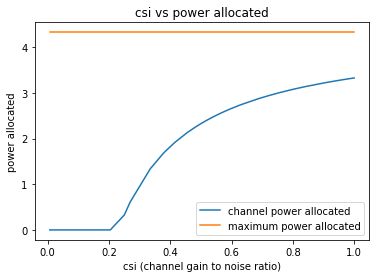

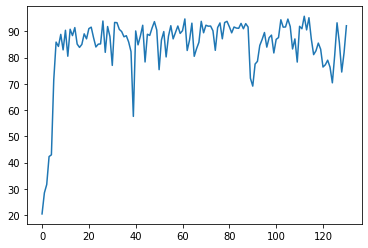

131
Power Allocated= 3.3681287827138977
CSI= 0.7894836970736712
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.669978


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.090263
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.083598

Power Allocated= 0
CSI= 0.06247749095001842
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8476340339314734
CSI= 0.5595515774253875
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.161174


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004969
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000410

Power Allocated= 3.3121753903337314
CSI= 0.7560842129689088
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.788923
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.105596
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.062055

Power Allocated= 2.396008924716929
CSI= 0.44667375149132127
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.971077
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.088722
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.226831

Power Allocated= 3.168638046476791
CSI= 0.6820624820163359
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.267213
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.039901
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028010

Power Allocated= 0
CSI= 0.05319984398285793
SNR= 18.9205813

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3513, Accuracy: 9160/10000 (92%)

Power in training Round= 98.00430939481527



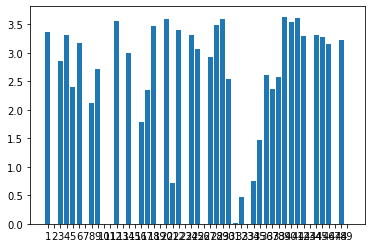

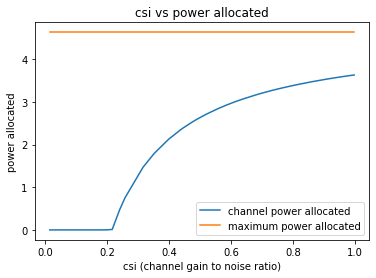

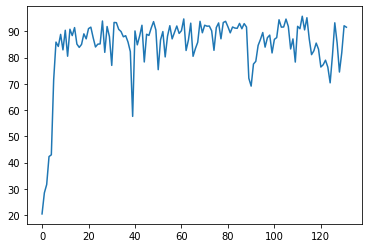

132
Power Allocated= 2.5755766957380937
CSI= 0.4896964852369934
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4134500423215686
CSI= 0.8304214042247402
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.765350


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.059815
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000461

Power Allocated= 3.154513874513162
CSI= 0.6834597047489166
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11772787112500449
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4298922641038074
CSI= 0.457087346408267
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.860080


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.122851
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.092256

Power Allocated= 2.9391199200392695
CSI= 0.5957565439085247
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.132418
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025667
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014190

Power Allocated= 2.5865328113561636
CSI= 0.49233796274957053
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.937193
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000001
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.152654

Power Allocated= 1.1490870009272505
CSI= 0.2883031721728646
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.162037
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000268
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.559540

Power Allocated= 2.4329056895969967
CSI= 0.45771780630237

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4088, Accuracy: 8642/10000 (86%)

Power in training Round= 97.9918864931801



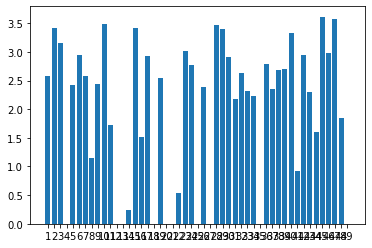

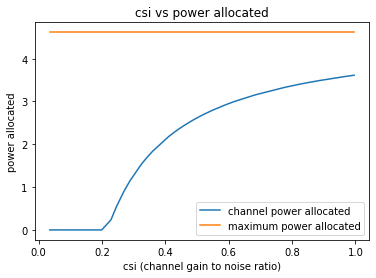

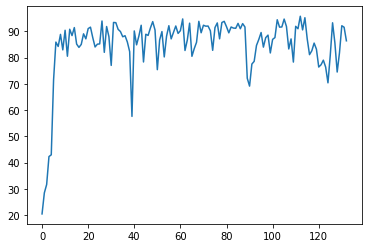

133
Power Allocated= 3.2164645025786824
CSI= 0.8693023671934899
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.753731


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021597
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.007115

Power Allocated= 2.947960800313565
CSI= 0.7047954289920006
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.825541
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000015
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.139004

Power Allocated= 3.0303923889675106
CSI= 0.7482678507798547
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.244744
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024317
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.161631

Power Allocated= 2.7949573293313072
CSI= 0.6361910386484512
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.560906
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002082
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001817

Power Allocated= 0
CSI= 0.1499912177137135
SNR= 18.42900477

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000825
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001204

Power Allocated= 3.2137500355216844
CSI= 0.8672559098075797
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.867524
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001192
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.094894613583959
CSI= 0.44015680589030826
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.109606
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000020
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012208

Power Allocated= 3.094908405319016
CSI= 0.7862229697680053
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.681285
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.033753
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.061374

Power Allocated= 2.9660052593306814
CSI= 0.7138742332289465


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3707, Accuracy: 8705/10000 (87%)

Power in training Round= 97.99562270592018



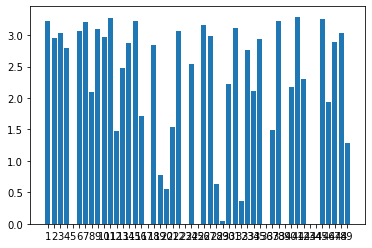

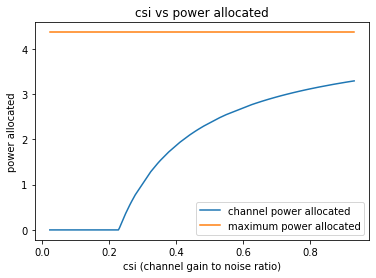

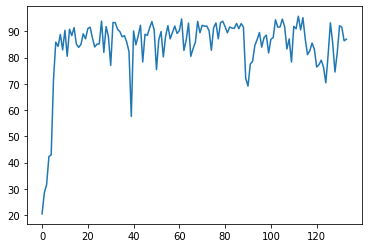

134
Power Allocated= 0
CSI= 0.0426523551167769
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1417945408847157
CSI= 0.7277483238367732
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.874483412961382
CSI= 0.6092313633200983
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.511727


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.249324
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000068

Power Allocated= 3.4704892618929337
CSI= 0.9565655240032017
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.600280
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007739
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.044206

Power Allocated= 1.2862291593248503
CSI= 0.3096294644771955
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.740098
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024499
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.107528

Power Allocated= 3.408995297303247
CSI= 0.9034234410910913
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.390615
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020715
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.14184626271257617
SNR= 18.9205813

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2893, Accuracy: 9188/10000 (92%)

Power in training Round= 98.00191682413123



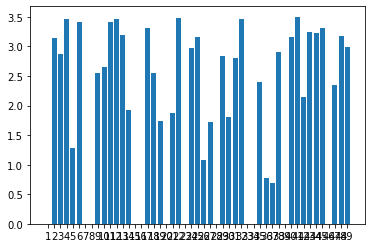

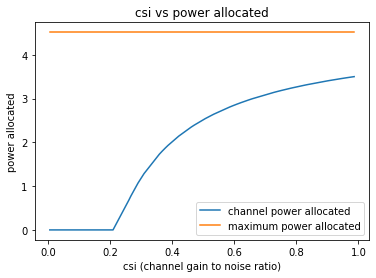

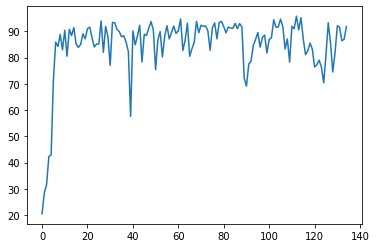

135
Power Allocated= 2.9119936259061805
CSI= 0.618118602120998
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.340010


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.059037
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000256

Power Allocated= 0
CSI= 0.10099270261828908
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7073871365648903
CSI= 0.5487212362968961
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.318550


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000047
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.084518

Power Allocated= 0
CSI= 0.12041458777177283
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.973344586278594
CSI= 0.3911656737752579
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.835716
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.083453
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.165949

Power Allocated= 2.9846767871920803
CSI= 0.6471950120841387
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.246278
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.055065
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000053

Power Allocated= 2.0519721178488224
CSI= 0.4035782854691402
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.489640
Model client7 Train Epoch: 2 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3015, Accuracy: 9211/10000 (92%)

Power in training Round= 98.00569180170928



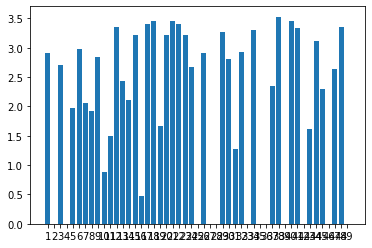

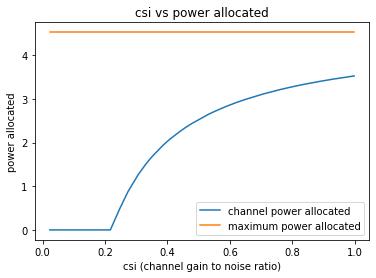

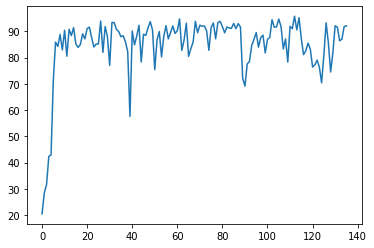

136
Power Allocated= 0
CSI= 0.07038356129760548
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.01817359344830105
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.703165130667877
CSI= 0.67174847007147
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.337945


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000344
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.034268

Power Allocated= 1.3371335747530586
CSI= 0.35030146977019805
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.115099
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013219
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.005686

Power Allocated= 1.9745953715547313
CSI= 0.45101478767180014
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.525138
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057687
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.055479

Power Allocated= 3.133295011942029
CSI= 0.9447129779180392
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.640472
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008890
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.017811

Power Allocated= 2.7593203667338493
CSI= 0.69808164110490

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2974, Accuracy: 9148/10000 (91%)

Power in training Round= 98.00252485207552



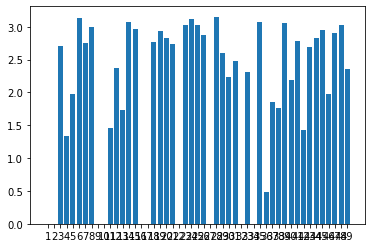

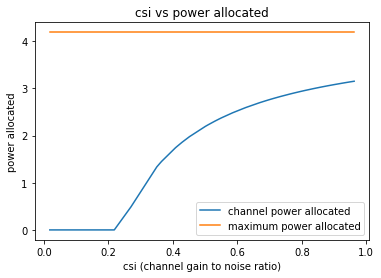

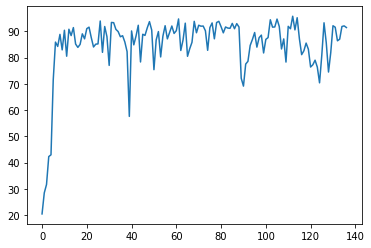

137
Power Allocated= 2.017868008919881
CSI= 0.42689974648995654
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.623376462744149
CSI= 0.5757178670875078
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0846507675088892
CSI= 0.7838909809240463
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.762862


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002294
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.242615

Power Allocated= 2.8800172111065283
CSI= 0.6755290899022781
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.329397
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.047862
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.060425

Power Allocated= 2.3683918992675603
CSI= 0.5020215244635976
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.680469
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.125059
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.143652

Power Allocated= 0
CSI= 0.02059460621248177
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.028153241665249018
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5237764475538222
CSI= 0.5

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.136833
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008370

Power Allocated= 0
CSI= 0.13624717365494465
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.2116154173285546
SNR= 19.996251205202647
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.170693756372948
CSI= 0.8405871762488192
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.341765
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079575
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.187081

Power Allocated= 1.9718672636938392
CSI= 0.4186778733062463
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.130210
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.126845
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006724

Power Allocated= 2.7378083057025098
CSI=

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5886, Accuracy: 8481/10000 (85%)

Power in training Round= 97.99315978981684



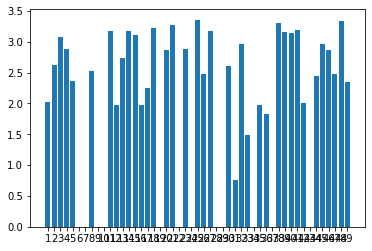

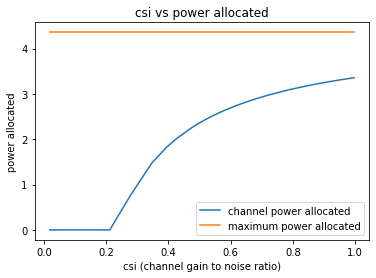

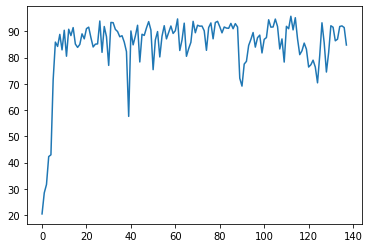

138
Power Allocated= 0.9590537772608378
CSI= 0.28499591731001317
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.743647


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.261443
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.136376

Power Allocated= 0
CSI= 0.13974445894369214
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08575783686307448
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.017700216466962
CSI= 0.689571589062709
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.193940


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.067614
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001629

Power Allocated= 3.2872379927247315
CSI= 0.8469996880959406
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.640775
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.172532
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.076762

Power Allocated= 1.553215740171264
CSI= 0.34309316371113985
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.147263
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044798
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000016

Power Allocated= 2.167488578336801
CSI= 0.43470938975648443
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.801347
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032065
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.392238

Power Allocated= 3.37561223708631
CSI= 0.9155298013218441


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4188, Accuracy: 8700/10000 (87%)

Power in training Round= 98.00682543314653



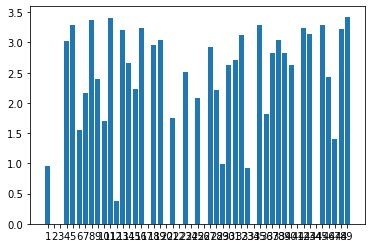

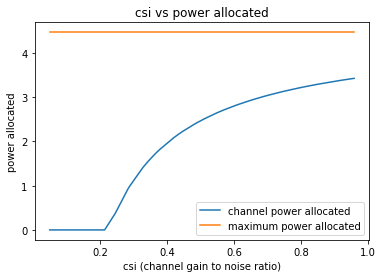

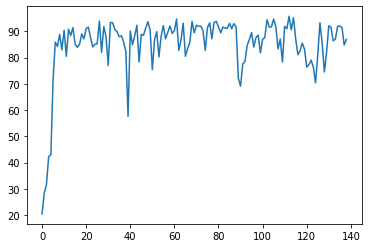

139
Power Allocated= 3.4202201260317024
CSI= 0.8092534120023461
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.084113


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027916
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.063262

Power Allocated= 3.1622645343662015
CSI= 0.6694953018582938
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.212981
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.113545
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000005

Power Allocated= 1.5335797717178998
CSI= 0.3202718751209198
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.910189
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011313
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.095127

Power Allocated= 3.2498748313173493
CSI= 0.7112111668279573
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.376054
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002838
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023742

Power Allocated= 3.4777794184620667
CSI= 0.848790100543537

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000175
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000066

Power Allocated= 0
CSI= 0.1256159996737516
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6294751645163084
CSI= 0.49347336310934864
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.672921
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007345
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.237083272265287
CSI= 0.41342067309851094
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.623047
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016481
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.013882

Power Allocated= 1.5527534769620233
CSI= 0.32225075206599796
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.180326
Model client12 Train E

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2081, Accuracy: 9493/10000 (95%)

Power in training Round= 98.00181924453838



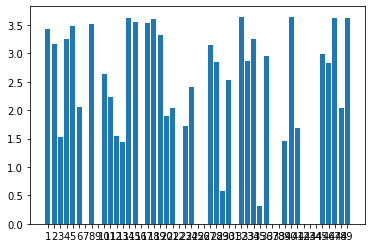

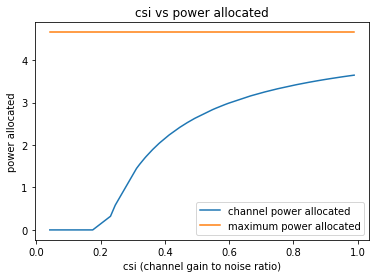

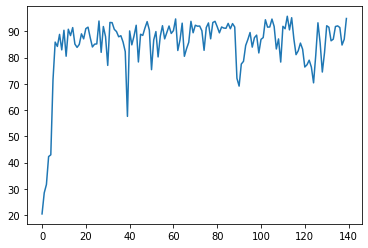

140
Power Allocated= 0.6807856922514661
CSI= 0.21053230378517718
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.012261


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.100833
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003447

Power Allocated= 3.194526101844937
CSI= 0.44720229326633465
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.335411
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015455
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.6232943587875948
CSI= 0.5532943542929578
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.188011
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016790
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001453

Power Allocated= 3.704017526846213
CSI= 0.5791618498543393
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.307250
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.092241
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000076

Power Allocated= 3.0881342651697077
CSI= 0.4268913682997809

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007017
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.371549

Power Allocated= 1.1912843524665817
CSI= 0.2358843146620807
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.592902
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.127570
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.017289

Power Allocated= 0
CSI= 0.02070784843272666
SNR= 19.996251205202647
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6614063751101922
CSI= 0.2653051759115749
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.407966
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034011
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.048173

Power Allocated= 4.360088928980137
CSI= 0.9340891184485648
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.343938
Model client12 Train Epoch:

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3666, Accuracy: 8987/10000 (90%)

Power in training Round= 98.00722441767489



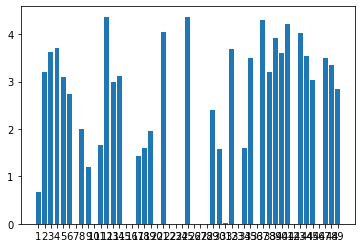

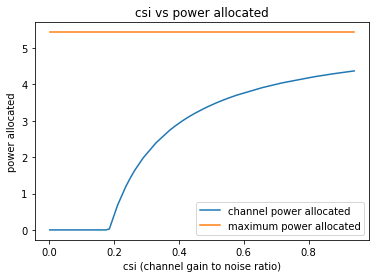

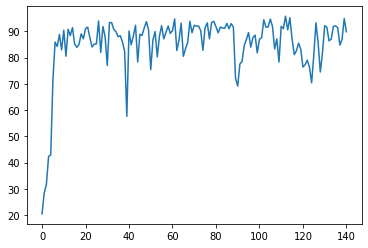

141
Power Allocated= 2.9022309678836518
CSI= 0.9347490109182479
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8058004332884137
CSI= 0.8574590680457391
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.368589


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011275
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000142

Power Allocated= 0
CSI= 0.020430395466417894
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.085420527483424
CSI= 0.530049476673262
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.398300


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016166
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.034734

Power Allocated= 1.9716491792018216
CSI= 0.4999030984582834
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.117247
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.106468
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.271592

Power Allocated= 2.8513794009850026
CSI= 0.8923333276436991
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.550062
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109877
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.070538

Power Allocated= 1.7275464022004736
CSI= 0.4455354204341322
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.947436
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.158345
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.263781

Power Allocated= 1.8217368517520431
CSI= 0.465051386285903

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4403, Accuracy: 8837/10000 (88%)

Power in training Round= 97.99602154331514



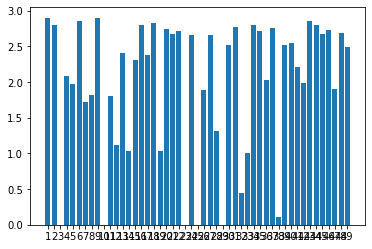

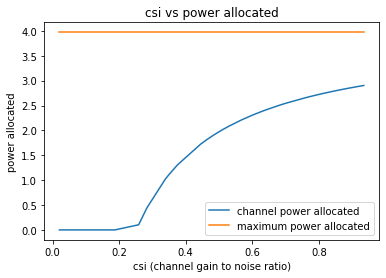

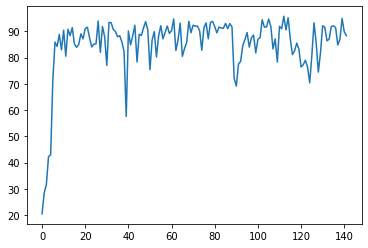

142
Power Allocated= 3.3048037805744555
CSI= 0.9450027626473443
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.004051575179381
CSI= 0.735862154521824
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.540591


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073746
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.112076

Power Allocated= 0
CSI= 0.11193282527354254
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6154191360974375
CSI= 0.5722190154506556
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.053279


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.102114
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000007

Power Allocated= 2.9807695760454003
CSI= 0.7234674624964093
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.452384
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.210587
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.083241

Power Allocated= 0
CSI= 0.22110326014208803
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11231629498256679
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9377691953417466
CSI= 0.7016398833289804
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.372450
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.312737
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000005

Power Allocated= 2.847620869129303
CSI= 0.659

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5083, Accuracy: 8675/10000 (87%)

Power in training Round= 98.00711461309464



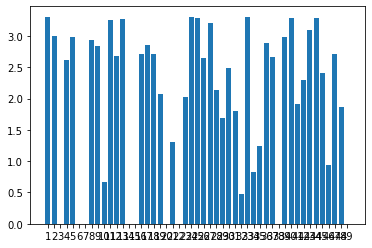

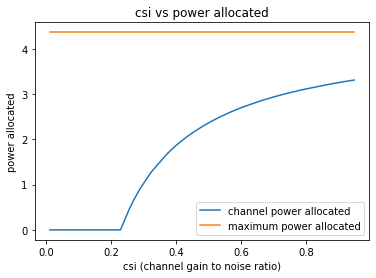

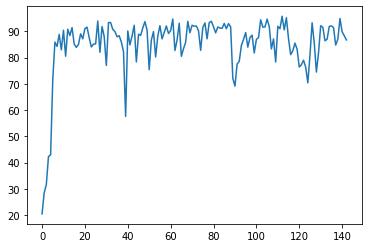

143
Power Allocated= 3.3113905962234513
CSI= 0.7014094256026457
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.618655665558008
CSI= 0.47204641213909126
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.468506


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.277374
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.030366

Power Allocated= 3.702772939470618
CSI= 0.9668201943156935
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.554217
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011619
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 0
CSI= 0.012195270728049268
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1366554374589413
CSI= 0.6248297384239816
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.207326


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.116748
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.218731

Power Allocated= 0.7010877874681753
CSI= 0.2477698460146215
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.616311
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.073870
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.383163000220413
CSI= 0.7385914802135962
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.465608
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.125484
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.151643

Power Allocated= 3.153378341909969
CSI= 0.631427504218611
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.466001
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000006
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.621911109349007
CSI= 0.8967159706730524
SN

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2635, Accuracy: 9438/10000 (94%)

Power in training Round= 97.99354109422656



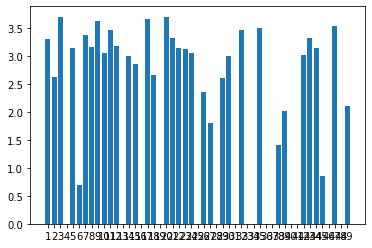

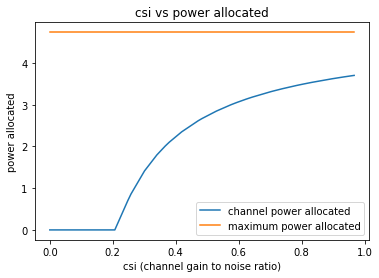

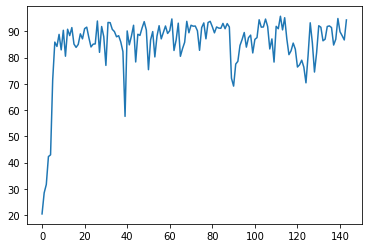

144
Power Allocated= 3.068057460675085
CSI= 0.6550134736443498
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.470385


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.116105
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.089655

Power Allocated= 0
CSI= 0.17116560700157268
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4582258110760233
CSI= 0.46805133051355896
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.408839


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057325
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 2.700955060636262
CSI= 0.5280420554817832
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.459960
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001622
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006739

Power Allocated= 2.2833341934123514
CSI= 0.4326364647443912
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.690109
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.190911
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.087106

Power Allocated= 3.1941802083266575
CSI= 0.7139983783984479
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.439047
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003734
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001229

Power Allocated= 2.025746429755942
CSI= 0.3892569467973571


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3078, Accuracy: 9034/10000 (90%)

Power in training Round= 98.00370212508302



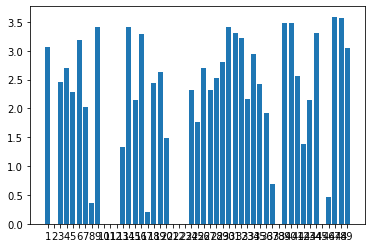

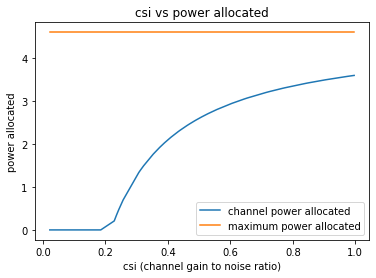

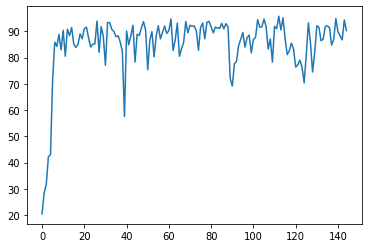

145
Power Allocated= 1.104112704667402
CSI= 0.2946104396545256
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.695256


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001535
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002947

Power Allocated= 3.10173662813738
CSI= 0.7159790441448003
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.0412759738695605
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1020343769744757
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1913477090561195
CSI= 0.7650653755011178
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.234532


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.145989
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.036394

Power Allocated= 0
CSI= 0.09927835484832459
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.096836090868617
CSI= 0.7134756848593989
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.279357
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.122768
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.073582

Power Allocated= 2.8491473637414257
CSI= 0.6063258507209842
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.933143
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000006

Power Allocated= 1.3624944537396217
CSI= 0.3188845573983681
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.346863
Model client9 Train Epoch: 2 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2288, Accuracy: 9387/10000 (94%)

Power in training Round= 97.9952463158889



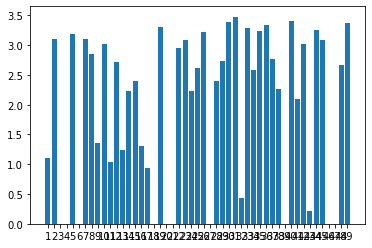

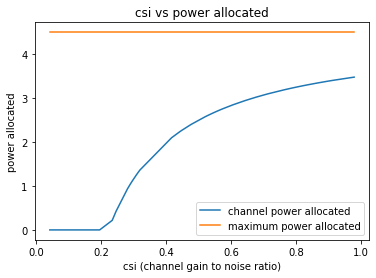

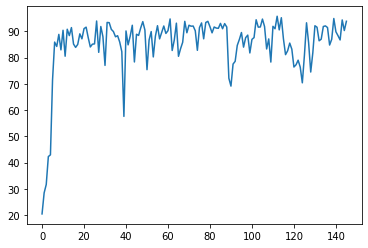

146
Power Allocated= 1.9000978860731794
CSI= 0.4192649459247255
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1042073268500623
CSI= 0.8467277055599269
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.254789


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003944
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.027750

Power Allocated= 0
CSI= 0.006402800607440473
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15996939409223698
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.343666824281537
CSI= 0.5150503582428119
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.155966


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.177369
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.107077

Power Allocated= 1.465585250489343
CSI= 0.3546552928507315
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.426395
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026771
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.2441355994006056
CSI= 0.9605327224830719
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.465280
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.228517
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.570419

Power Allocated= 2.9691736050309334
CSI= 0.7598490066356959
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.568833
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000009
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001476

Power Allocated= 3.2774001037164693
CSI= 0.9922363045350894

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6011, Accuracy: 7826/10000 (78%)

Power in training Round= 98.00441108066342



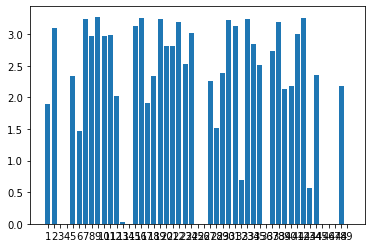

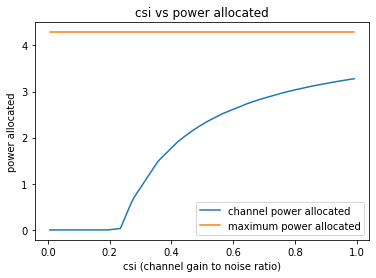

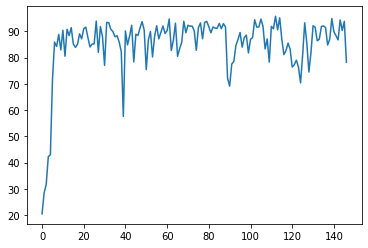

147
Power Allocated= 2.2721756768650696
CSI= 0.4565964146485566
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.331973


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070149
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.080518

Power Allocated= 2.9242554464319754
CSI= 0.6501789213605745
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.039607
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004150
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 1.4474452890413647
CSI= 0.3316916443488481
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.791177
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.030963
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000237

Power Allocated= 0
CSI= 0.1532869610020402
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4614037816893304
CSI= 0.9991109538751393
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.26839807729

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012667
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001723

Power Allocated= 2.8475013250182184
CSI= 0.6192746917211223
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.540796
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032425
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.268046

Power Allocated= 0.23147670686160104
CSI= 0.23636097254639854
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.015705
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003057
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000255

Power Allocated= 1.4001620809906057
CSI= 0.3265699032236947
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.723996
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.179982
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002871

Power Allocated= 3.1784607685739843
CSI= 0.77891759798019

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3541, Accuracy: 9208/10000 (92%)

Power in training Round= 97.99604191316881



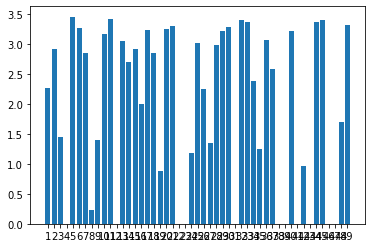

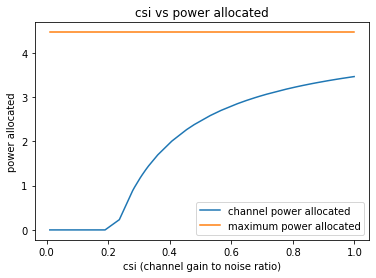

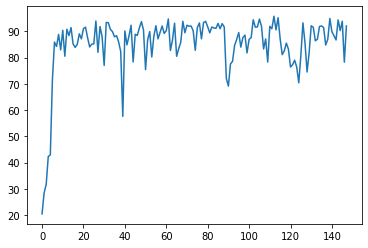

148
Power Allocated= 0
CSI= 0.1720349493461547
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0874340318070015
CSI= 0.7726166793907633
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.283200


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000007

Power Allocated= 1.3155526326758573
CSI= 0.3261382572358378
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.583937
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.085209
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.418279

Power Allocated= 2.854092977680281
CSI= 0.6546027984400057
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.078380
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.206203
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001072

Power Allocated= 2.9882213075808535
CSI= 0.7176094696879032
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.437076
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.038283
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.090008

Power Allocated= 0
CSI= 0.03527767845651597
SNR= 18.5961461

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2574, Accuracy: 9262/10000 (93%)

Power in training Round= 97.99453960542009



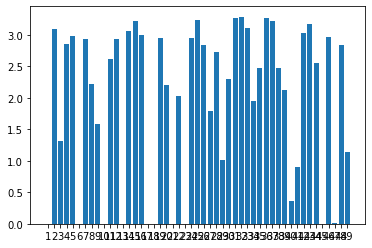

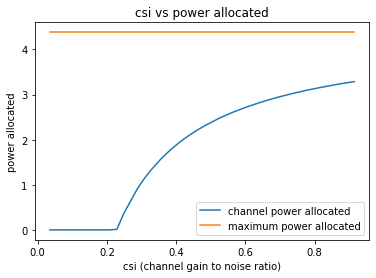

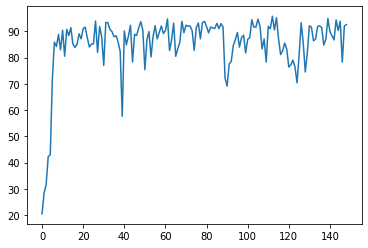

149
Power Allocated= 0
CSI= 0.12133877330866527
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10185313211439229
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7642469369727367
CSI= 0.23731270290559514
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.614029


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004404
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000012

Power Allocated= 2.168140874392875
CSI= 0.35587752170709963
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.243449
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062773
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000348

Power Allocated= 0.8435859693064094
CSI= 0.24186660611473487
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.048097
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023062
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.054874

Power Allocated= 0
CSI= 0.1076285293585918
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.557279274285545
CSI= 0.703820357195343
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.802747581221

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2963, Accuracy: 9198/10000 (92%)

Power in training Round= 98.00370214302488



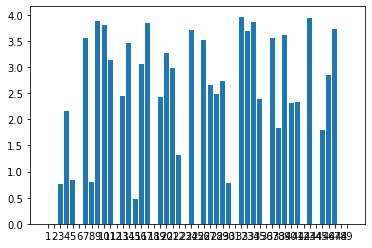

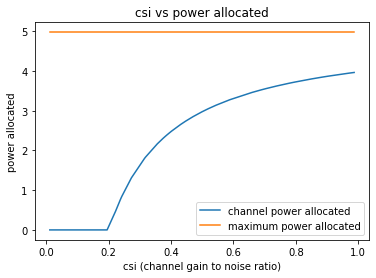

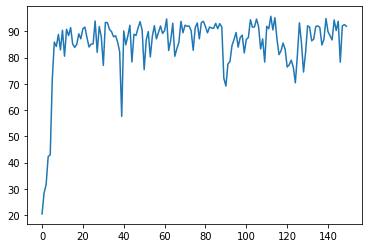

150
Power Allocated= 0
CSI= 0.12765028606164663
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04228711737971402
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.2840228702616336
CSI= 0.2939436373007358
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.571782


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003261
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.017509

Power Allocated= 3.2071368539753573
CSI= 0.6761788075814923
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.542006
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022627
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001996

Power Allocated= 2.8568956628136988
CSI= 0.54670502353959
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.780046
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.280764
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.052039

Power Allocated= 0
CSI= 0.018545440267379476
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1932086294212647
CSI= 0.6698699919124179
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.929166
Model client7 Train Epoch: 2 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5209, Accuracy: 8296/10000 (83%)

Power in training Round= 98.00109811432763



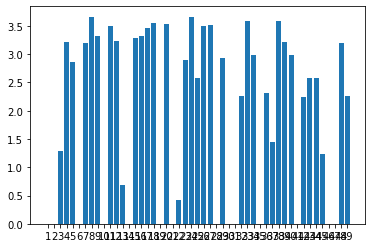

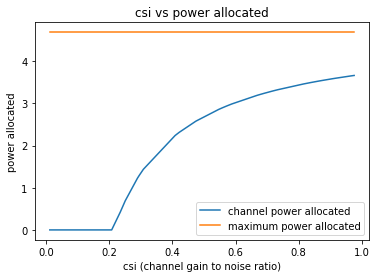

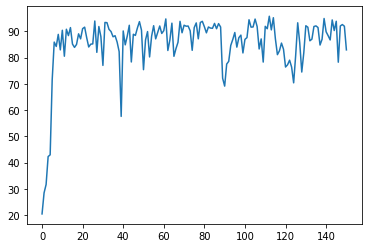

151
Power Allocated= 1.9238754067501707
CSI= 0.37464691023045815
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.026599


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099444
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.234221

Power Allocated= 0
CSI= 0.03538385263307409
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.11047907534631074
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1657832368938745
CSI= 0.41198513139116977
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.542628


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001035
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002593

Power Allocated= 3.3052120526142703
CSI= 0.7764920161906985
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.374956
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079906
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.300834

Power Allocated= 3.3076992277581567
CSI= 0.7779945349737988
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.954871
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099533
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000147

Power Allocated= 0
CSI= 0.17518335951377217
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1987507554264276
CSI= 0.4176578130401548
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.399013
Model client8 Train Epoch: 2 [0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4633, Accuracy: 8194/10000 (82%)

Power in training Round= 98.00332608803458



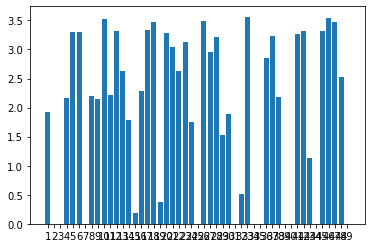

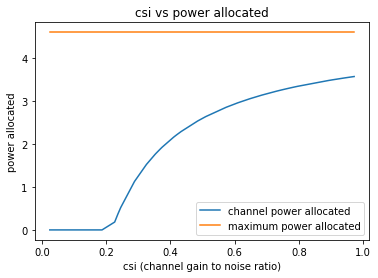

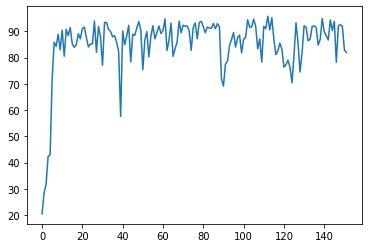

152
Power Allocated= 1.8134429079871515
CSI= 0.3605822641247858
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.684875


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.102193
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.276536

Power Allocated= 3.1552781492507926
CSI= 0.6985889140609381
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.869169
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000001
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.5478986082471207
CSI= 0.4904758050381235
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.717850
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000657
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001952

Power Allocated= 0.6637571255301071
CSI= 0.2549083861102246
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.174032
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012550
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000268

Power Allocated= 2.657371992651419
CSI= 0.5183057373191055

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.071564
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.330306

Power Allocated= 2.2723873875637985
CSI= 0.4320871785492898
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.241783
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000249
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.5224245760746142
CSI= 0.93957535827109
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.229253
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012287
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000274

Power Allocated= 0.6567424627998117
CSI= 0.25445339891493257
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.363601
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.4044753328366983
CSI= 0.45824

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2901, Accuracy: 9107/10000 (91%)

Power in training Round= 97.99705096722955



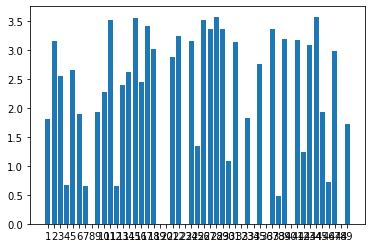

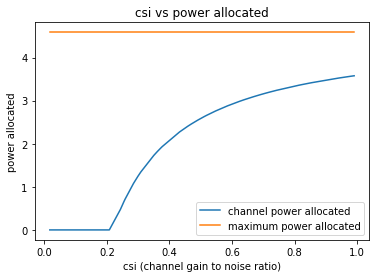

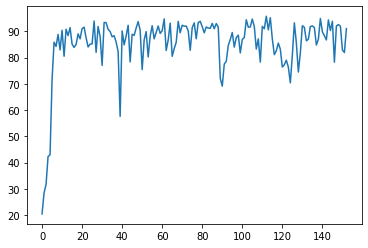

153
Power Allocated= 2.26970032048634
CSI= 0.3930087508861424
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.880307


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025118
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.091508

Power Allocated= 2.9064175599774313
CSI= 0.5241762221122372
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.735132
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000002
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.7932199904984287
CSI= 0.49481607556645446
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.376297
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005082
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000060

Power Allocated= 3.7130596368125612
CSI= 0.9081717663790518
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.259479
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.124385
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.142174

Power Allocated= 0
CSI= 0.01136790978231772
SNR= 18.42900

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.127325
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.078092

Power Allocated= 0
CSI= 0.010151457127303365
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.676712651328927
CSI= 0.8791515827553843
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.675910
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.057304
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.135167

Power Allocated= 2.15668123422294
CSI= 0.37629468548707057
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.309872
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015216
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.620486

Power Allocated= 3.2050618433834606
CSI= 0.6214611355098837
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.199093
Model client11 Train Epoch:

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3197, Accuracy: 8849/10000 (88%)

Power in training Round= 98.00654092083028



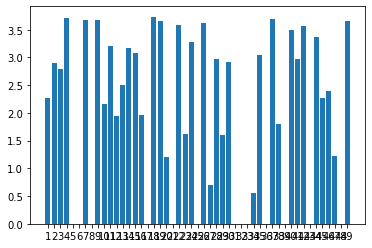

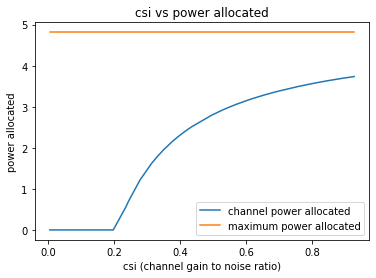

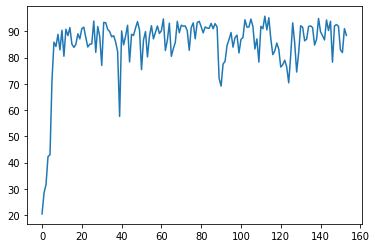

154
Power Allocated= 0.864130364241531
CSI= 0.305764301801578
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.387888


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006919
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.669200

Power Allocated= 3.0637276229085098
CSI= 0.933797743280083
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.710285
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.017389
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000116

Power Allocated= 1.4992513856771215
CSI= 0.3794530787002732
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.659015
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.433091
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.114795

Power Allocated= 2.4303808471080277
CSI= 0.5867709593128148
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.460534
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000336
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003041

Power Allocated= 0
CSI= 0.04889265662696651
SNR= 18.4290047

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000410
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000002

Power Allocated= 2.2628115051212703
CSI= 0.5342417349876496
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.239645
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.128405
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000611

Power Allocated= 0.736311635420662
CSI= 0.2942637662943295
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.735961
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004605
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.109921

Power Allocated= 2.0717098939587366
CSI= 0.48475131322057774
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.835271
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.060529
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.308540

Power Allocated= 3.1327018644126023
CSI= 0.9980822135698074

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2654, Accuracy: 9154/10000 (92%)

Power in training Round= 97.99708087050958



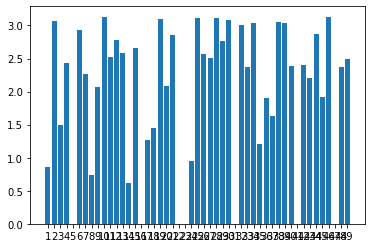

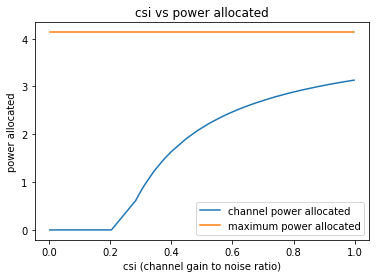

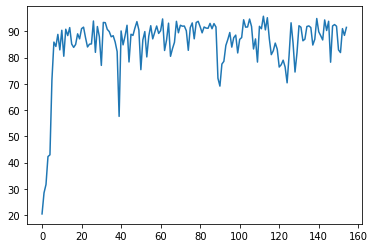

155
Power Allocated= 0.9438517831553486
CSI= 0.30489341890724075
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.061018


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.282224
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.072049

Power Allocated= 2.643675072268201
CSI= 0.6329068413836991
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.840755
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000132
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000020

Power Allocated= 2.985279365414554
CSI= 0.8074889313496337
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.569823
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008593
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001665

Power Allocated= 3.1176162466482458
CSI= 0.9041017576186442
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.305861
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000081
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.354873090055619
CSI= 0.5350989190533133
S

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004290
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000035

Power Allocated= 2.3866664252809
CSI= 0.5443598847672678
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.807592
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.029371
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.057461

Power Allocated= 2.62030207925633
CSI= 0.6236807770645026
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.986591
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.7699021193197
CSI= 0.6878599460954681
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.706116
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000620
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.423109602489951
CSI= 0.5553775783220203


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2488, Accuracy: 9446/10000 (94%)

Power in training Round= 97.99591418095159



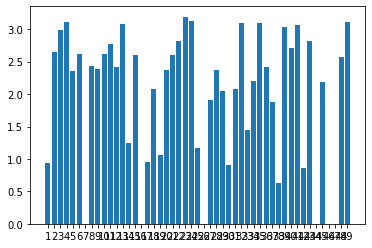

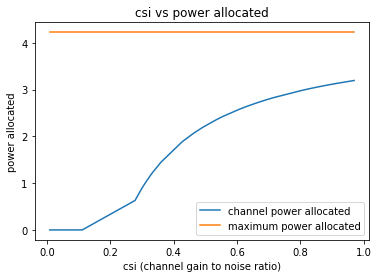

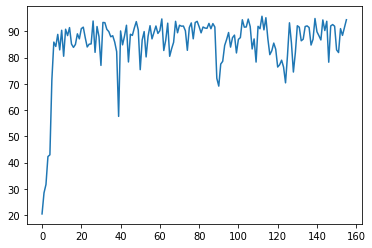

156
Power Allocated= 3.2281895402742125
CSI= 0.5794619252738684
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.892337


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.018026
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.391530

Power Allocated= 3.753069688289122
CSI= 0.8327373869152431
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.543121
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027008
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002858

Power Allocated= 0
CSI= 0.10180891511212653
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.642636198170302
CSI= 0.7626064952013394
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.912655


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.041811
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.153683

Power Allocated= 2.2325338076228713
CSI= 0.3674586474213878
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.261886
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.144576
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.068155

Power Allocated= 2.5847084830623572
CSI= 0.42207984379180585
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.179445
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079424
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.397944660548793
CSI= 0.6426802110431246
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.675110
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.453029
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.010950

Power Allocated= 0
CSI= 0.1458134660771626
SNR= 19.2408940

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3809, Accuracy: 8743/10000 (87%)

Power in training Round= 98.00039204480282



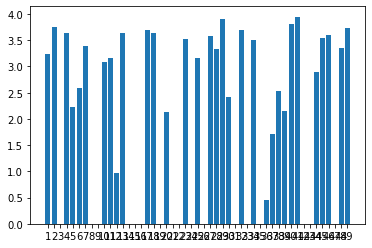

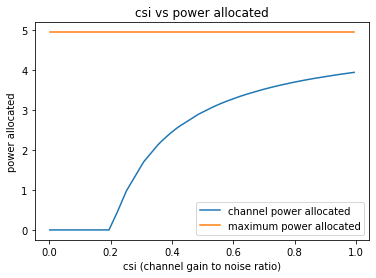

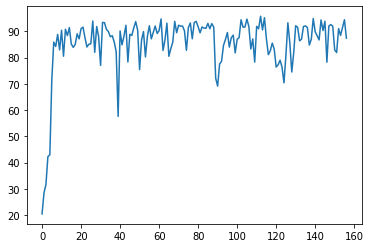

157
Power Allocated= 2.946217020879498
CSI= 0.6897627585358849
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.136535


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.108810
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009242

Power Allocated= 2.933663557031296
CSI= 0.683841435821597
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.424702
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053169
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.117123

Power Allocated= 0
CSI= 0.15989385395757771
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.135734496364807
CSI= 0.7934893500717012
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.277118354727495
CSI= 0.8937568834333784
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.047693


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.101267
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.187505

Power Allocated= 0
CSI= 0.11341907827704256
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.0817011946240203
CSI= 0.4320980284113486
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.847967
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004256
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.031188

Power Allocated= 0
CSI= 0.22033296308084416
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8626480467632556
CSI= 0.6521698825303126
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.830884
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.049462
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.045587

Power Allocated= 3.3939543694896765
CSI= 0.997

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6284, Accuracy: 7680/10000 (77%)

Power in training Round= 97.9952778457251



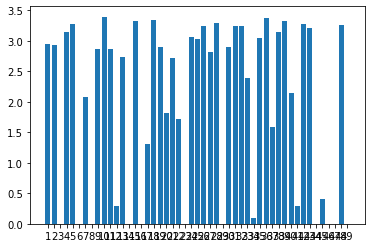

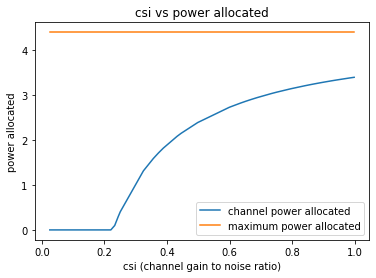

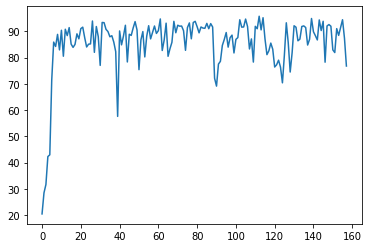

158
Power Allocated= 0
CSI= 0.16977855328721658
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.862728818221417
CSI= 0.3255585583860502
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.609337


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005845
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.068717

Power Allocated= 3.778274060452059
CSI= 0.8649779903258034
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.568767
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005026
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.361097

Power Allocated= 0
CSI= 0.16592812132412005
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02925557117646338
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.15210047863099874
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.16445864835623314
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1811375

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3269, Accuracy: 9383/10000 (94%)

Power in training Round= 97.99918991848205



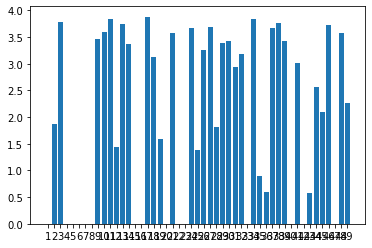

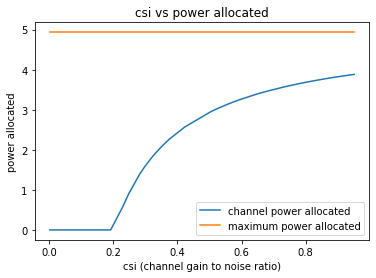

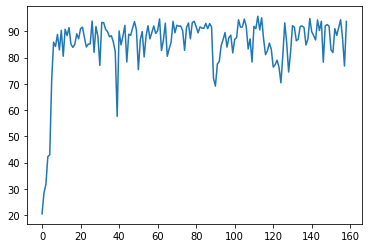

159
Power Allocated= 1.7215852771967786
CSI= 0.34438088574366577
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.060205


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075195
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.144381

Power Allocated= 2.439088950402185
CSI= 0.4574025675782437
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.197430799686778
CSI= 0.7003212577179796
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.648097
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002038
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000001

Power Allocated= 0
CSI= 0.18793251946670875
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6188066002882597
CSI= 0.4983702543309717
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.717838


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.179715
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.069351

Power Allocated= 2.143620652137569
CSI= 0.402945329063246
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.598458
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000415
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0.6173466636245619
CSI= 0.24950098322607694
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.784255
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.099300
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.071685

Power Allocated= 2.502666105712855
CSI= 0.4711023919431415
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.696439
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002707
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000120

Power Allocated= 2.9138773865493977
CSI= 0.5842932004024165


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5343, Accuracy: 7971/10000 (80%)

Power in training Round= 97.99791401960861



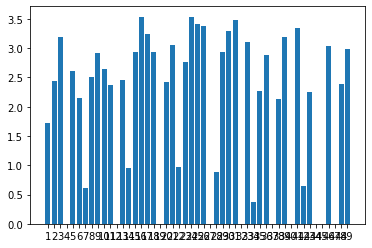

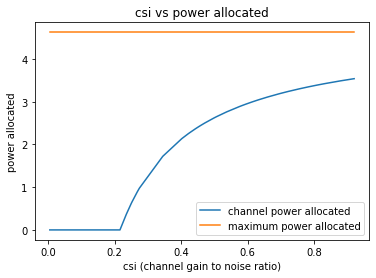

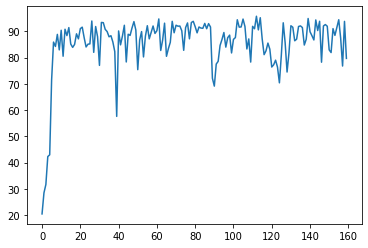

160
Power Allocated= 2.89292786154605
CSI= 0.8011524811502199
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.1391242542891299
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6963754781523033
CSI= 0.6921592508618235
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.758769


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000591
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023873

Power Allocated= 2.921013742469092
CSI= 0.8195942309237009
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.929863
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.147817
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.037476

Power Allocated= 2.172869355849238
CSI= 0.5080628702798232
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.050516
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.060524
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.266334

Power Allocated= 0
CSI= 0.023617062144069223
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.805450682806814
CSI= 0.7486828699043628
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.204517
Model client7 Train Epoch: 2 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4968, Accuracy: 8144/10000 (81%)

Power in training Round= 97.99866238384318



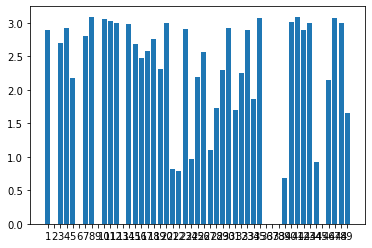

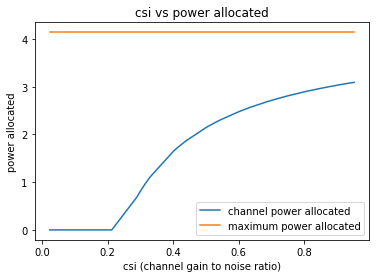

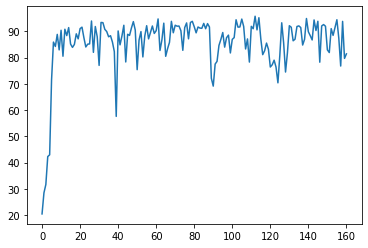

161
Power Allocated= 2.4054301222119765
CSI= 0.435367203878935
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.300688


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016658
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000003

Power Allocated= 3.3435351241191666
CSI= 0.7359398821223663
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.13363557077480248
CSI= 0.21888034757003005
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.568661
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034019
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.036737

Power Allocated= 3.6760811389156585
CSI= 0.9744113468001241
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8857179960562567
CSI= 0.5504717137555212
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.904956
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107959
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.052850

Power Alloc

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.145304
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.015208

Power Allocated= 3.6421002542238963
CSI= 0.9431813305783967
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.444404
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000076
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.727047

Power Allocated= 1.7765709719619815
CSI= 0.34179027351336466
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.503522
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.051792
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 1.6023109675232767
CSI= 0.3225774403360393
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.134229
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000008
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.5342980200454805
CSI= 0.85

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4452, Accuracy: 8523/10000 (85%)

Power in training Round= 98.00764793362289



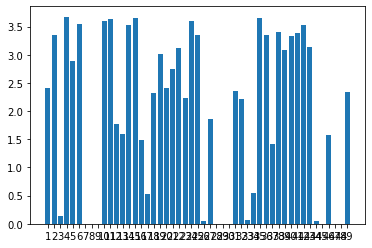

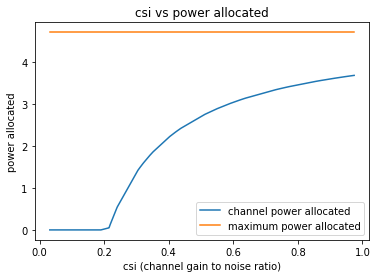

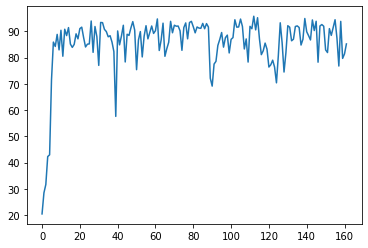

162
Power Allocated= 0
CSI= 0.01568631667479725
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.562580594549979
CSI= 0.3518735972858874
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.077815


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.079531
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000008

Power Allocated= 3.0921021208427764
CSI= 0.7619581148671911
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.259050712959711
CSI= 0.8730120926969298
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.796859
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002257
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000242

Power Allocated= 3.38961851849837
CSI= 0.9853268087952061
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.384918
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024814
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.057506

Power Allocated= 1.2471187047232934
CSI= 0.316717136803606
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.852661
Model client6 Train

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2478, Accuracy: 9274/10000 (93%)

Power in training Round= 98.00652519685332



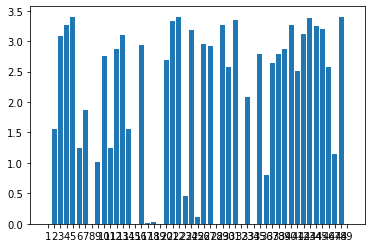

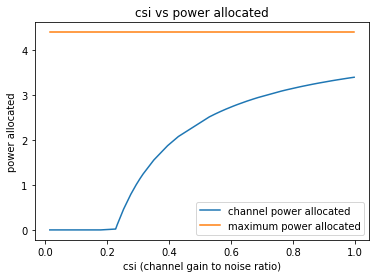

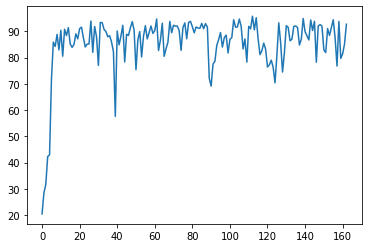

163
Power Allocated= 0
CSI= 0.1691311167516002
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.980544443269989
CSI= 0.6518359886720664
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1048893735284864
CSI= 0.7093288670606268
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.239153


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004160
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.051291

Power Allocated= 0
CSI= 0.18339261379925098
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.105808323614375
CSI= 0.7097915360304756
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.704215
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.149808
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.056516

Power Allocated= 0
CSI= 0.02522494621339133
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3006302530826686
CSI= 0.8236944382636024
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.475786
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.020685
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029985

Power Allocated= 2.7354155318749633
CSI= 0.562

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2280, Accuracy: 9479/10000 (95%)

Power in training Round= 98.00075792479235



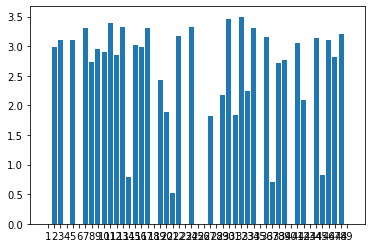

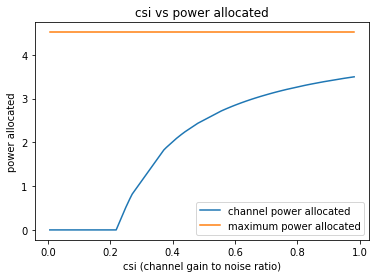

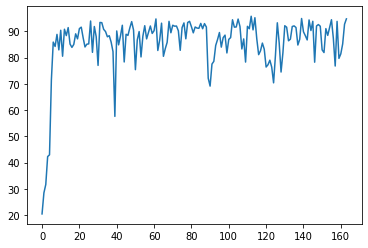

164
Power Allocated= 0.6431341519753877
CSI= 0.24022813480749405
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.409317


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.172501
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012017

Power Allocated= 2.7123133360425324
CSI= 0.47766200038313167
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.564163
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.254574
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000442

Power Allocated= 0
CSI= 0.10876494308855211
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.13727572947045952
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.14809252839937237
CSI= 0.21469587337104457
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.346466


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.105338
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.040102

Power Allocated= 0.08670542019941863
CSI= 0.21190308421093906
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.591349
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.034385
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.016551

Power Allocated= 3.2204195847615
CSI= 0.6307459690657562
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.668799
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.248569
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.027439

Power Allocated= 3.0644103480419425
CSI= 0.5742395369153857
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.512137
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000039
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.095985

Power Allocated= 0
CSI= 0.20515697899824392
SNR= 19.6233662

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4773, Accuracy: 8643/10000 (86%)

Power in training Round= 97.99280641326548



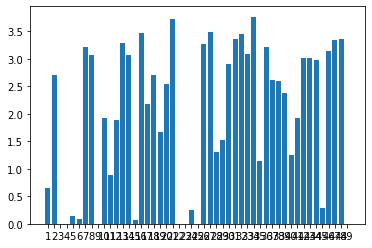

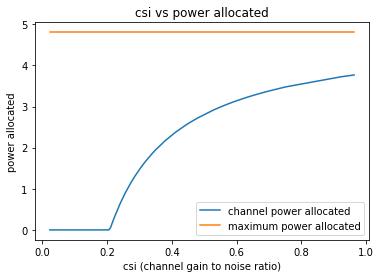

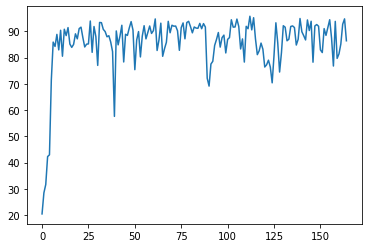

165
Power Allocated= 0
CSI= 0.16788253663795483
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1913752946097165
CSI= 0.3965729354952775
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.037959


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000081
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.102996

Power Allocated= 0.23609462966402806
CSI= 0.2233696015783091
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.107273
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.083604
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003288

Power Allocated= 0.04600586756867919
CSI= 0.2142716177493036
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.488313
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.119607
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.033452

Power Allocated= 0.749095428083622
CSI= 0.25227780892069174
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.904668
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.311944
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.536286

Power Allocated= 0
CSI= 0.09138329685439683
SNR= 18.5961

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.7202, Accuracy: 7761/10000 (78%)

Power in training Round= 98.00675562482893



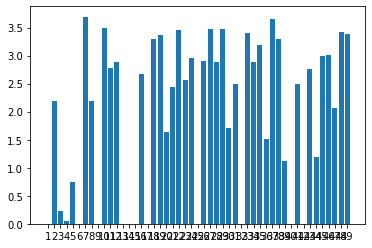

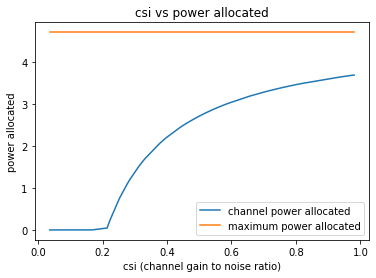

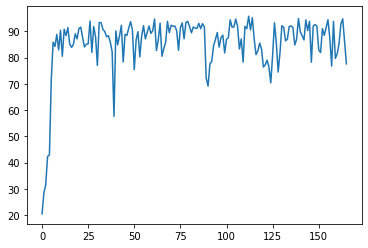

166
Power Allocated= 2.7407274512386923
CSI= 0.6714153673003507
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.295299


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000980
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.231695

Power Allocated= 2.9854749472613777
CSI= 0.8034429161195078
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.530928
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000082
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.4519380041785297
CSI= 0.5623726242791067
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8115313134327873
CSI= 0.7049267393830908
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.465864
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.141819
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.042214

Power Allocated= 3.1634829497931074
CSI= 0.9375273990708678
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.589351
Model client5 T

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062749
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.045416

Power Allocated= 2.638179886182849
CSI= 0.628164947396155
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.025445437781236
CSI= 0.4535820039929451
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.262728
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.161704
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.273037

Power Allocated= 0
CSI= 0.07165205714015144
SNR= 19.996251205202647
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.915805102307619
CSI= 0.7608535718218544
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.702394
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.023752
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004558

Power Allocated= 2.1155877201

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5648, Accuracy: 8170/10000 (82%)

Power in training Round= 97.99380290279687



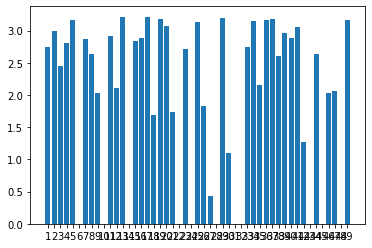

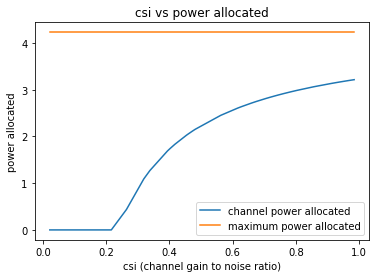

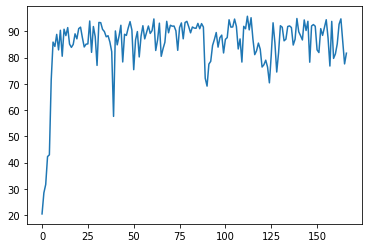

167
Power Allocated= 2.99885926056242
CSI= 0.6339622849936336
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.458944


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037843
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000003

Power Allocated= 2.894766743872157
CSI= 0.5947165086071601
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.820800
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011502
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.025262

Power Allocated= 3.503353730485248
CSI= 0.9320651016546919
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.663268
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.089735
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.038333

Power Allocated= 3.0092575449911614
CSI= 0.6381691728612832
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.224525
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.071769
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.169828

Power Allocated= 0
CSI= 0.09600523785684667
SNR= 18.42900477

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.037494
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.041144

Power Allocated= 3.3671899864336345
CSI= 0.8270955341362491
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.305725
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014177
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.005830

Power Allocated= 0
CSI= 0.20291316050969577
SNR= 19.62336625054567
Client: client9
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7725000235419044
CSI= 0.5544035857419298
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.629045
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000002
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.153805

Power Allocated= 3.4651830878824788
CSI= 0.9000437728355911
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.960994
Model client11 Train Epoch

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.7483, Accuracy: 7228/10000 (72%)

Power in training Round= 97.99821536402963



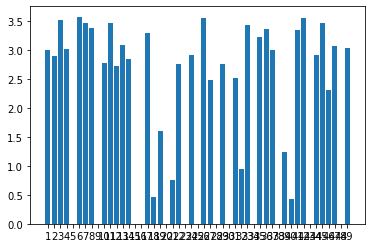

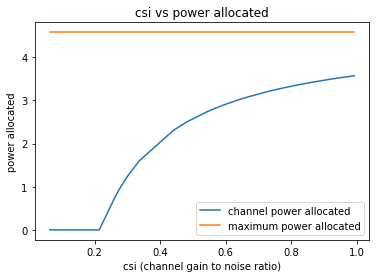

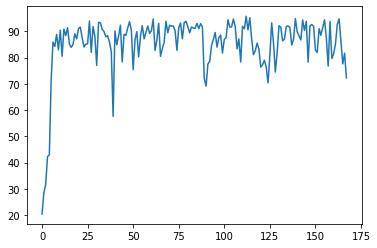

168
Power Allocated= 3.2648504820463167
CSI= 0.7608477284859844
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.751764


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.126709
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.187487

Power Allocated= 3.396571579185265
CSI= 0.8455927812776597
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.103446
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.159524
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.025062

Power Allocated= 0
CSI= 0.12914773061878826
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.034548126787531386
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7363877705826907
CSI= 0.35176757887722776
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.706133


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.254522
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.214087

Power Allocated= 0
CSI= 0.060938202988790824
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.212987257585171
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.045725013472845
CSI= 0.28300961108974665
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.795636
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000047
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.002402

Power Allocated= 2.7558863632062156
CSI= 0.5484598399770446
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.843426
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.153904
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.945381

Power Allocated= 2.612988183534977
CSI= 0.50859

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3352, Accuracy: 9515/10000 (95%)

Power in training Round= 98.0021841417802



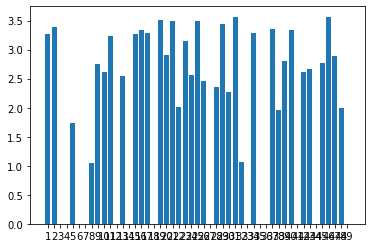

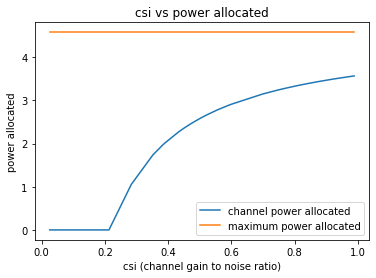

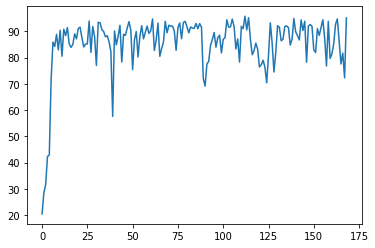

169
Power Allocated= 2.5805382068962137
CSI= 0.393733418589267
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.538770


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013656
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.072352

Power Allocated= 1.9571557272054845
CSI= 0.3161383599415589
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.18769374571355668
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.1870826521642135
CSI= 0.5172649999109621
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.777759


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021556
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001667

Power Allocated= 3.9929924895877837
CSI= 0.887047605628456
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.652735
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.175538
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.330706

Power Allocated= 3.8720199067521586
CSI= 0.8010844798290203
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.662308
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.088722
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002272

Power Allocated= 3.8760053909480106
CSI= 0.8036503018095299
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.730512
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075376
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007595

Power Allocated= 3.688599905959795
CSI= 0.698456790098639
S

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5646, Accuracy: 8524/10000 (85%)

Power in training Round= 98.00869880894136



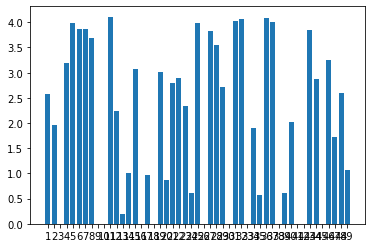

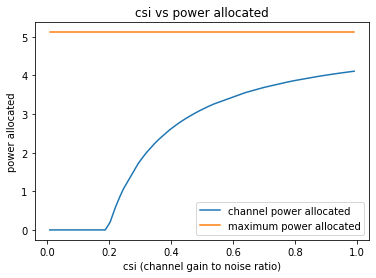

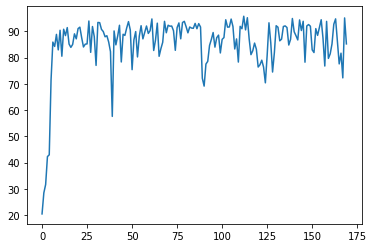

170
Power Allocated= 1.9720471316650796
CSI= 0.4114995438208199
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.071738


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.105976
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028954

Power Allocated= 0
CSI= 0.19793404879208076
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.12441513734128773
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3412289569651583
CSI= 0.9425474659407104
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.687918


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015154
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.078916

Power Allocated= 3.2904463076606127
CSI= 0.8994931735439492
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.325150
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.234428
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.057807

Power Allocated= 0
CSI= 0.16073851339026102
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.304378151387561
CSI= 0.9109083106054295
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.719649
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021130
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.030729

Power Allocated= 2.4791009176779335
CSI= 0.5199984743392284
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.590264
Model client8 Train Epoch: 2 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4392, Accuracy: 8976/10000 (90%)

Power in training Round= 97.99869473725703



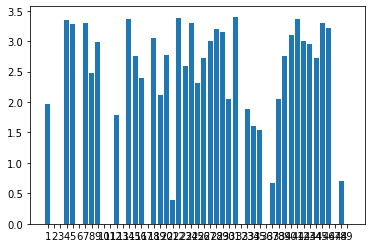

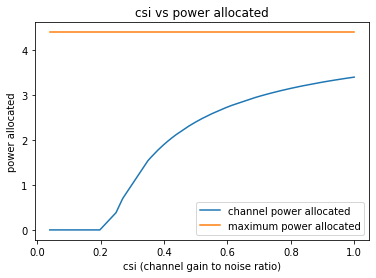

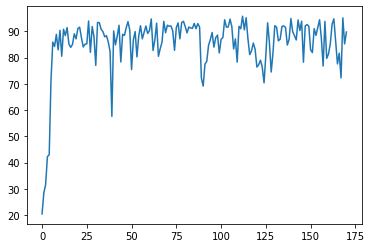

171
Power Allocated= 2.2933209585623557
CSI= 0.41755195026047154
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.630742


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000033
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.088736

Power Allocated= 0
CSI= 0.12665364406185609
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.5287756312136294
CSI= 0.8624727625353571
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.205192


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001877
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.084334

Power Allocated= 0
CSI= 0.13829967631549833
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 2.77982015419731e-05
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.33276269929476
CSI= 0.7377515697318555
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.698321
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000272
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002005

Power Allocated= 0.5749528779381983
CSI= 0.24311500385314566
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.415355
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000182
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.065700

Power Allocated= 3.6607993457065264
CSI= 0.97

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2898, Accuracy: 9202/10000 (92%)

Power in training Round= 98.00324419980026



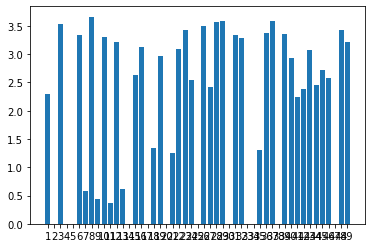

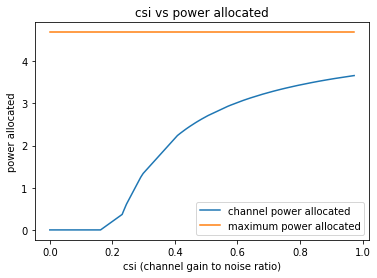

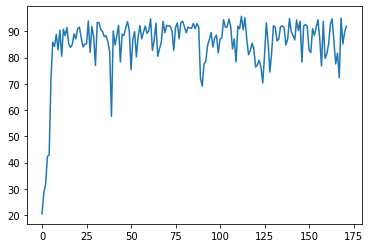

172
Power Allocated= 2.8536086534100664
CSI= 0.5567133645563299
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3254276948511294
CSI= 0.7550375392658448
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.579899


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005808
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000023

Power Allocated= 3.2837412348166355
CSI= 0.731998017180604
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.450718140522384
CSI= 0.833926106503176
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.555871
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013159
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.211247

Power Allocated= 2.6480817106109926
CSI= 0.4995545364045546
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.372681
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.044839
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.045969

Power Allocated= 3.204963039228204
CSI= 0.6920884050471474
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.235561
Model client6 Train

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027804
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.047265

Power Allocated= 3.622711782126795
CSI= 0.9735644427307438
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.226392
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040120
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.485612445545203
CSI= 0.4620532510527079
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.154682
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.040093
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.049073

Power Allocated= 1.8881893199447326
CSI= 0.3620989790694781
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.067495
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.058645
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000005

Power Allocated= 1.9262820828651295
CSI= 0.367163

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3419, Accuracy: 8907/10000 (89%)

Power in training Round= 97.99862384972121



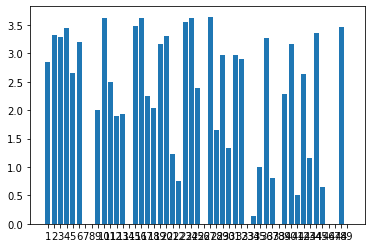

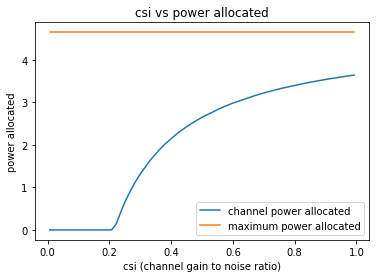

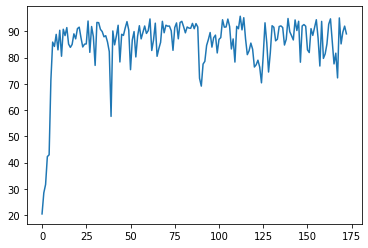

173
Power Allocated= 2.9699846811378525
CSI= 0.7421526025864716
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.259482


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.074274
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.0155145038135878
CSI= 0.4344233681129691
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.6288227281075125
CSI= 0.5922087606403839
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.288401531889624
CSI= 0.9718032019105386
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.535773
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027338
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.011643

Power Allocated= 2.9928376090271382
CSI= 0.7549569440743408
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.811112
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.175074
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.051986

Power Allocate

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 1.5741803540939943
CSI= 0.3645329684087556
SNR= 20.466394740873444
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.877518
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.025961
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.18122023337526105
SNR= 20.54304442884906
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.1895071803100055
CSI= 0.46994484703283357
SNR= 20.559061872099633
Client: client17
Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.364229
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036300
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.357520

Power Allocated= 3.2666382516691232
CSI= 0.9516756190628027
SNR= 20.627161125173572
Client: client18
Model client18 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.506618
Model client18 Tra

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2867, Accuracy: 9112/10000 (91%)

Power in training Round= 98.00342738087637



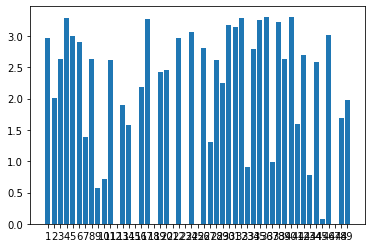

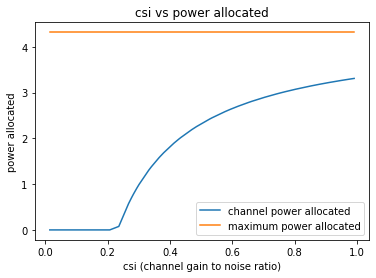

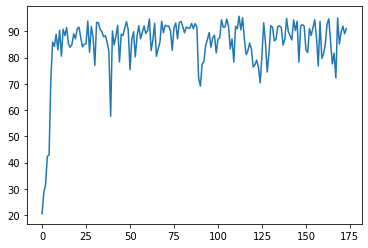

174
Power Allocated= 2.8744629594462454
CSI= 0.5617460786415527
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.902440


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001704
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.025069

Power Allocated= 3.1234012431587557
CSI= 0.6530716924963683
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.003536
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.228455
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003879

Power Allocated= 2.7227469595989744
CSI= 0.5176305644892603
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.876235383879884
CSI= 0.562305939942524
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.542591
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.026588
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0.6659946076416117
CSI= 0.2507125192573729
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.762319
Model client5 Tra

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.175190
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.027069

Power Allocated= 0
CSI= 0.05464674256053281
SNR= 20.18554291572515
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.560820947401237
CSI= 0.9142391129266004
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.051761
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000168
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.005389538638173
CSI= 0.6063409339003304
SNR= 20.466394740873444
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.453616
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000723
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.044342

Power Allocated= 3.259945951108926
CSI= 0.7170099691673371
SNR= 20.54304442884906
Client: client16
Model client16 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.567966
Model client16 Train Epo

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6442, Accuracy: 7919/10000 (79%)

Power in training Round= 97.99785874039452



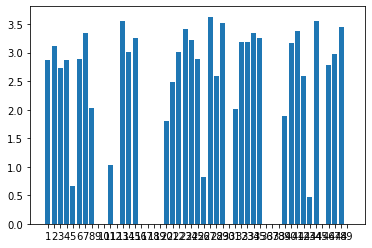

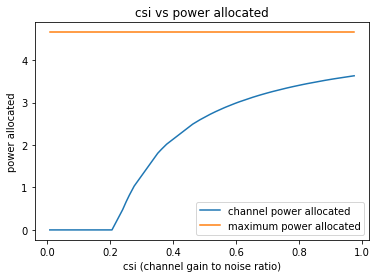

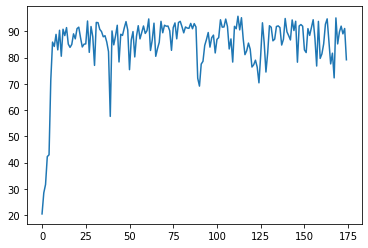

175
Power Allocated= 2.2804654362487784
CSI= 0.464649754026762
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.045847


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008367
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009008

Power Allocated= 0
CSI= 0.14625120043406126
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9811300180492473
CSI= 0.6889452758719438
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.751449


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015882
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000410

Power Allocated= 1.161612651590429
CSI= 0.305715834888477
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.310558
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031128
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.222717

Power Allocated= 3.2495155638114537
CSI= 0.8452309809475058
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.774690
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.122643
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.147954

Power Allocated= 3.0615949436917895
CSI= 0.7293790840042379
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.630991
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002300
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000011

Power Allocated= 0.6271328655543633
CSI= 0.26277816314680946

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4678, Accuracy: 8593/10000 (86%)

Power in training Round= 98.0013880670419



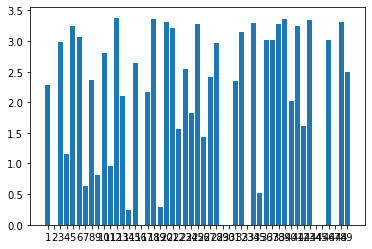

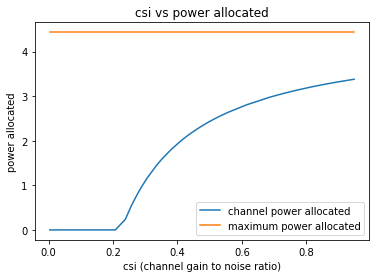

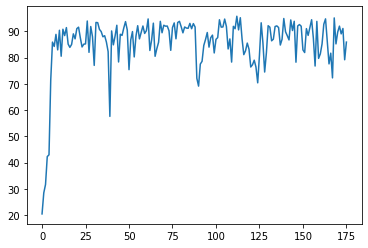

176
Power Allocated= 0
CSI= 0.16221890923223958
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.70532969811582
CSI= 0.9738709834727145
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.554387


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.103499
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.247729

Power Allocated= 3.685863650341372
CSI= 0.9557523849642706
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.430866
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.033543
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001516

Power Allocated= 0.35377935412546613
CSI= 0.22839495608477733
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.581988
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000019
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006496

Power Allocated= 0
CSI= 0.0010212120021659832
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.2632591896493137
CSI= 0.6807812739276715
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.266626
Model client6 Train Epoch: 2

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4700, Accuracy: 8442/10000 (84%)

Power in training Round= 98.0012917006273



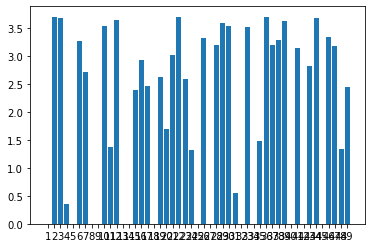

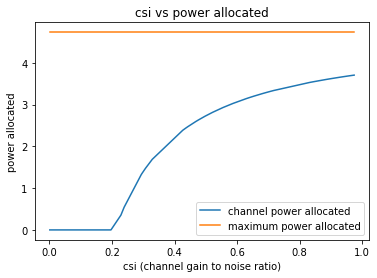

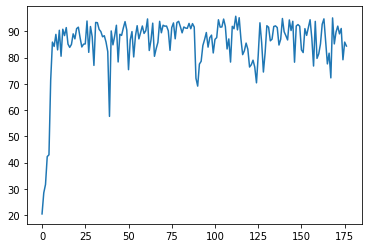

177
Power Allocated= 0
CSI= 0.03542443142958407
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08595377021053108
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7486132391766382
CSI= 0.9223625503411749
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.159722


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000738
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.008372

Power Allocated= 1.6927599401569418
CSI= 0.31846873328903746
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.886832
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.396410
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.035596

Power Allocated= 0
CSI= 0.05035550898582264
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6686307228257835
CSI= 0.8589922221371558
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.298177
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003499
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002099

Power Allocated= 1.604886946038067
CSI= 0.30979906798211854
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.616963
Model client7 Train Epoch: 2 [

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3470, Accuracy: 9172/10000 (92%)

Power in training Round= 98.00383017594987



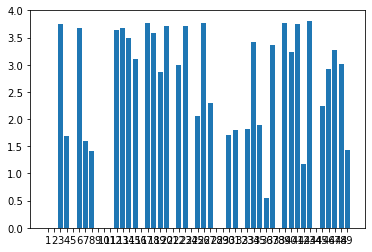

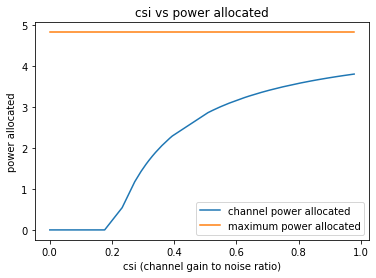

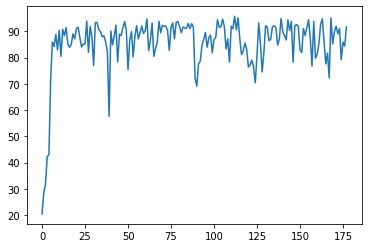

178
Power Allocated= 2.958563866189772
CSI= 0.6771339397617644
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.834955


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003420
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.014928

Power Allocated= 1.0135701711605667
CSI= 0.29224330232339446
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.253763
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.003035
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.104172

Power Allocated= 3.2778042608309255
CSI= 0.8638769239032421
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.599199
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.015066
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003178

Power Allocated= 1.9660159186374364
CSI= 0.40496312358924047
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.653444
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.032022
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000708

Power Allocated= 2.57496266797924
CSI= 0.537514798413101

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001502
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.153456880255791
CSI= 0.7800800729513344
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.621167
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002818
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.081930

Power Allocated= 3.281960889584364
CSI= 0.8669901256245519
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.832334
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000037
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007251

Power Allocated= 3.168218732569537
CSI= 0.7891676755758746
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.612836
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.8846048595899796
CSI= 0.644840

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4524, Accuracy: 8401/10000 (84%)

Power in training Round= 98.00510299284977



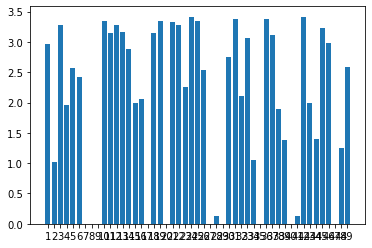

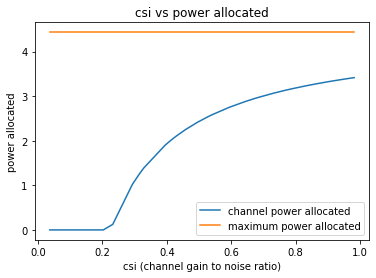

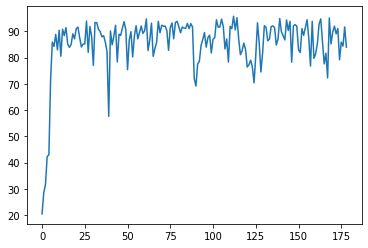

179
Power Allocated= 0
CSI= 0.13534529950658603
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7435841526083058
CSI= 0.2468685119104581
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.665373


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001114
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.3277653791494566
CSI= 0.40542324263615326
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.246175
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.061367
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.492291

Power Allocated= 3.711499314501606
CSI= 0.9235109393043003
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.829332
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.078881
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000113

Power Allocated= 0
CSI= 0.03908484211722785
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9938680406683651
CSI= 0.263126355561332
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.312235
Model client6 Train Epoch: 2 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 1.0066, Accuracy: 7043/10000 (70%)

Power in training Round= 97.99594860019096



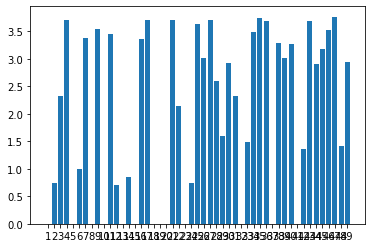

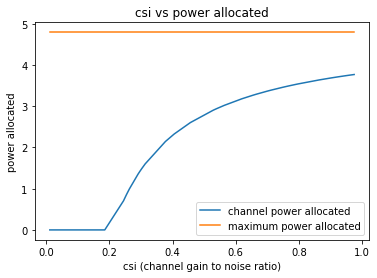

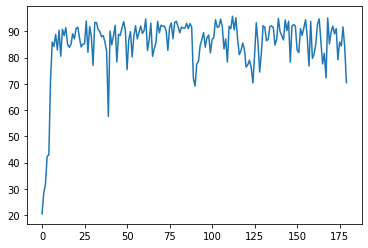

180
Power Allocated= 0
CSI= 0.07729212994292678
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.9043521252105555
CSI= 0.6674591737322799
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.150849


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.096738
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.043738

Power Allocated= 1.7145859675200166
CSI= 0.3720258670145704
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.886177
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005459
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000170

Power Allocated= 0.912372826448034
CSI= 0.28651667360597666
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.859310
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024029
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.002582

Power Allocated= 0
CSI= 0.2257283497927488
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.3715804070150392
CSI= 0.9699408591428272
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.310792
Model client6 Train Epoch: 2 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4047, Accuracy: 8754/10000 (88%)

Power in training Round= 98.0002018785524



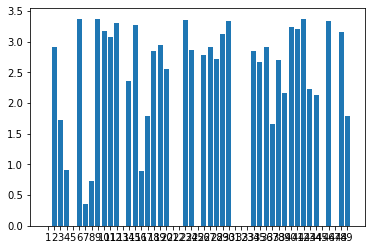

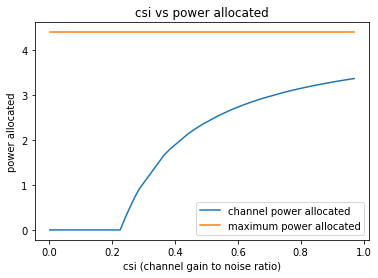

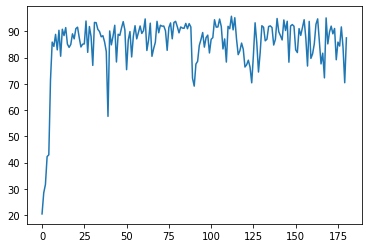

181
Power Allocated= 3.89714999176275
CSI= 0.9956884149915551
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.418923009734888
CSI= 0.6745102144057272
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.490658


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022190
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.124450

Power Allocated= 1.7652214931969157
CSI= 0.3188512423524529
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.243856
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.093102
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.171521

Power Allocated= 2.169481876705288
CSI= 0.36603242917723555
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.353079
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000649
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028302

Power Allocated= 3.1193701159649008
CSI= 0.5611325487497136
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.654739
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.184327
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.067379

Power Allocated= 2.6337295283911466
CSI= 0.440965575174882

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.107282
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.114098

Power Allocated= 2.592750322164252
CSI= 0.4331385794533864
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.260489
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053744
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0.7804463633620822
CSI= 0.24265755347509077
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.364959
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.105287
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.005555

Power Allocated= 0
CSI= 0.020189663899392474
SNR= 20.18554291572515
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.616169369423469
CSI= 0.4375772284623173
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.155905
Model client14 Train E

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6395, Accuracy: 7892/10000 (79%)

Power in training Round= 98.00638288617857



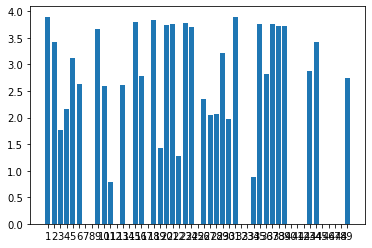

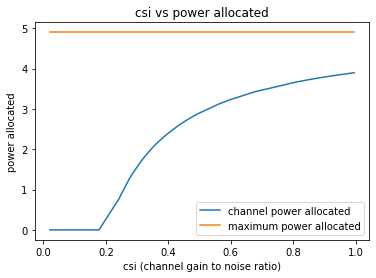

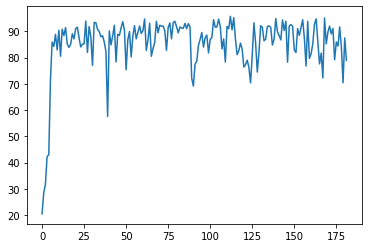

182
Power Allocated= 0.6467623969304674
CSI= 0.2693649484630577
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.847625


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.129288
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001705

Power Allocated= 2.2795764056922234
CSI= 0.4808567323859835
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.367936
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000666
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.069257

Power Allocated= 0.9038720776077902
CSI= 0.28940830740887624
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.188555
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013152
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.358312

Power Allocated= 0
CSI= 0.1109273671437736
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4233935812471405
CSI= 0.5165811370468261
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.865524


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.106091
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.055638

Power Allocated= 3.232520947204895
CSI= 0.8875658553115773
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.258465
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021419
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.044369

Power Allocated= 0
CSI= 0.16279947350912316
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.296711585161309
CSI= 0.4848517001677177
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.460126
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.016938
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000846

Power Allocated= 3.2035795090090575
CSI= 0.8653375554005683
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.365614
Model client9 Train Epoch: 2 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.7970, Accuracy: 7708/10000 (77%)

Power in training Round= 97.99618027522905



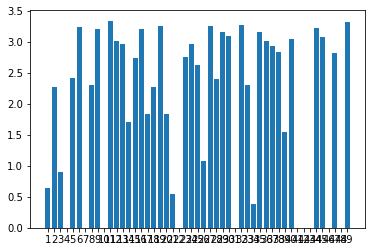

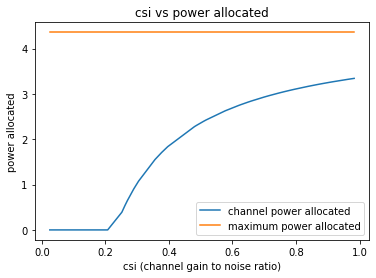

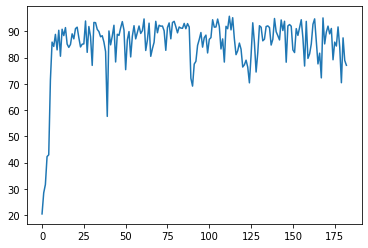

183
Power Allocated= 2.1166483157408327
CSI= 0.38004911287473864
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.317454


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.070006
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.558882

Power Allocated= 2.9481016017848853
CSI= 0.5556217398541375
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6790187281810827
CSI= 0.9355688146233678
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.110717
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002724
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000140

Power Allocated= 2.100043755336748
CSI= 0.37766583432882583
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.116248
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000201
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000128

Power Allocated= 0
CSI= 0.15265441646437583
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.6594192993

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022824
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.119643

Power Allocated= 0
CSI= 0.01217516085799164
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.7265074450896343
CSI= 0.9790677804084068
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.183847
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000130
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001401

Power Allocated= 3.00829247262136
CSI= 0.5748465374690866
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.527968
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022394
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.043304

Power Allocated= 3.6094943603966003
CSI= 0.8784313936447414
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.125235
Model client10 Train Epoch: 2 [0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.7236, Accuracy: 7624/10000 (76%)

Power in training Round= 98.00492916250052



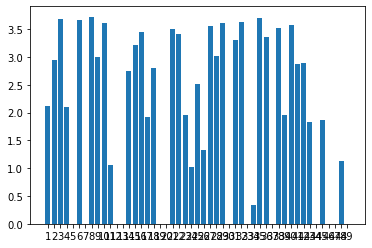

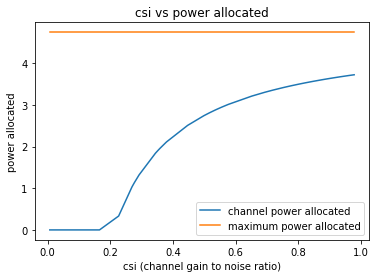

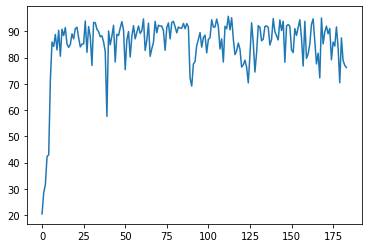

184
Power Allocated= 0
CSI= 0.07687118095034351
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.7235264104724246
CSI= 0.354990743400441
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.042053


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012056
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 1.6707302288271277
CSI= 0.3484598545269675
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.756915
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001416
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006943

Power Allocated= 2.897422722437942
CSI= 0.6086136299860815
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.798459
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.022843
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000021

Power Allocated= 0
CSI= 0.04103066427279922
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.8327792154222484
CSI= 0.5855753847848204
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.576538
Model client6 Train Epoch: 2 [0/

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5643, Accuracy: 8007/10000 (80%)

Power in training Round= 98.00586189075985



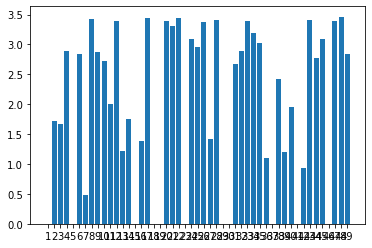

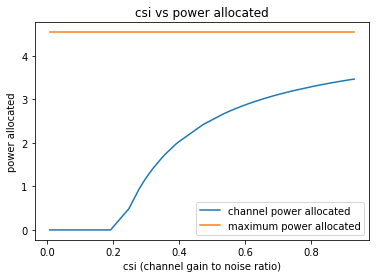

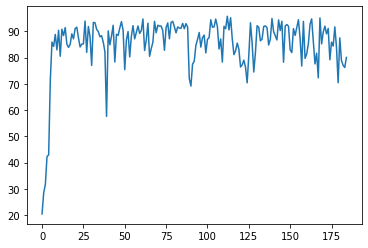

185
Power Allocated= 2.8355113570405392
CSI= 0.6432151643420034
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.320521793986231
CSI= 0.9348596549386919
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.3776060471435345
CSI= 0.4968709492184612
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.300775


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001001
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000025

Power Allocated= 3.165878576622422
CSI= 0.8167782626074177
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.7151665763750548
CSI= 0.2721062894526798
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.165781
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.223584
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.047079

Power Allocated= 2.209761124671274
CSI= 0.4586230414589756
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.350601
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.011931
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.3049749737254173
CSI= 0.4795643029820852
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.668342
Model client7 Tra

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client23 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000035
Model client23 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.629349

Power Allocated= 0
CSI= 0.07025695026523826
SNR= 21.68289591724812
Client: client24
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0152135792782886
CSI= 0.7272793431709561
SNR= 21.776509657760826
Client: client25
Model client25 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.463542
Model client25 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007261
Model client25 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.035265

Power Allocated= 2.7341291645445884
CSI= 0.6038385144844735
SNR= 21.779623597231996
Client: client26
Model client26 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.234373
Model client26 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005940
Model client26 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.178125506695493
CSI= 0.4520641229630451
SNR= 21.815775973165703
Client: client27
Model client27 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.309889
Model client27 Train

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5672, Accuracy: 8245/10000 (82%)

Power in training Round= 97.99956560312262



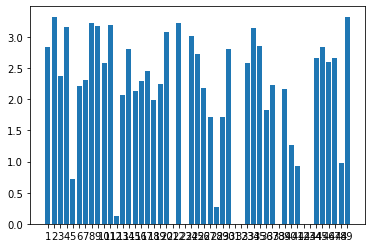

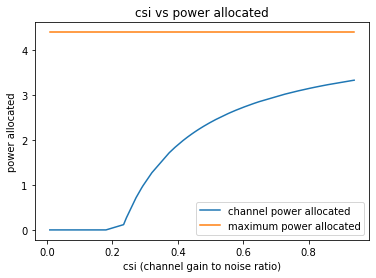

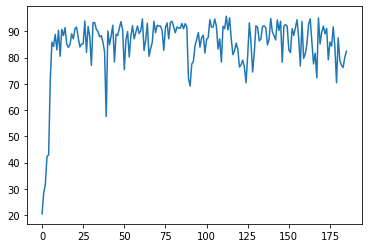

186
Power Allocated= 0
CSI= 0.012640779214162401
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5852130308168553
CSI= 0.35866818154019664
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.705048


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000064
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.637422

Power Allocated= 2.910716122673132
CSI= 0.6837189726928448
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.313852
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000257
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000004

Power Allocated= 0
CSI= 0.05560398905597608
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.6554951568050718
CSI= 0.3679432819280293
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.316002
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075385
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.074297

Power Allocated= 1.794733412697215
CSI= 0.3878115587123183
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.271168
Model client6 Train Epoch: 2 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1755, Accuracy: 9558/10000 (96%)

Power in training Round= 97.99286939043289



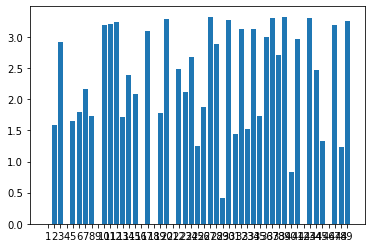

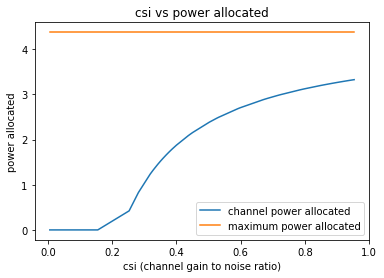

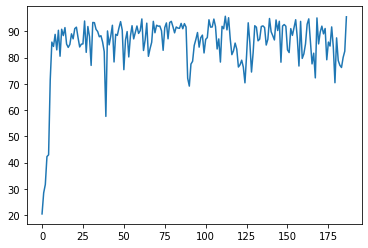

187
Power Allocated= 0.8094938273813757
CSI= 0.260274216021111
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.598904


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.085736
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.617971

Power Allocated= 3.4219297799519293
CSI= 0.8132291450659198
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.418523
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031472
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.148165

Power Allocated= 3.6282002623627267
CSI= 0.9771395897737982
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.070307754235521
CSI= 0.6323959724685578
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.507189
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001360
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.019904

Power Allocated= 2.4147266977298867
CSI= 0.44705348843521175
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.643359
Model client5 T

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.007030
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 1.495194767658674
CSI= 0.3168165533048769
SNR= 20.18554291572515
Client: client12
Model client12 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.261456
Model client12 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client12 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0.6070620454851046
CSI= 0.24724730600563316
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.488327
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.365012

Power Allocated= 1.6172350301594798
CSI= 0.32955873596550367
SNR= 20.466394740873444
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.574059
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000001
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.140977

Power Allocated= 3.3961175885998665
CSI= 0.79

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.2006, Accuracy: 9442/10000 (94%)

Power in training Round= 97.99517146414038



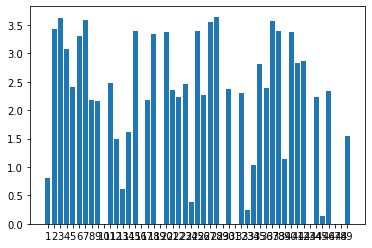

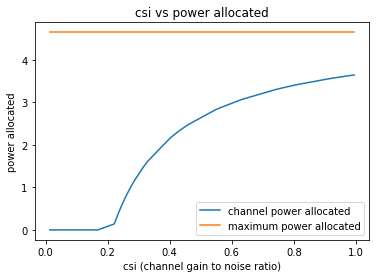

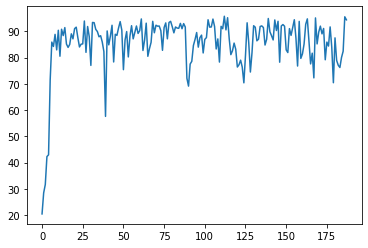

188
Power Allocated= 3.171173997720398
CSI= 0.9107868892156122
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.8881302481311573
CSI= 0.41999240541578464
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.755354


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009777
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.045877

Power Allocated= 2.7763798440381278
CSI= 0.6699064059390595
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.482869
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.094067

Power Allocated= 2.80094962257097
CSI= 0.681117222185557
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.710892
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000000
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.051884132266158
CSI= 0.4510108515879645
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.515592
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.100016
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028892

Power Allocated= 3.152855771555624
CSI= 0.8958406830582955
SNR

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client20 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.203664
Model client20 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.041062

Power Allocated= 1.0325948036176342
CSI= 0.3089727974948666
SNR= 21.401971926297648
Client: client21
Model client21 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.591926
Model client21 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.035340
Model client21 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.083900

Power Allocated= 2.1362972041964725
CSI= 0.46886095619493395
SNR= 21.468728856918247
Client: client22
Model client22 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.452652
Model client22 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000477
Model client22 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.210810

Power Allocated= 2.292535637703043
CSI= 0.5059218032331672
SNR= 21.659324222483548
Client: client23
Model client23 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.266341
Model client23 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.046672
Model client23 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.212595

Power Allocated= 3.2612751708572114
CSI= 0.9

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5633, Accuracy: 8689/10000 (87%)

Power in training Round= 98.00610411390602



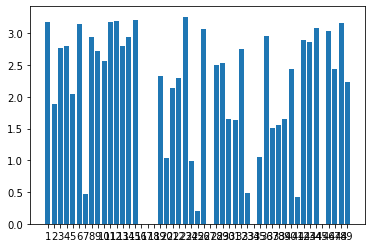

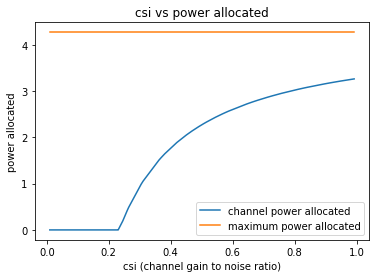

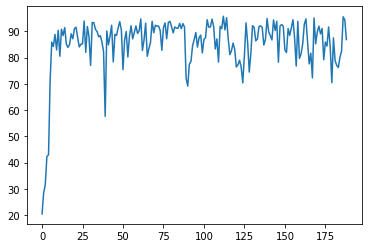

189
Power Allocated= 1.73650018229809
CSI= 0.36079466783438785
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.857948


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.475664
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.140473

Power Allocated= 3.256939515331578
CSI= 0.7992197991697885
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.052948
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.004547
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.1938035477752056
CSI= 0.7608287492482062
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.879878
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.291971
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001691

Power Allocated= 3.1693204779165947
CSI= 0.7469156354489621
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.310980
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.013336
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.006992

Power Allocated= 0
CSI= 0.1875079045396858
SNR= 18.42900477

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.056501
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.069782

Power Allocated= 0
CSI= 0.015193067098508317
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.4160107085202185
CSI= 0.9156259305790089
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.546383
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.156308
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.075794

Power Allocated= 3.141575325689103
CSI= 0.7317513416467814
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.942485
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.008576
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.218111

Power Allocated= 0
CSI= 0.18038334699433922
SNR= 20.095472826104007
Client: client11
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.9048983158284387
CSI= 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4411, Accuracy: 8626/10000 (86%)

Power in training Round= 98.00294628781026



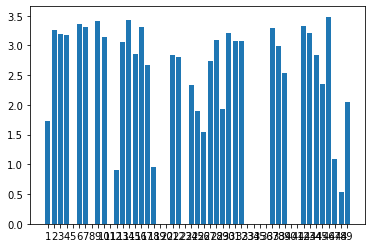

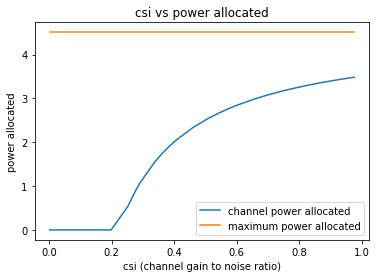

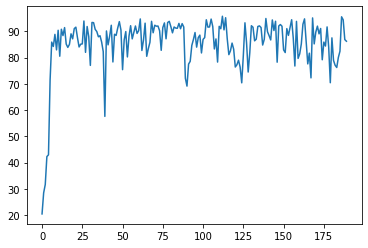

190
Power Allocated= 2.260225343116688
CSI= 0.49400651472925494
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.742501394168979
CSI= 0.6485131613473528
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.476163


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.021734
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 1.9624804391694028
CSI= 0.4306614210953147
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.371883
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005244
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.218883

Power Allocated= 2.489257000971673
CSI= 0.5570307137830336
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.382440
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.050083
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 0
CSI= 0.1059842557066113
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.0533385937963686
CSI= 0.812247686708938
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.461160


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.101282
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003408

Power Allocated= 0
CSI= 0.2166924025583652
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.099685128222201
CSI= 0.8440207335984177
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.683650
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000156
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.004511

Power Allocated= 0.5454428053517368
CSI= 0.2674478039408964
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.543194
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.108373
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.294702

Power Allocated= 2.0038283418563863
CSI= 0.4384692190339161
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.404715
Model client10 Train Epoch: 2 [0

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3017, Accuracy: 9010/10000 (90%)

Power in training Round= 97.99617894121184



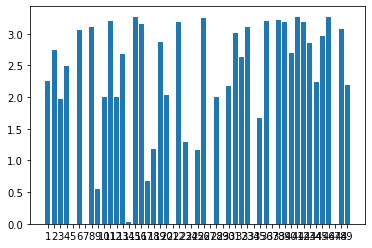

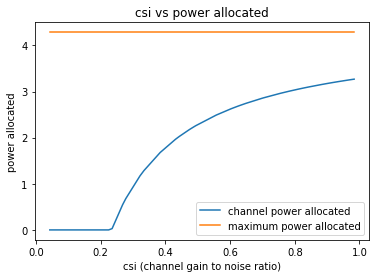

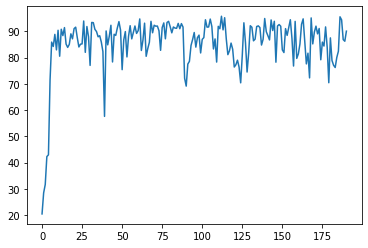

191
Power Allocated= 3.034771476075133
CSI= 0.7920120057931374
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.4781261543162167
CSI= 0.5496763260601668
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.476970


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.027937
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.022966

Power Allocated= 0.5328878621750923
CSI= 0.2656401808093749
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.214402
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.005901
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000016

Power Allocated= 3.2577701420719887
CSI= 0.961900601407214
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.515294
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000004
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.032864

Power Allocated= 1.7008586779142574
CSI= 0.38513087916562505
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.001108
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.290952
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.077989

Power Allocated= 3.173285633549644
CSI= 0.8896061364020882

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002787
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.772930285155166
CSI= 0.6559750113415098
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.432756
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.031191
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.035981

Power Allocated= 1.7357414683812005
CSI= 0.39037535333388884
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.133099
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.036223
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.390940

Power Allocated= 3.2627990751208897
CSI= 0.9665762533143577
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.786628
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012069
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.038389

Power Allocated= 0
CSI= 0.07225922792673334
SNR= 20

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5234, Accuracy: 8366/10000 (84%)

Power in training Round= 97.99852016675892



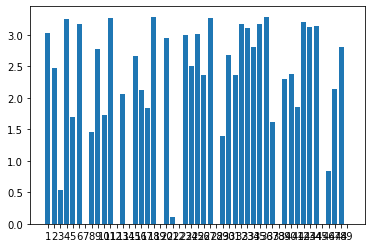

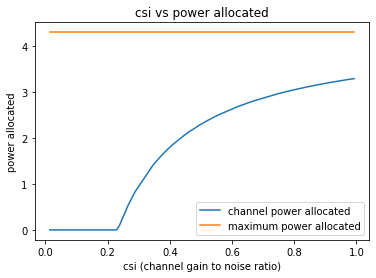

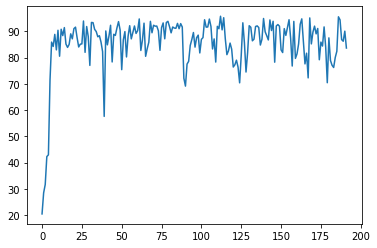

192
Power Allocated= 1.9680764532971065
CSI= 0.41961182675877307
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.420511


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.014814
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012218

Power Allocated= 3.110569775482234
CSI= 0.806021546454171
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.334012
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.122977
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000049

Power Allocated= 0
CSI= 0.0843472545632663
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.17739317887765593
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.08960934072392479
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.10668695208811474
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.763967111804006


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.066090
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.021868

Power Allocated= 3.046858394763195
CSI= 0.766651868097354
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.231796
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006206
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.661125190967893
CSI= 0.5916787924637967
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.231715
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.253899
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.042008

Power Allocated= 2.837728605744053
CSI= 0.6607189658290689
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.826774
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000006
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.6488920041675463
CSI= 0.5874269275194915

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.6317, Accuracy: 8030/10000 (80%)

Power in training Round= 98.00185273055702



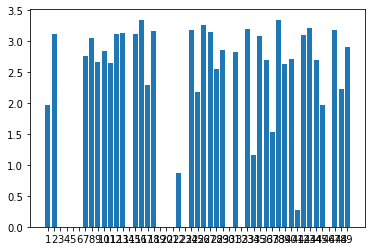

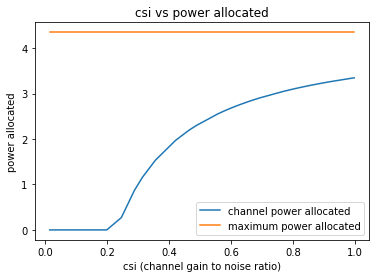

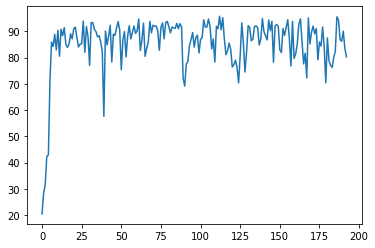

193
Power Allocated= 3.7927727228447
CSI= 0.9790481711282055
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.737153


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.053649
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.061390

Power Allocated= 3.266552228494576
CSI= 0.646153157681799
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.072761
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000046
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.048049

Power Allocated= 2.780320740998143
CSI= 0.49167781602851846
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.333529
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.006294
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.163119

Power Allocated= 3.779789595801507
CSI= 0.9667595867830919
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.779346
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.075396
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.036968

Power Allocated= 3.3595539333489
CSI= 0.6874652439411773
SNR=

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.151760
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.064991

Power Allocated= 2.6029895592070758
CSI= 0.4522465280032929
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.506716
Model client8 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001277
Model client8 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.012557

Power Allocated= 3.7793939142244515
CSI= 0.9663899146560828
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.464776
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.094997
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.169333

Power Allocated= 0
CSI= 0.16591088954551936
SNR= 19.996251205202647
Client: client10
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.913609120491794
CSI= 0.5261596572446892
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.188712
Model client11 Train Epoch: 2 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4478, Accuracy: 8650/10000 (86%)

Power in training Round= 97.99636475151053



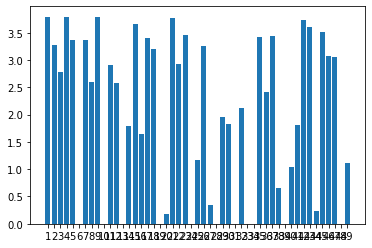

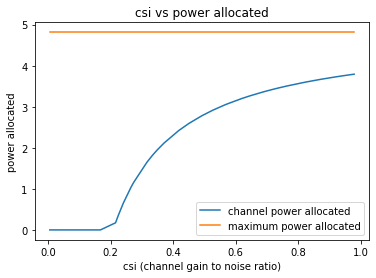

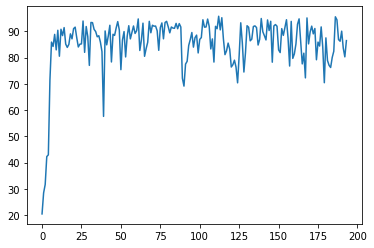

194
Power Allocated= 0
CSI= 0.12005295338161548
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.41067717498814
CSI= 0.5798344888903946
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.462968


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.066585
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.029171

Power Allocated= 2.2414327586803675
CSI= 0.5280180935037737
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.02678732861447275
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5405329253980717
CSI= 0.6270479669039833
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.083094
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.081983
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.064300

Power Allocated= 2.908010233372524
CSI= 0.8147986866578925
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.803243
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000059
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 3.11501058398

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3825, Accuracy: 9201/10000 (92%)

Power in training Round= 98.00082604806511



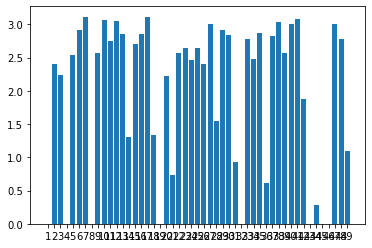

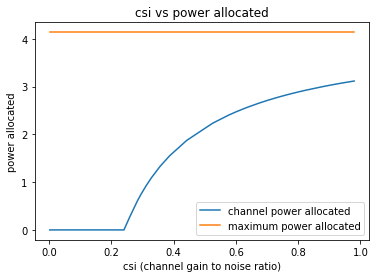

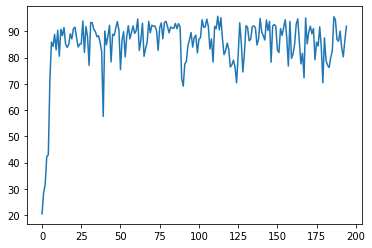

195
Power Allocated= 3.6114611939381014
CSI= 0.9100386753166446
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.610934547899584
CSI= 0.9096027315952228
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.529942


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.009517
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.502193

Power Allocated= 0.8038572927174799
CSI= 0.2559863496821516
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.177553
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001356
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000473

Power Allocated= 0
CSI= 0.15593849897929446
SNR= 18.343831307574284
Client: client4
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5878970290882566
CSI= 0.4711605985159507
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.689269


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.158220
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000743

Power Allocated= 0
CSI= 0.02877979231896377
SNR= 18.596146162761706
Client: client6
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.005430879791585
CSI= 0.3697015239883016
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.338820
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.062260
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.007486

Power Allocated= 0
CSI= 0.1593682877412066
SNR= 19.240894052140593
Client: client8
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.599656880376822
CSI= 0.3214753185678356
SNR= 19.62336625054567
Client: client9
Model client9 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.518853
Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.046460
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.083032

Power Allocated= 1.8805962427773162
CSI= 0.353391

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.4743, Accuracy: 8527/10000 (85%)

Power in training Round= 97.99511089553309



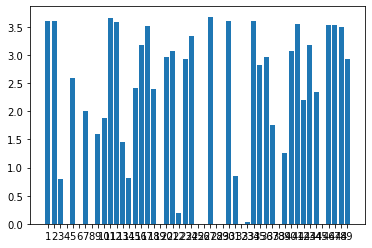

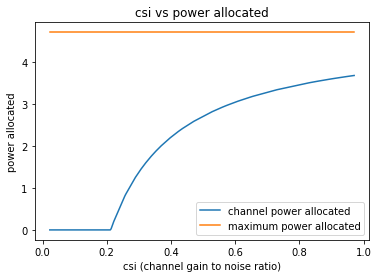

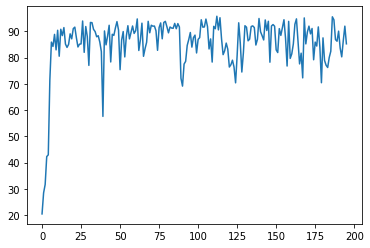

196
Power Allocated= 0
CSI= 0.17457782266031896
SNR= 15.303890775815747
Client: client1
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.234731573435962
CSI= 0.9711936668078905
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.565738


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated du

Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000006
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001099

Power Allocated= 2.9004388949220097
CSI= 0.7331628621710884
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.004515
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.012328
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.003166

Power Allocated= 2.7900189799297306
CSI= 0.678254258975809
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.417438
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.094796
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.028258

Power Allocated= 0
CSI= 0.18916349721090375
SNR= 18.429004777441218
Client: client5
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.814664638132895
CSI= 0.6897847159046724
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.982720
Model client6 Train Epoch: 2 [0/1

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.5024, Accuracy: 8501/10000 (85%)

Power in training Round= 97.99833086988569



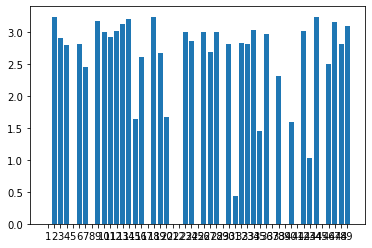

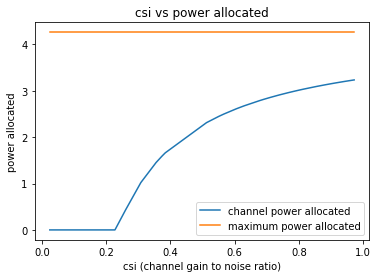

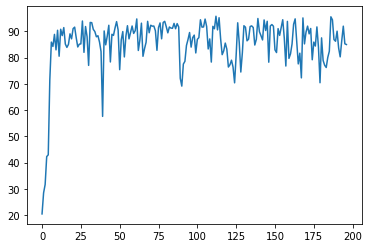

197
Power Allocated= 2.5996370072968977
CSI= 0.5091462068187274
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.583821


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.054893
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.023121

Power Allocated= 0
CSI= 0.012790766494650385
SNR= 16.751553780503095
Client: client2
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.14050738125184792
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 0.5605211841365838
CSI= 0.2498008962674294
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.337958


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.114134
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.137341

Power Allocated= 3.192187546526897
CSI= 0.729117082511124
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.919422
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.116131
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.243126

Power Allocated= 2.6422824987718094
CSI= 0.5204465536603101
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.597268
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002858
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.047253

Power Allocated= 0
CSI= 0.16475523835103312
SNR= 18.920581377071752
Client: client7
Poor Channel, client not taken for averaging in this round

Power Allocated= 3.353505432399605
CSI= 0.8263070034722099
SNR= 19.240894052140593
Client: client8
Model client8 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.371398
Model client8 Train Epoch: 2 [0/12

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3372, Accuracy: 9058/10000 (91%)

Power in training Round= 97.9935919366719



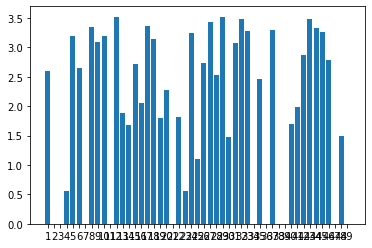

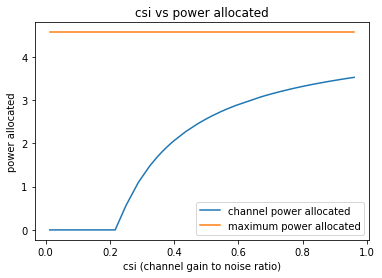

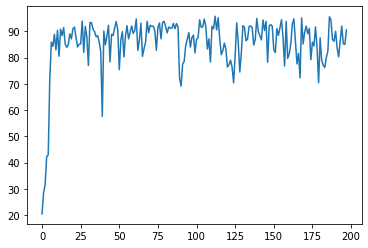

198
Power Allocated= 2.9482695738353892
CSI= 0.7855948292665641
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.622191


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.127272
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.287323

Power Allocated= 0.8245811137713157
CSI= 0.2944112563115896
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.422308
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.188374
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.053534

Power Allocated= 0
CSI= 0.11025835443643228
SNR= 17.795767825462743
Client: client3
Poor Channel, client not taken for averaging in this round

Power Allocated= 1.5078092340525973
CSI= 0.36854387489325335
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.943865


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.299414
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 1.3756602019230346
CSI= 0.3514283591930596
SNR= 18.429004777441218
Client: client5
Model client5 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.939513
Model client5 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.064995
Model client5 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.082852

Power Allocated= 1.9216531531327798
CSI= 0.43487010786001035
SNR= 18.596146162761706
Client: client6
Model client6 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.139339
Model client6 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000366
Model client6 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000000

Power Allocated= 2.8659541604027003
CSI= 0.7378787466882047
SNR= 18.920581377071752
Client: client7
Model client7 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.683940
Model client7 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.109197
Model client7 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.009992

Power Allocated= 2.6770917994420413
CSI= 0.64762704621634

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.3032, Accuracy: 9152/10000 (92%)

Power in training Round= 98.00627741808155



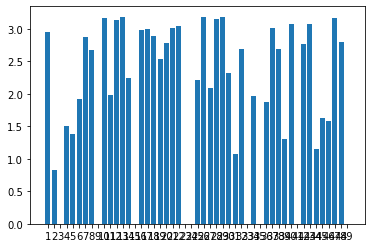

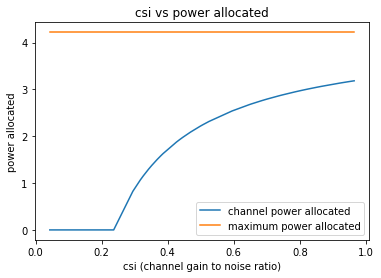

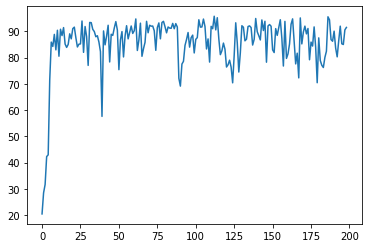

199
Power Allocated= 2.8249155387095675
CSI= 0.8174344623989442
SNR= 15.303890775815747
Client: client1
Model client1 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.559333


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client1 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.000173
Model client1 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.070931

Power Allocated= 2.768799080974892
CSI= 0.7815820984874542
SNR= 16.751553780503095
Client: client2
Model client2 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.062692
Model client2 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.046480
Model client2 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000017

Power Allocated= 1.6464568780791269
CSI= 0.416354691414732
SNR= 17.795767825462743
Client: client3
Model client3 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.424924
Model client3 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.002591
Model client3 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.000004

Power Allocated= 0.8600101054297324
CSI= 0.3136521721849751
SNR= 18.343831307574284
Client: client4
Model client4 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.805312
Model client4 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001444
Model client4 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.058798

Power Allocated= 2.8660007660323346
CSI= 0.8458416137592153


/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in true_divide


Model client9 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.059715
Model client9 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.059673

Power Allocated= 2.4241812807451084
CSI= 0.6157355197367719
SNR= 19.996251205202647
Client: client10
Model client10 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.106179
Model client10 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.001702
Model client10 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.050914

Power Allocated= 1.6654073829586915
CSI= 0.4196659106827888
SNR= 20.095472826104007
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.232290
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.024767
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.001995

Power Allocated= 0
CSI= 0.018871559801473148
SNR= 20.18554291572515
Client: client12
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.7290570814248656
CSI= 0.7580362527788073
SNR= 20.19679116644772
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 0.719777
Model client14 Train 

/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)



Test set: Average loss for Final model: 0.1893, Accuracy: 9479/10000 (95%)

Power in training Round= 97.99835653686088



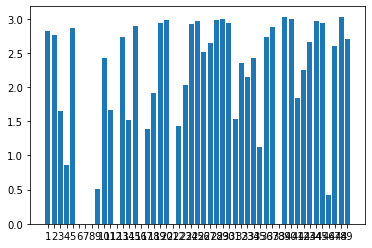

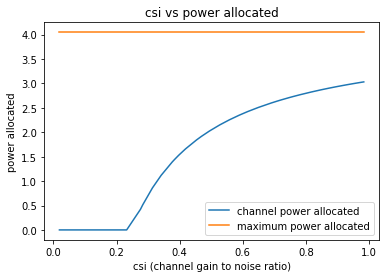

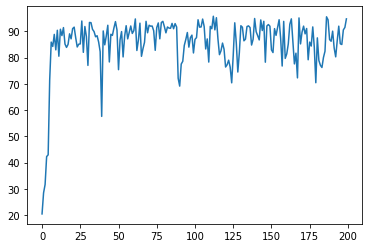

200


In [12]:
for fed_round in range(args.rounds):
    
    client_good_channel=[] #to check which clients have a good channel, only those will be taken for averaging per round

    # Training 
    #even slot
    
    snr=[] #snr of the channel
    csi=[] #csi of the channel
    for ii in range (int(args.clients)-1):
        #snr.append(random.uniform(args.snr_low, args.snr_high))
        csi.append(random.uniform(args.csi_low,args.csi_high))
    
    # if(fed_round==0):
    #     snr,cluster_head=get_cluster()
    if(fed_round==0): #fed_round==0 or True                                        %%%static or moving
        snr,cluster_head=get_cluster(args.clients)
        temp=copy.deepcopy(cluster_head)
        temp1=copy.deepcopy(snr)
    else:
        #print(temp)
        cluster_head=copy.deepcopy(temp)
        snr=copy.deepcopy(temp1)
    #print(cluster_head)
    smallmu1=0
    gsmall1=3.402823466E+38 
    
    #water filling algorithm
    mu=1e-15
    while(mu<=1):
        #print("yay")
        #pn=max(1/mu-1/csi,0)
        g1=0
        pn1=0
        for jj in csi:
            pn=max(1/mu-1/jj,0)
            g1+=math.log(1+pn*jj) #capacity of a channel (shannon's law)
            pn1+=pn
        g=g1-mu*(pn1-P*(int(args.clients)-1))
        if(g<gsmall1):
            smallmu1=mu
            gsmall1=g
        mu+=0.00002

    #print(smallmu1)
    # poptim=max(1/smallmu1-1/csi1,0)
    # print(poptim)
    index=0
    members=[]
    for i in clients:
        if(i['hook'].id!=cluster_head):
            members.append(i)
        else:
            head=i
    for client in members:
        goodchannel=ClientUpdate(args, device, client,key_np,key,snr[index],csi[index],smallmu1)
        if(goodchannel):
            client_good_channel.append(client)
        index+=1
        
    po=[]    
    for jj in csi:
        po.append(max(1/smallmu1-1/jj,0))
    
    plt.bar([str(i) for i in range (1,len(po)+1)],po,)
    csi.sort()
    po=[]
    for jj in csi:
        po.append(max(1/smallmu1-1/jj,0))
    fig,ax=plt.subplots()
    line1=ax.plot(csi,po,label="channel power allocated")
    line2=ax.plot(csi,[1/smallmu1]*len(csi),label="maximum power allocated")
    ax.set_title("csi vs power allocated")
    ax.set_xlabel("csi (channel gain to noise ratio)")
    ax.set_ylabel("power allocated")
    ax.legend()
    #plt.show()
    

#     # Testing 
#     for client in active_clients:
#         test(args, client['model'], device, client['testset'], client['hook'].id)
    
    
    
    print()
    print("Clients having a good channel and considered for training")
    for no in range (len(client_good_channel)):
        print(client_good_channel[no]['hook'].id)
        
        
        
    # Averaging 
        #odd slot

    head['model'] = averageModels(head['model'],client_good_channel)
    # Testing the average model
    #test(args, global_model, device, global_test_loader, 'Global')
    ac=test(args, head['model'], device, global_test_loader, 'Final')
    accuracy.append(ac)
    
    print("Power in training Round=",sum(po))
    #print("Power cap=",P*len(active_clients))
    
    #print("Total Power =",power_odd+power_even)
    print()
            
    # Share the global model with the clients
    index=0
    for client in members:
        client['model'].load_state_dict(head['model'].state_dict())
        #client=CLientReturn(client,snr[index],csi[index],smallmu1) #CHANGE:Commented
        index+=1
        #client['model']=torch.quantization.quantize_dynamic(client['model'],{torch.nn.Conv2d},dtype=torch.qint8)
        #print(client['model'].conv1.weight.data)
    fig1,ax1=plt.subplots()
    ax1.plot([i for i in range(len(accuracy))],accuracy)
    plt.show()
    print(rc)
    rc+=1

In [13]:
print(accuracy)

[20.39, 28.42, 31.61, 42.26, 42.93, 71.48, 85.93, 84.27, 88.87, 82.96, 90.44, 80.54, 90.83, 88.41, 91.46, 85.18, 83.91, 85.04, 89.08, 87.17, 91.07, 91.63, 87.62, 84.07, 85.14, 85.24, 93.97, 82.02, 91.87, 88.01, 77.04, 93.42, 93.34, 90.79, 89.95, 87.96, 88.36, 85.95, 82.29, 57.59, 90.18, 84.88, 88.25, 92.35, 78.35, 88.92, 88.48, 91.32, 93.74, 90.53, 75.41, 86.75, 89.94, 80.27, 88.18, 92.18, 87.16, 89.61, 92.07, 89.23, 90.29, 94.76, 82.73, 86.72, 93.15, 80.51, 83.43, 85.85, 93.85, 89.49, 92.36, 92.0, 92.05, 90.25, 82.79, 91.47, 93.24, 87.18, 93.4, 93.85, 91.8, 89.46, 91.69, 91.28, 91.19, 93.06, 91.03, 92.98, 91.68, 72.14, 69.14, 77.55, 78.59, 84.65, 86.93, 89.58, 84.01, 87.62, 88.59, 81.79, 86.97, 87.65, 94.45, 91.63, 91.7, 94.71, 91.88, 83.31, 87.14, 78.31, 91.94, 91.03, 95.79, 90.59, 95.23, 87.18, 81.14, 82.62, 85.55, 83.22, 76.42, 77.28, 79.03, 76.39, 70.39, 80.91, 93.29, 85.65, 74.51, 81.88, 92.17, 91.6, 86.42, 87.05, 91.88, 92.11, 91.48, 84.81, 87.0, 94.93, 89.87, 88.37, 86.75, 94.3